In [1]:
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from xgboost import XGBClassifier
from sklearn.ensemble import HistGradientBoostingClassifier,RandomForestClassifier
from sklearn.model_selection import cross_val_predict, StratifiedKFold
from src.wrapped import Wrapped
from src.analysesV02 import Analytics
from src.trainV02 import TrainModels

/home/ubuntu/.cache/pypoetry/virtualenvs/model-52rUI7Ti-py3.10/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Avaliando Resultados Preliminares

In [2]:
ac = Analytics()
tm = TrainModels()
wp = Wrapped(
    '../data/row/',
    '../data/processed/',
    '../data/files/'
)

- Importando base de instrumentos para avaliação de modelos

In [3]:
# dataframe
df = wp.load_data('df_instrumentos_features_selecionadas').drop(columns=['file_name'])

# dataframes por instrumentos
inst_corda = ["cello", "guitar", "violin", "bass", "banjo", "mandolin", "ukulele"]
inst_percusao = ["mallet_percussion", "drums", "cymbals"]
inst_sopro = ["clarinet", "trombone", "flute", "trumpet", "saxophone"]
inst_aerofone = ["accordion", "organ", "piano"] 

df_inst_aerofone = df[df['instrumento'].isin(inst_aerofone)]
df_inst_sopro = df[df['instrumento'].isin(inst_sopro)]
df_inst_corda = df[df['instrumento'].isin(inst_corda)]
df_inst_percusao = df[df['instrumento'].isin(inst_percusao)]

## Aerofone 

### Model 1

- Detected outilers

In [23]:
outlier_model_1_aerofone = ac.detected_outilers_knn(metric="euclidean", algorithm="kd_tree", neighbors=3, dataframe=df_inst_aerofone)

algorithm parameter is deprecated and will be removed in version 0.7.6. By default, ball_tree will be used.


- Removed outilers

In [24]:
df_inst_aerofone_01 = ac.show_inlers(dataframe=df_inst_aerofone, pred=outlier_model_1_aerofone["predictions"])
df_inst_aerofone_01

,tonnetz0,tonnetz1,chroma1,chroma2,chroma3,chroma4,chroma5,chroma6,chroma7,mfcc0,...,spectral_band3,spectral_band4,spectral_centroid,spectral_onset,spectral_rolloff,spectogram,mel_spectogram,zero_crossing_rate,zero_crossing,instrumento
0,0.010380,0.038218,0.513887,0.581963,0.434641,0.293949,0.317826,0.271148,0.548258,-24.170067,...,2949.581321,3409.640722,2600.055158,1.098243,5260.821321,-44.640682,-30.202150,0.149672,33095,accordion
1,0.084643,-0.035337,0.175587,0.429345,0.840043,0.384524,0.282545,0.346341,0.482365,-90.556145,...,3038.064172,3516.595715,2385.271420,1.360742,5225.124166,-46.575737,-59.323132,0.112181,24785,accordion
2,-0.030127,0.082404,0.453814,0.219808,0.228484,0.446050,0.178916,0.250981,0.327460,-106.124260,...,2735.690428,3256.491175,2069.850731,1.343197,4287.155824,-56.276707,-71.512909,0.096007,21230,accordion
4,-0.049096,-0.029067,0.484400,0.334572,0.441629,0.679485,0.382958,0.326033,0.205775,-226.263824,...,2223.101638,2883.225952,1251.374287,1.339527,2263.034730,-62.227947,-78.196365,0.059804,13214,accordion
5,-0.180964,0.569503,0.371429,0.329753,0.127768,0.165817,0.210350,0.864152,0.316520,-139.586807,...,2394.684608,3055.207315,1213.792172,0.863256,2477.767229,-66.244644,-79.955254,0.051793,11451,accordion
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5983,0.306987,0.197302,0.181270,0.482163,0.806090,0.410171,0.182062,0.128068,0.223802,-208.045074,...,1277.163672,1710.803257,821.680671,0.769584,1623.308746,-52.423000,-75.093781,0.038042,8414,piano
5984,0.339596,0.193580,0.309043,0.115449,0.066983,0.121548,0.543438,0.246675,0.126754,-359.998535,...,1681.556710,2431.230598,704.896231,0.654192,1007.089425,-73.745857,-80.000000,0.042257,9343,piano
5985,0.022141,0.249860,0.019285,0.019074,0.026441,0.062063,0.285675,0.762290,0.256367,-342.691559,...,1672.357525,2406.899185,647.666659,0.788650,1045.659338,-9.425838,-39.180683,0.026027,5747,piano
5986,-0.038987,0.185848,0.182197,0.123432,0.274012,0.223736,0.119671,0.259500,0.083546,-192.736328,...,1112.070824,1570.408078,1094.419047,1.140904,1788.779671,-25.643265,-72.219749,0.081838,18093,piano


- Train model


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
The loss 'auto' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 1575 - Acuracia do modelo HistGradientBoostingClassifier(loss='auto', max_bins=149, max_depth=15,
                               min_samples_leaf=12) do Fold 0: 0.7492063492063492


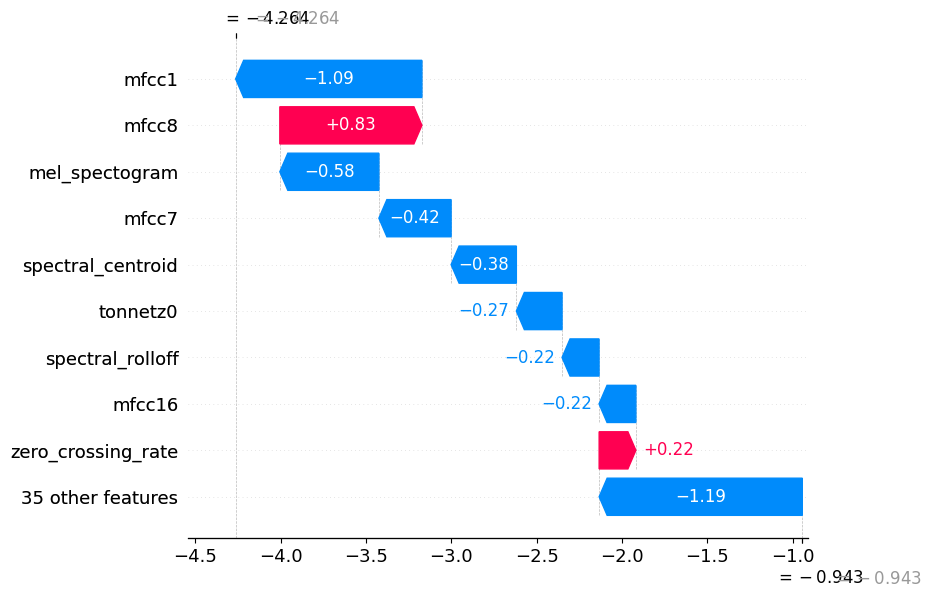

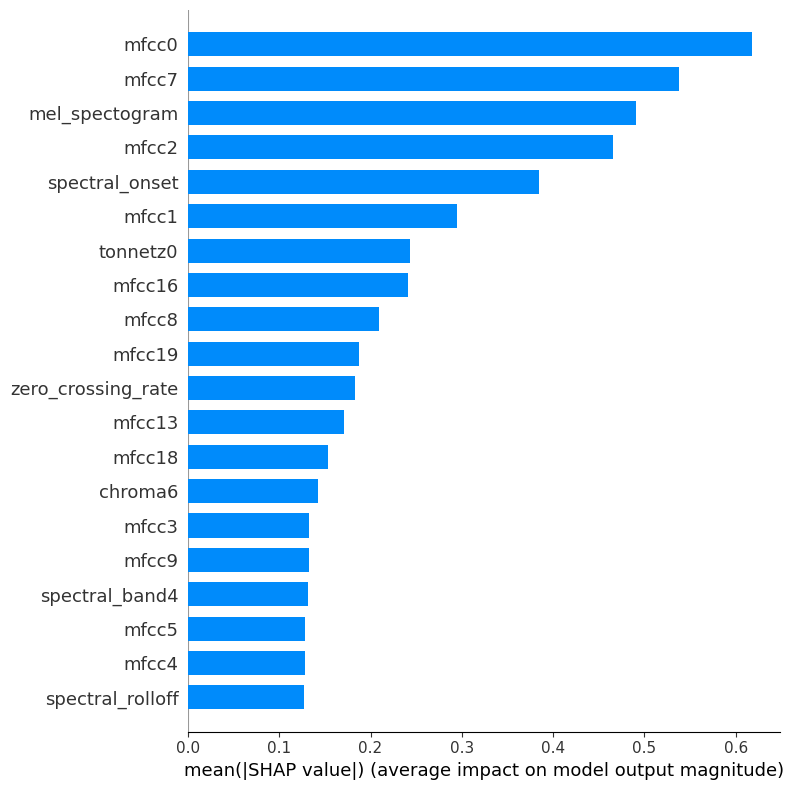

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


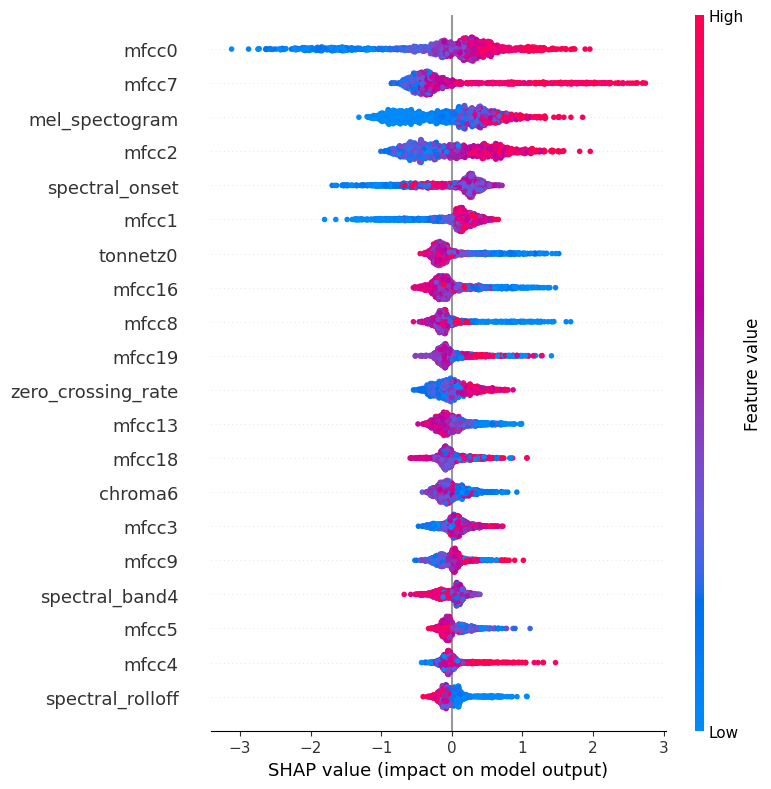

The loss 'auto' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 1575 - Acuracia do modelo HistGradientBoostingClassifier(loss='auto', max_bins=149, max_depth=15,
                               min_samples_leaf=12) do Fold 1: 0.7714285714285715


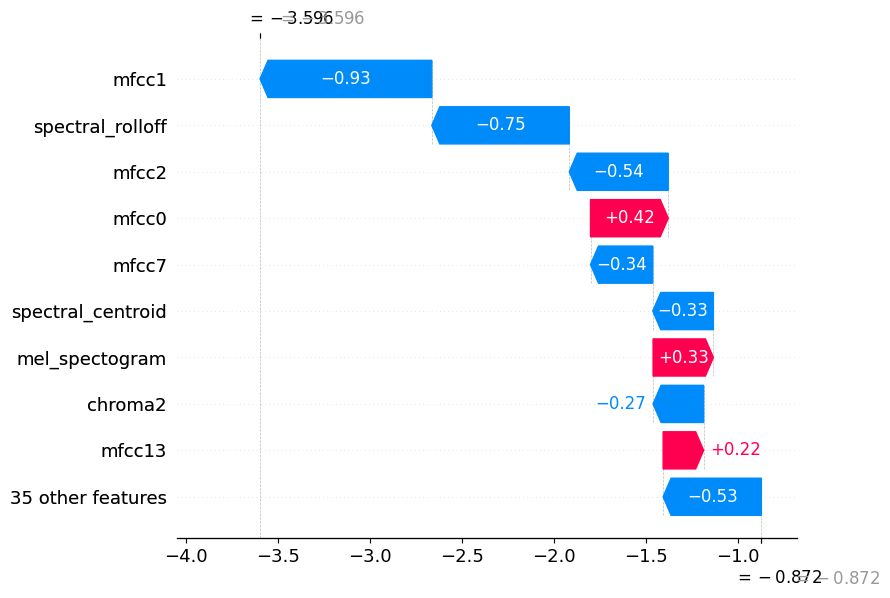

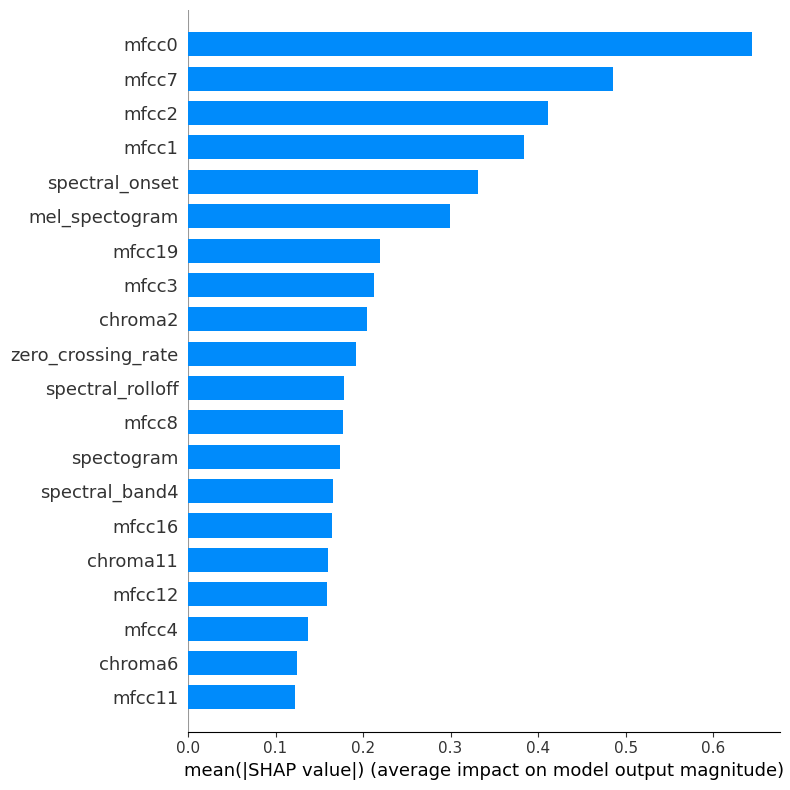

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


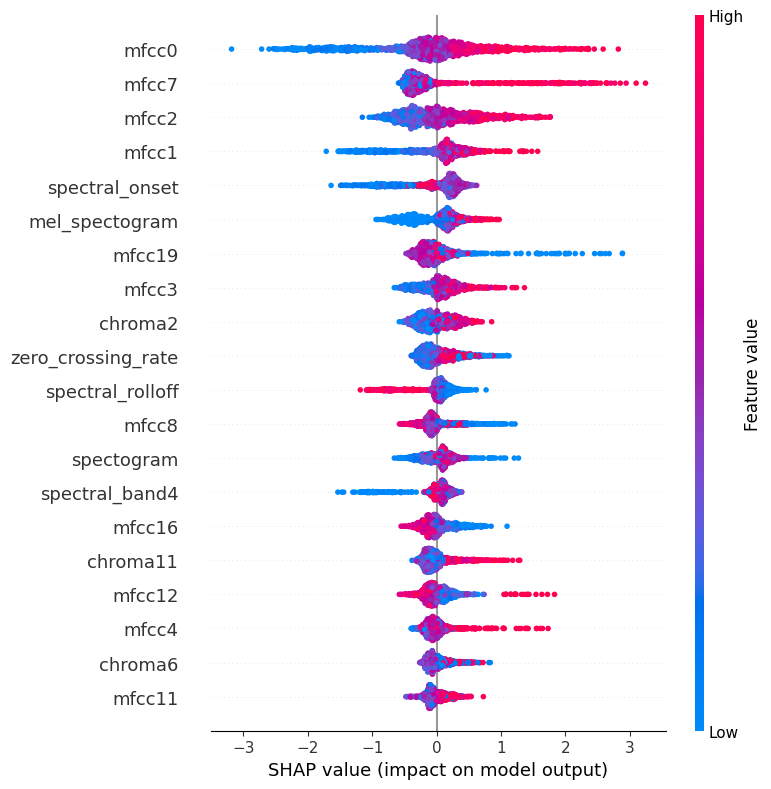

The loss 'auto' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 1575 - Acuracia do modelo HistGradientBoostingClassifier(loss='auto', max_bins=149, max_depth=15,
                               min_samples_leaf=12) do Fold 2: 0.7619047619047619


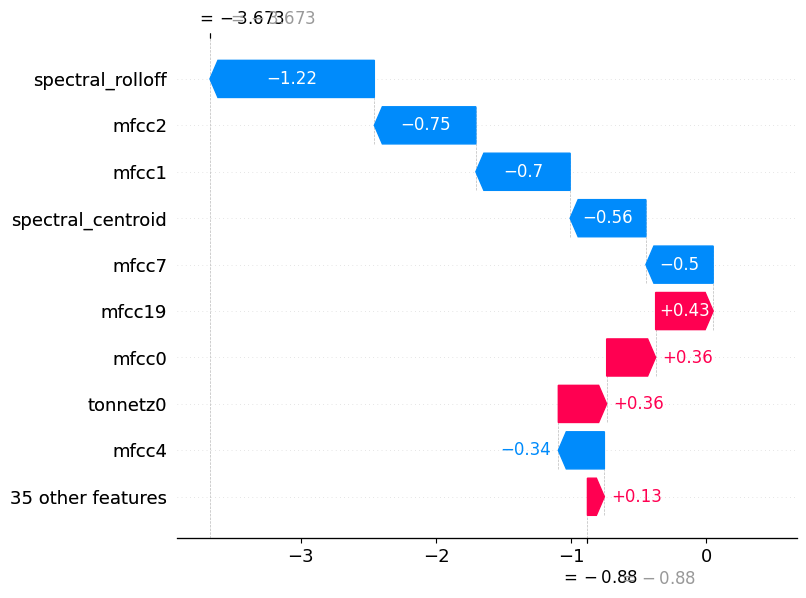

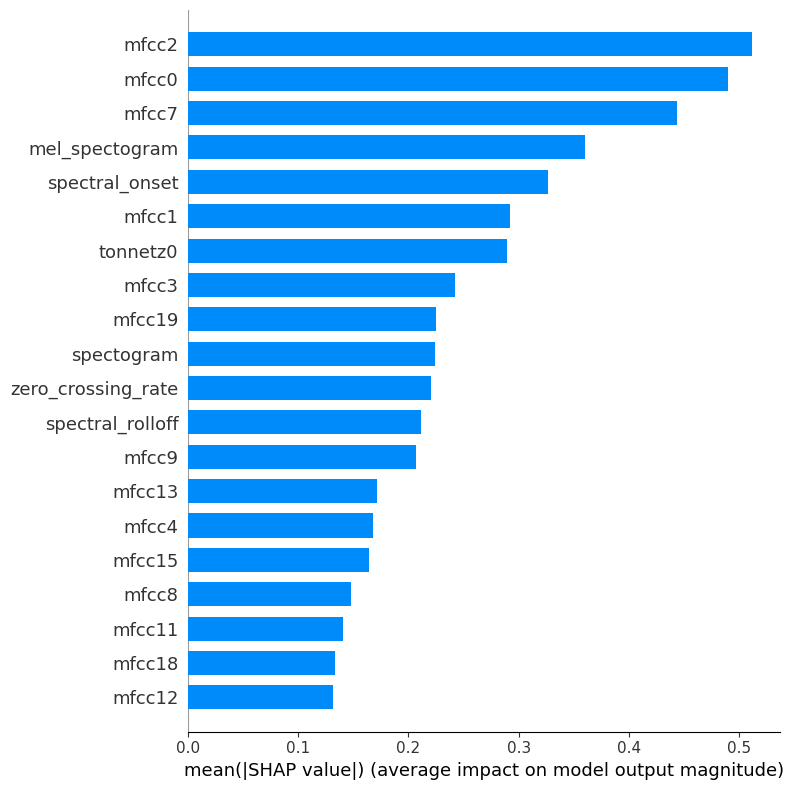

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


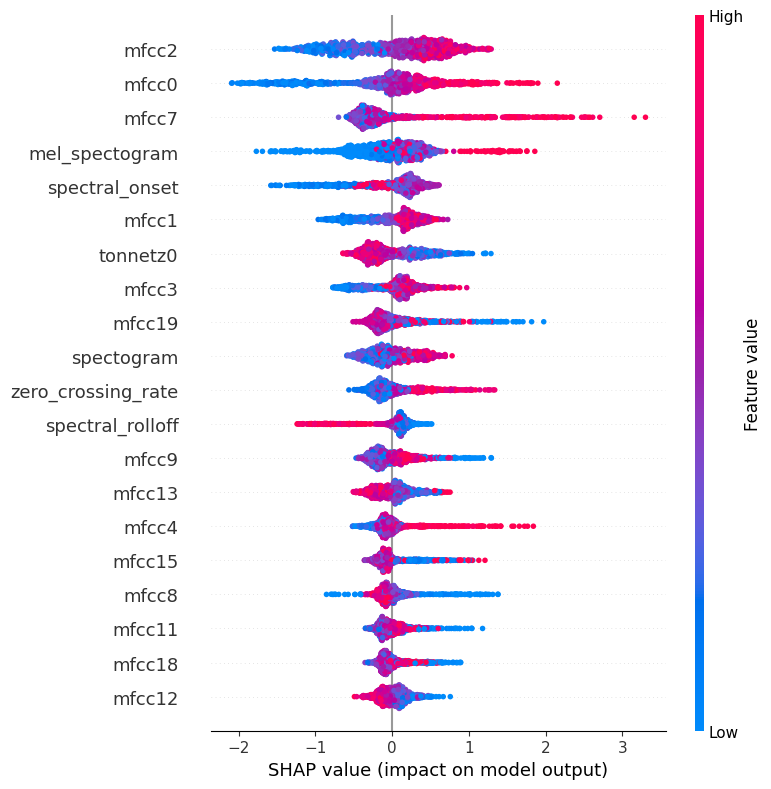

The loss 'auto' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 1575 - Acuracia do modelo HistGradientBoostingClassifier(loss='auto', max_bins=149, max_depth=15,
                               min_samples_leaf=12) do Fold 3: 0.7142857142857143


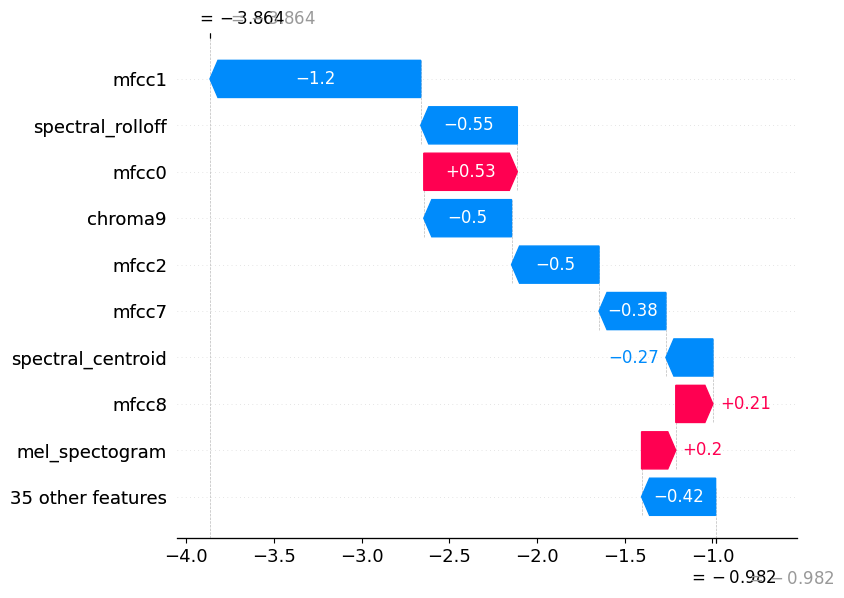

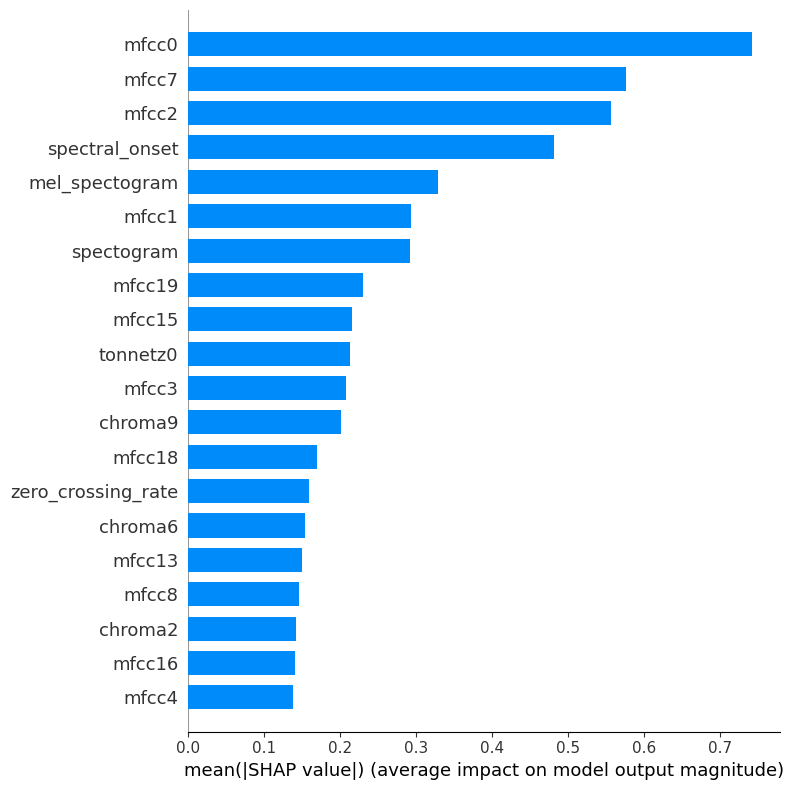

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


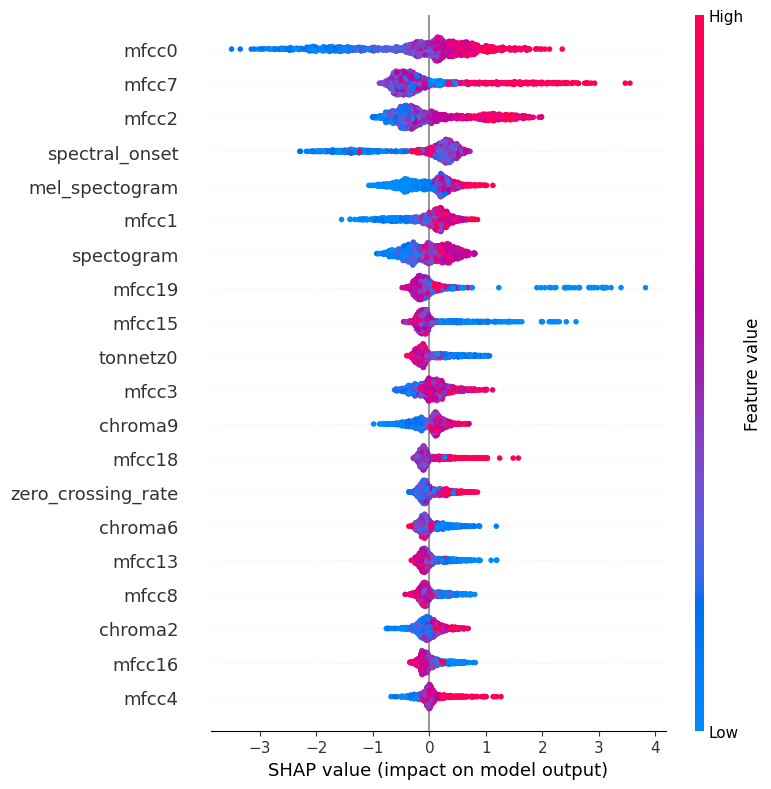

The loss 'auto' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 1575 - Acuracia do modelo HistGradientBoostingClassifier(loss='auto', max_bins=149, max_depth=15,
                               min_samples_leaf=12) do Fold 4: 0.7682539682539683


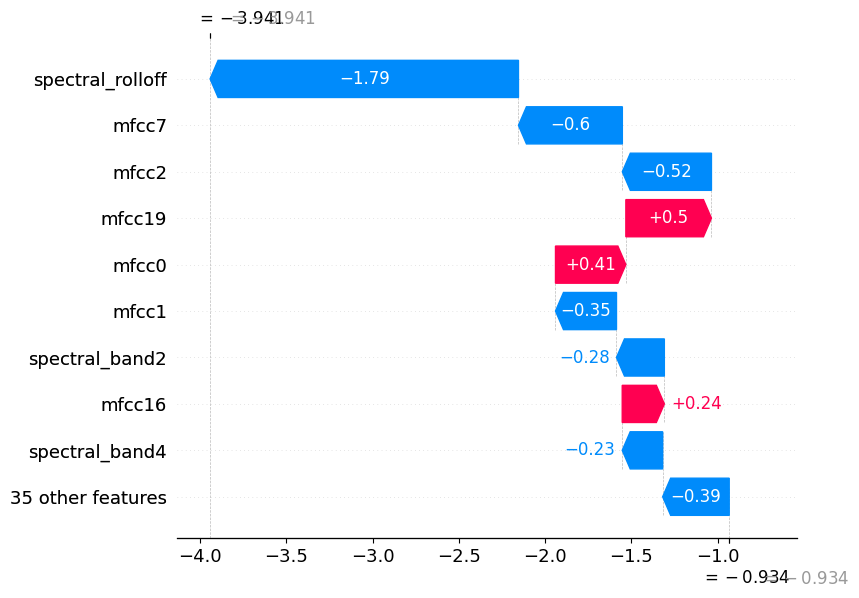

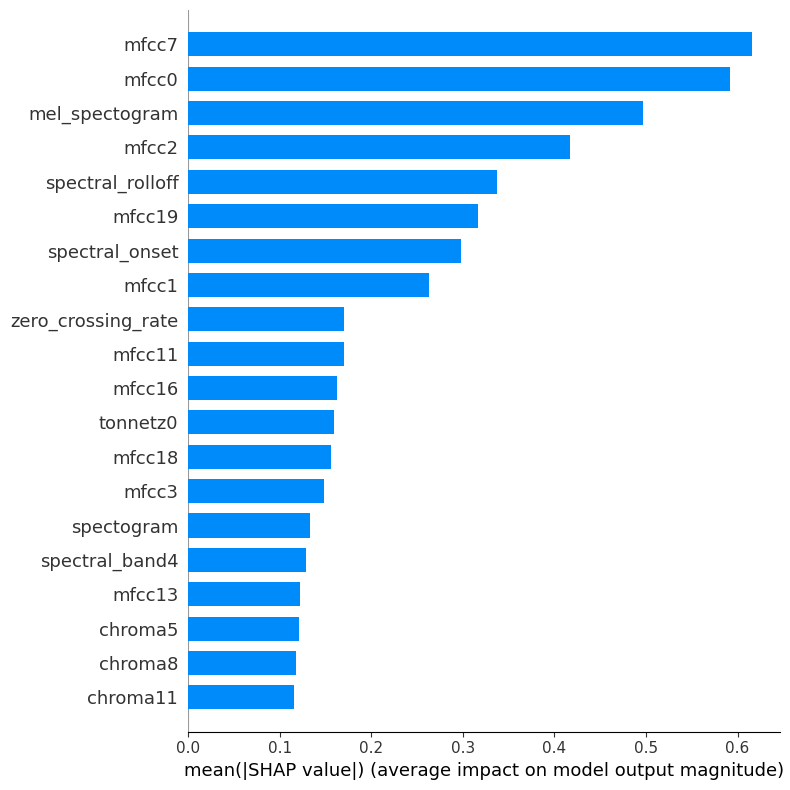

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


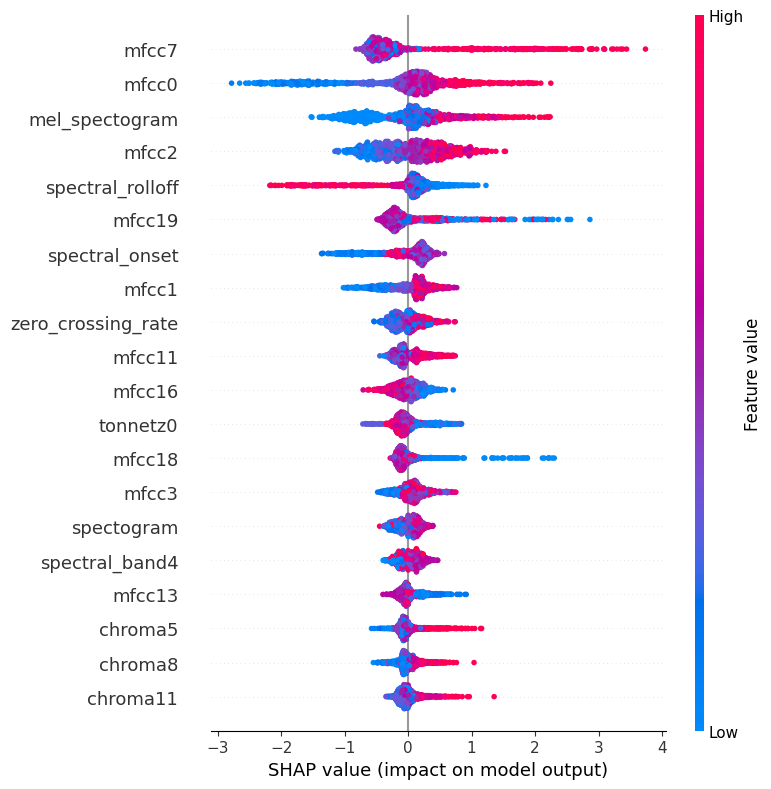

{'accuracy_mean': 75.3015873015873,
 'std': 0.020807580454824056,
 'predictions': array([0., 0., 0., ..., 2., 2., 1.]),
 'y_validate': array([0., 0., 0., ..., 2., 2., 2.]),
 'predictions_cat': array(['accordion', 'accordion', 'accordion', ..., 'piano', 'piano',
        'organ'], dtype=object),
 'y_validate_cat': array(['accordion', 'accordion', 'accordion', ..., 'piano', 'piano',
        'piano'], dtype=object)}

In [25]:
model = HistGradientBoostingClassifier(
    loss= 'auto',
    max_bins=149,
    max_depth=15,
    min_samples_leaf=12
)

results_aerofone_1 = tm.cross_validate_balancead(k=5, model=model, y_pred = "instrumento", dataframe=df_inst_aerofone_01, shap=True)
results_aerofone_1

In [26]:
df_inst_aerofone_01.labels.unique()

array([0, 1, 2])

In [27]:
df_inst_aerofone_01[["labels", "instrumento"]].query("instrumento == 'piano'")

,labels,instrumento
5360,2,piano
5361,2,piano
5362,2,piano
5363,2,piano
5364,2,piano
...,...,...
5983,2,piano
5984,2,piano
5985,2,piano
5986,2,piano


- Matriz de Confusão

<Axes: title={'center': 'Matriz confusão modelo 1 aerofone'}>

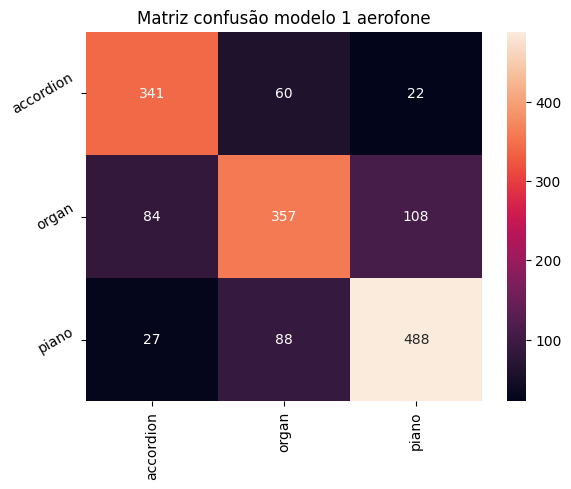

In [28]:
ac.matriz_confusion(
    results_aerofone_1['y_validate'],
    results_aerofone_1['predictions'],
    labels=np.unique(results_aerofone_1["predictions_cat"]),
    title='Matriz confusão modelo 1 aerofone',
    rename_labels=True
)

### Model 2

- Detected outilers

In [29]:
outlier_model_2_aerofone = ac.detected_outilers_knn(metric="minkowski", algorithm="brute", neighbors=3, dataframe=df_inst_aerofone)

algorithm parameter is deprecated and will be removed in version 0.7.6. By default, ball_tree will be used.


- Removed outilers

In [30]:
df_inst_aerofone_02 = ac.show_inlers(dataframe=df_inst_aerofone, pred=outlier_model_2_aerofone["predictions"])
df_inst_aerofone_02

,tonnetz0,tonnetz1,chroma1,chroma2,chroma3,chroma4,chroma5,chroma6,chroma7,mfcc0,...,spectral_band3,spectral_band4,spectral_centroid,spectral_onset,spectral_rolloff,spectogram,mel_spectogram,zero_crossing_rate,zero_crossing,instrumento
0,0.010380,0.038218,0.513887,0.581963,0.434641,0.293949,0.317826,0.271148,0.548258,-24.170067,...,2949.581321,3409.640722,2600.055158,1.098243,5260.821321,-44.640682,-30.202150,0.149672,33095,accordion
1,0.084643,-0.035337,0.175587,0.429345,0.840043,0.384524,0.282545,0.346341,0.482365,-90.556145,...,3038.064172,3516.595715,2385.271420,1.360742,5225.124166,-46.575737,-59.323132,0.112181,24785,accordion
2,-0.030127,0.082404,0.453814,0.219808,0.228484,0.446050,0.178916,0.250981,0.327460,-106.124260,...,2735.690428,3256.491175,2069.850731,1.343197,4287.155824,-56.276707,-71.512909,0.096007,21230,accordion
4,-0.049096,-0.029067,0.484400,0.334572,0.441629,0.679485,0.382958,0.326033,0.205775,-226.263824,...,2223.101638,2883.225952,1251.374287,1.339527,2263.034730,-62.227947,-78.196365,0.059804,13214,accordion
5,-0.180964,0.569503,0.371429,0.329753,0.127768,0.165817,0.210350,0.864152,0.316520,-139.586807,...,2394.684608,3055.207315,1213.792172,0.863256,2477.767229,-66.244644,-79.955254,0.051793,11451,accordion
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5983,0.306987,0.197302,0.181270,0.482163,0.806090,0.410171,0.182062,0.128068,0.223802,-208.045074,...,1277.163672,1710.803257,821.680671,0.769584,1623.308746,-52.423000,-75.093781,0.038042,8414,piano
5984,0.339596,0.193580,0.309043,0.115449,0.066983,0.121548,0.543438,0.246675,0.126754,-359.998535,...,1681.556710,2431.230598,704.896231,0.654192,1007.089425,-73.745857,-80.000000,0.042257,9343,piano
5985,0.022141,0.249860,0.019285,0.019074,0.026441,0.062063,0.285675,0.762290,0.256367,-342.691559,...,1672.357525,2406.899185,647.666659,0.788650,1045.659338,-9.425838,-39.180683,0.026027,5747,piano
5986,-0.038987,0.185848,0.182197,0.123432,0.274012,0.223736,0.119671,0.259500,0.083546,-192.736328,...,1112.070824,1570.408078,1094.419047,1.140904,1788.779671,-25.643265,-72.219749,0.081838,18093,piano


- Train model


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 1575 - Acuracia do modelo HistGradientBoostingClassifier(max_bins=191, max_depth=6, min_samples_leaf=16,
                               random_state=42) do Fold 0: 0.7428571428571429


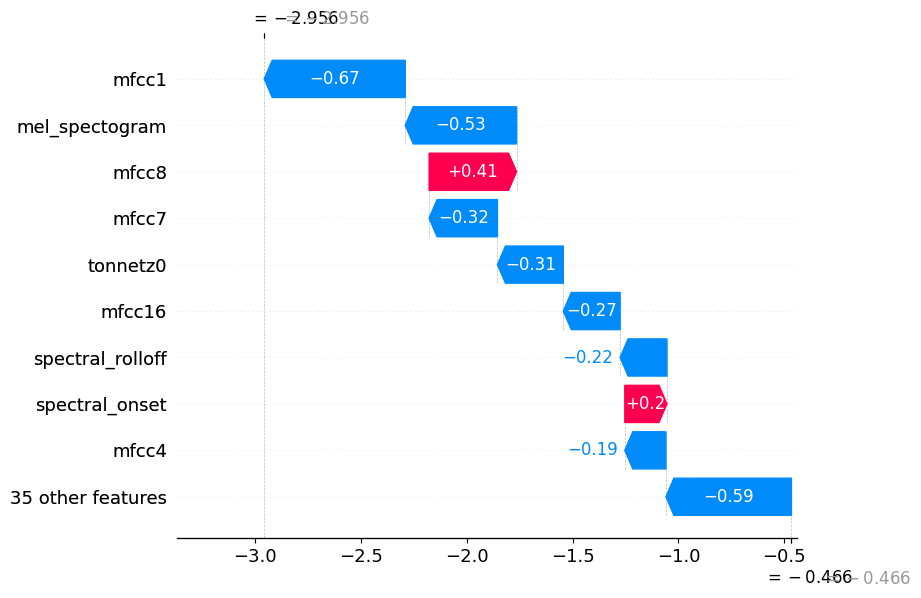

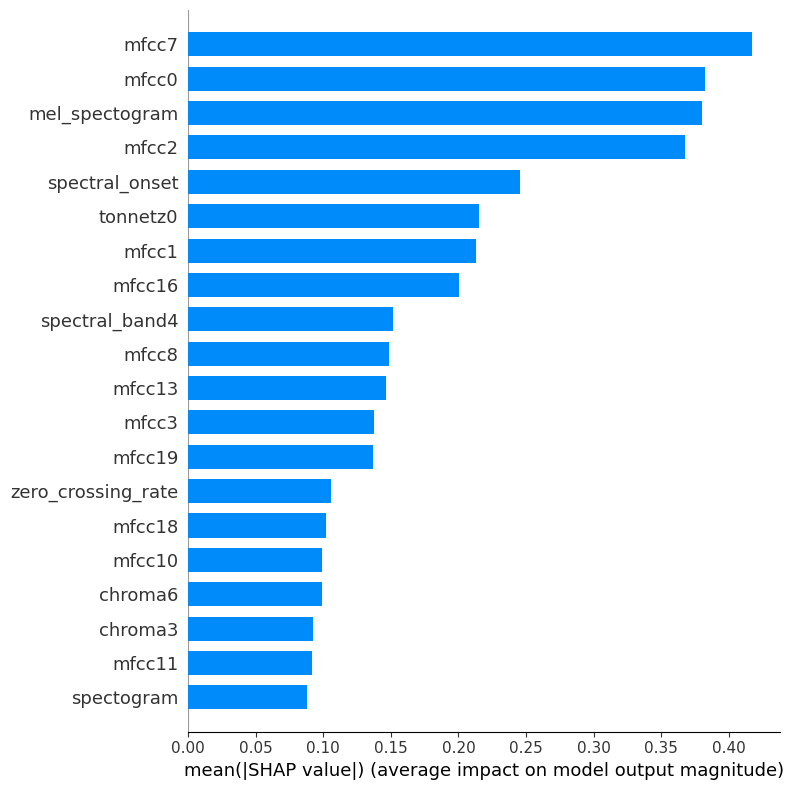

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


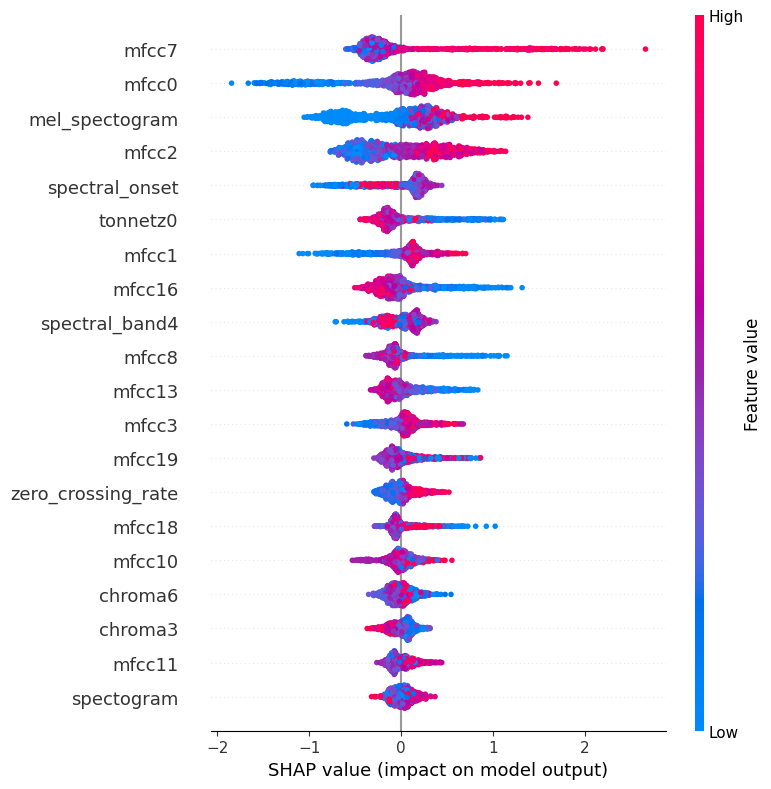

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 1575 - Acuracia do modelo HistGradientBoostingClassifier(max_bins=191, max_depth=6, min_samples_leaf=16,
                               random_state=42) do Fold 1: 0.7619047619047619


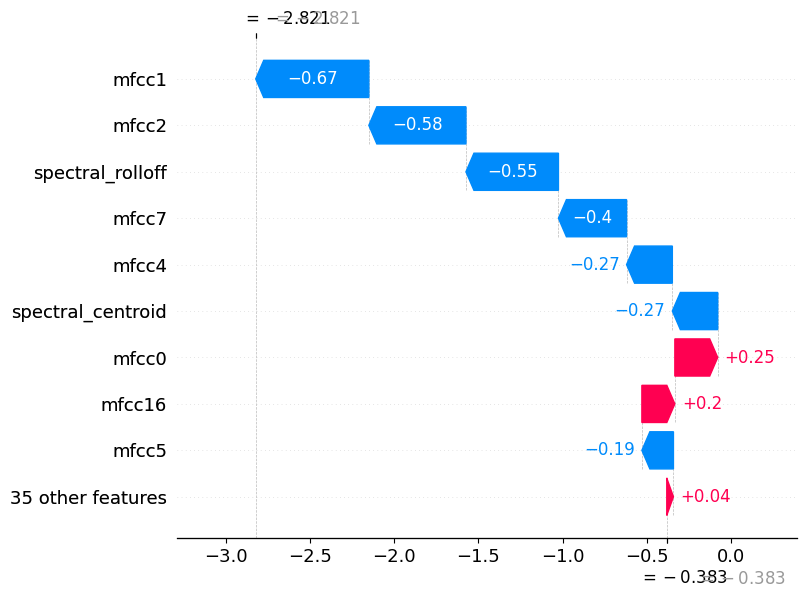

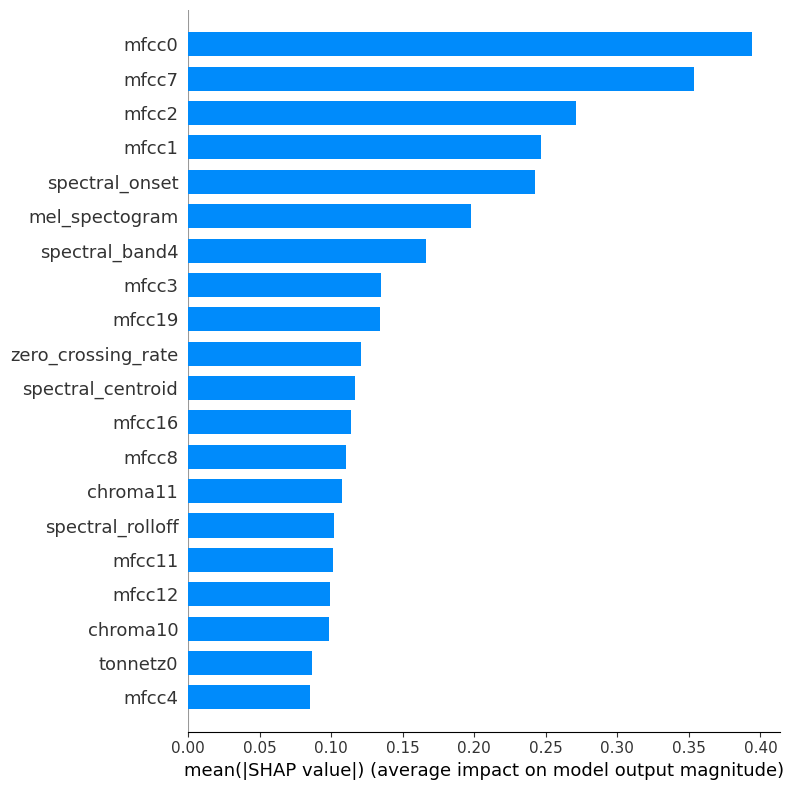

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


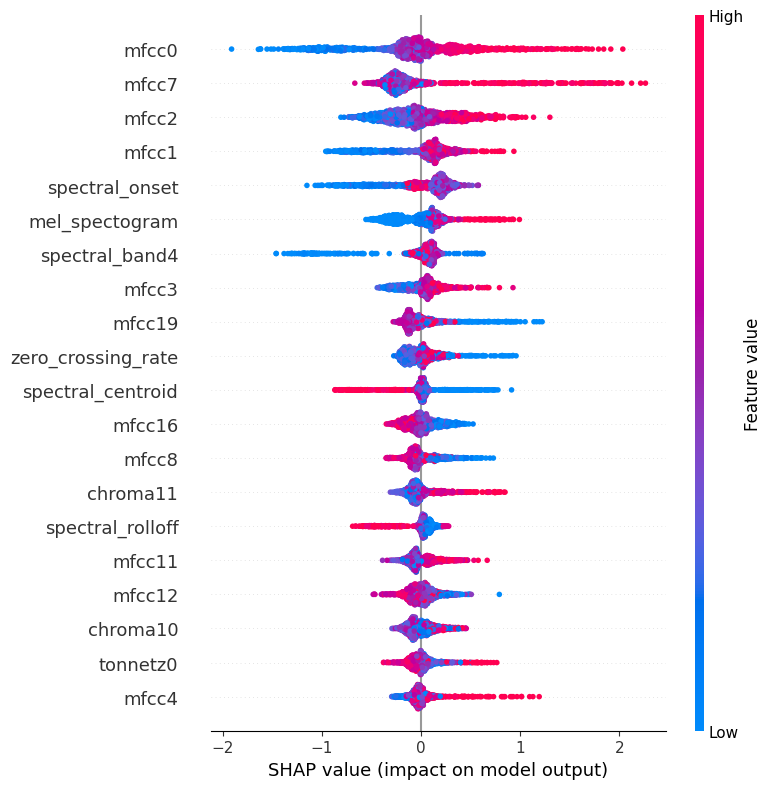

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 1575 - Acuracia do modelo HistGradientBoostingClassifier(max_bins=191, max_depth=6, min_samples_leaf=16,
                               random_state=42) do Fold 2: 0.7555555555555555


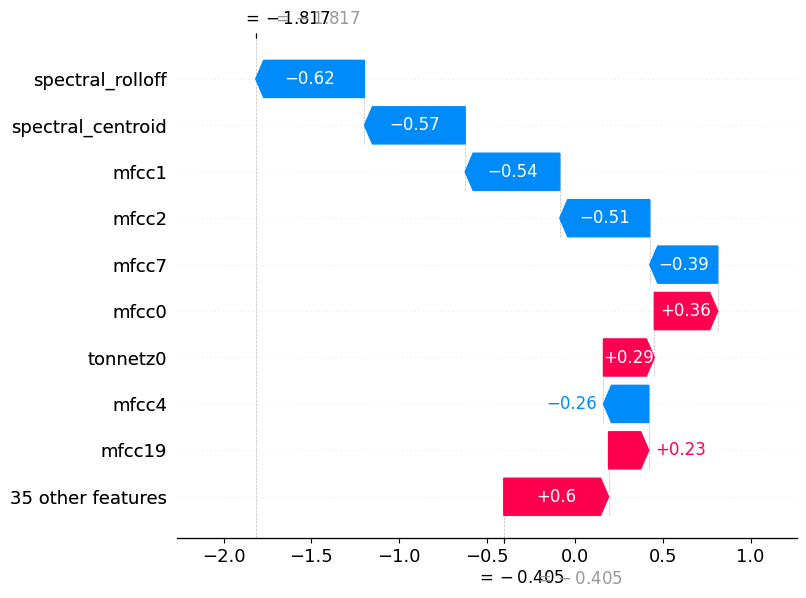

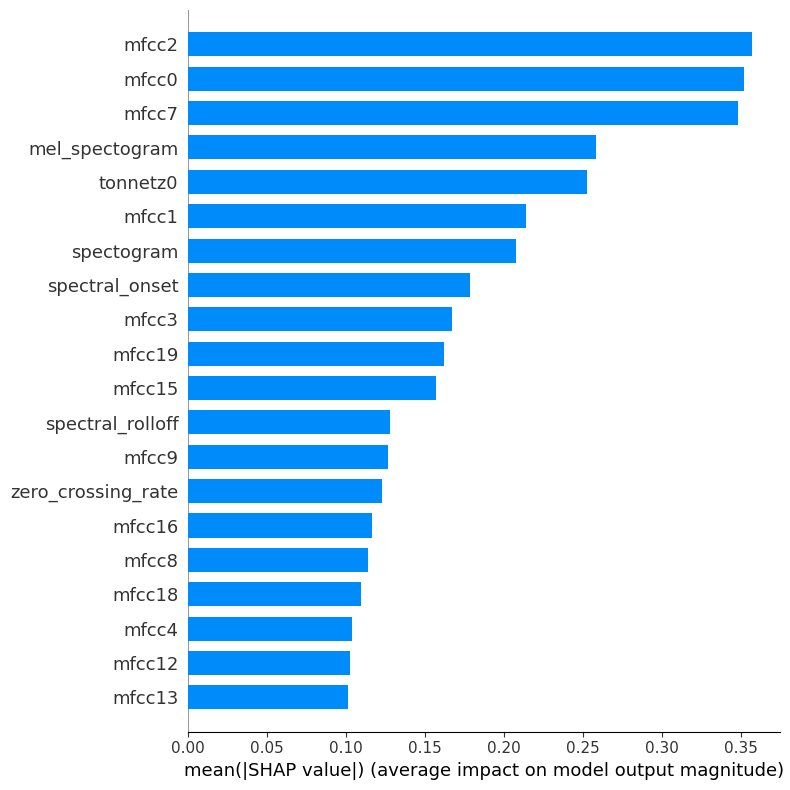

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


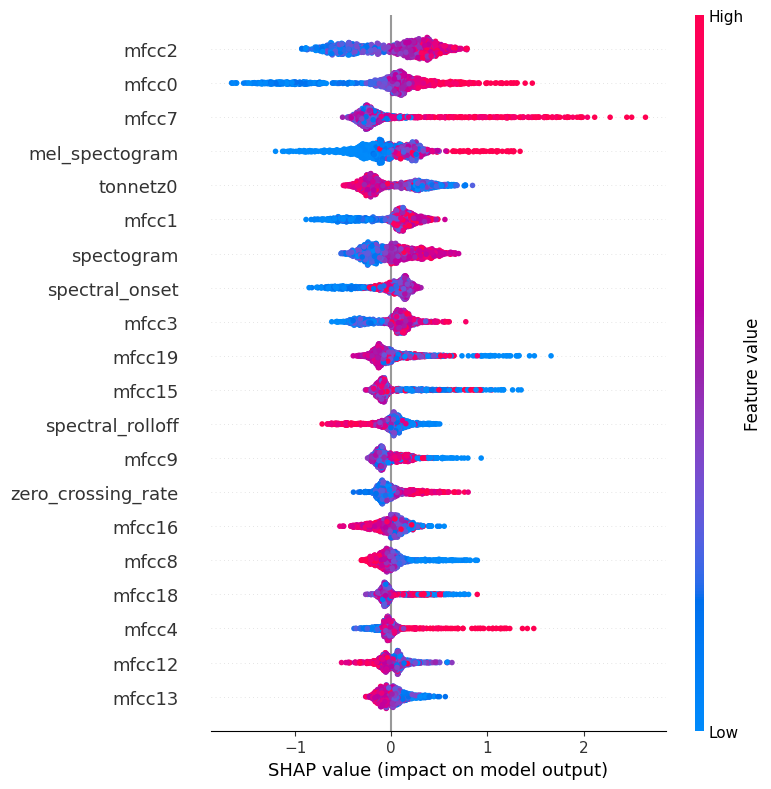

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 1575 - Acuracia do modelo HistGradientBoostingClassifier(max_bins=191, max_depth=6, min_samples_leaf=16,
                               random_state=42) do Fold 3: 0.7238095238095238


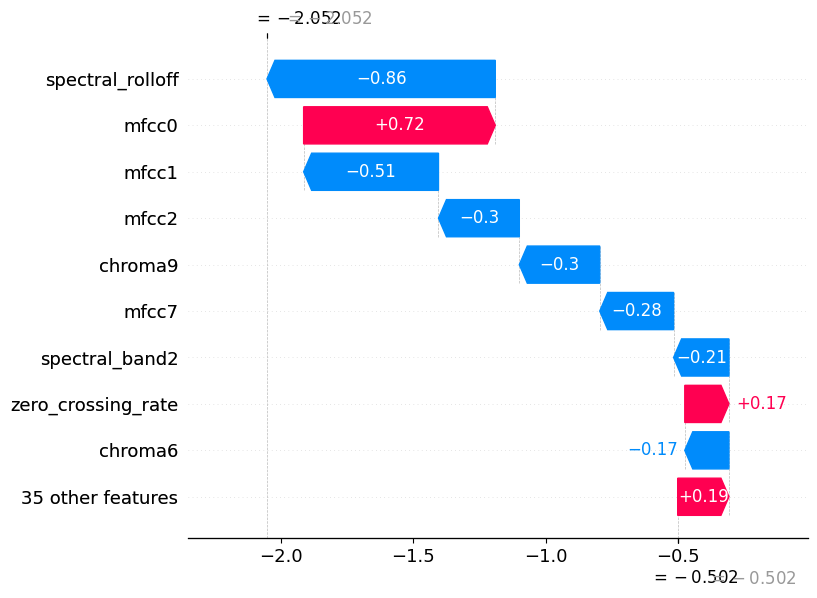

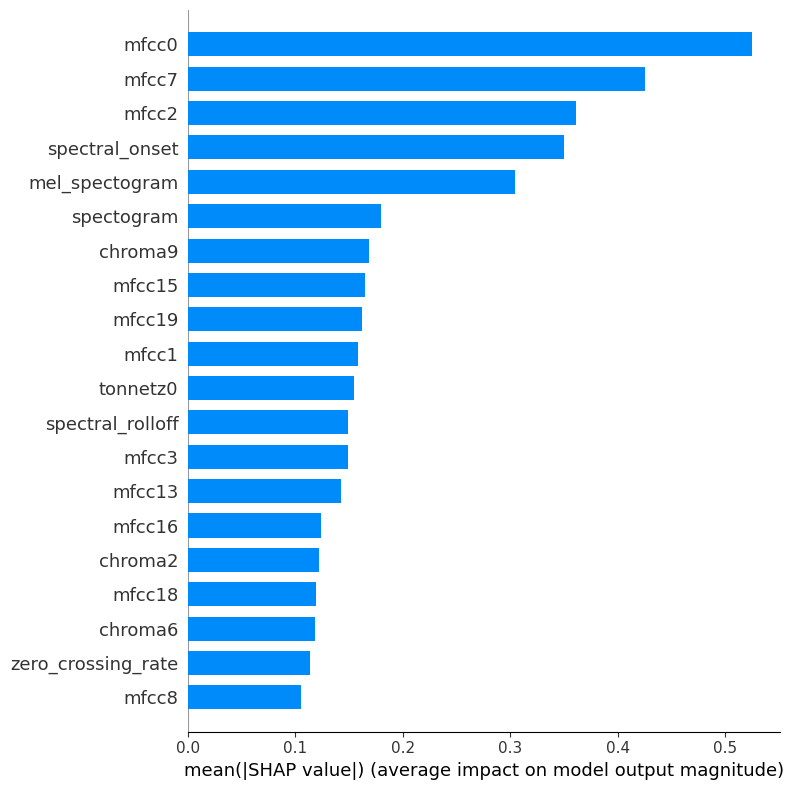

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


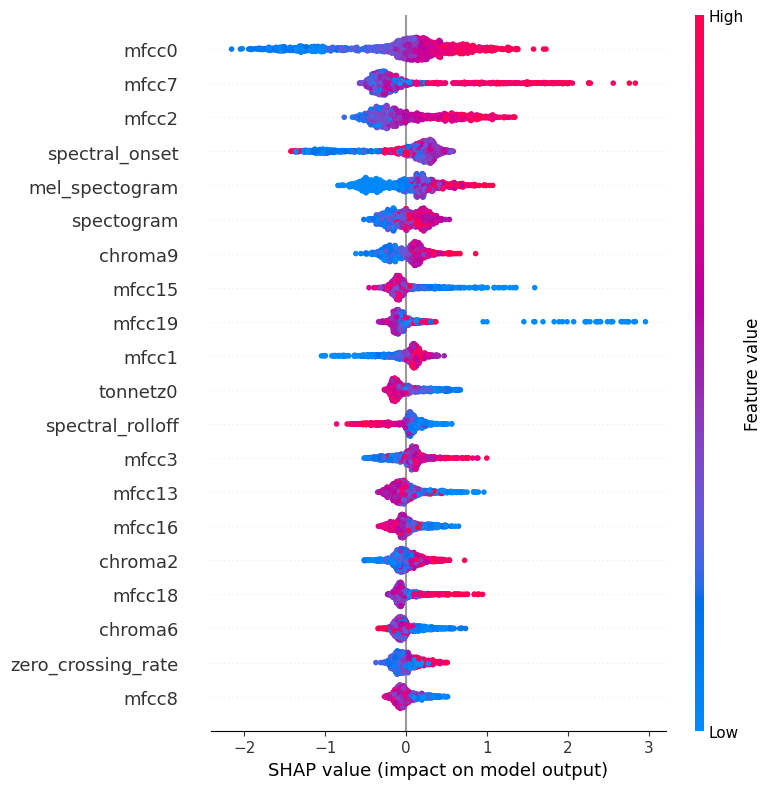

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 1575 - Acuracia do modelo HistGradientBoostingClassifier(max_bins=191, max_depth=6, min_samples_leaf=16,
                               random_state=42) do Fold 4: 0.7619047619047619


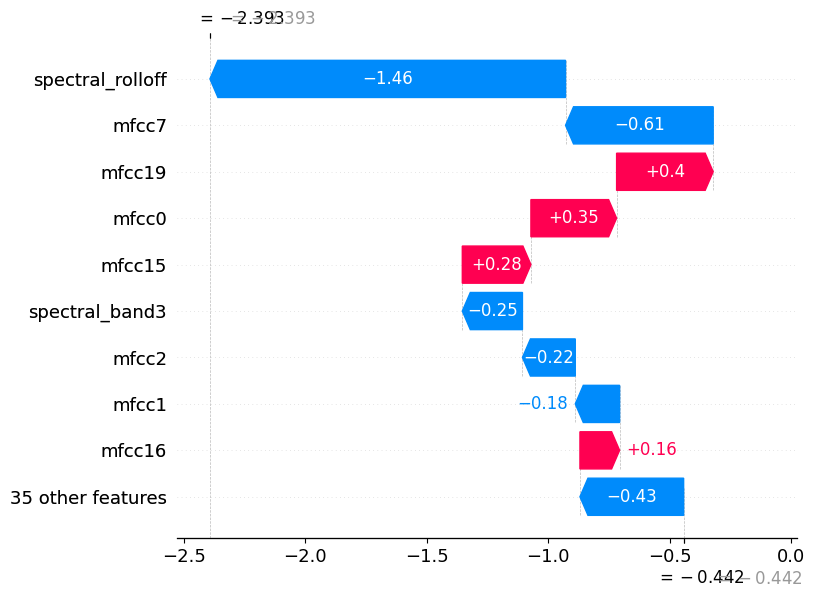

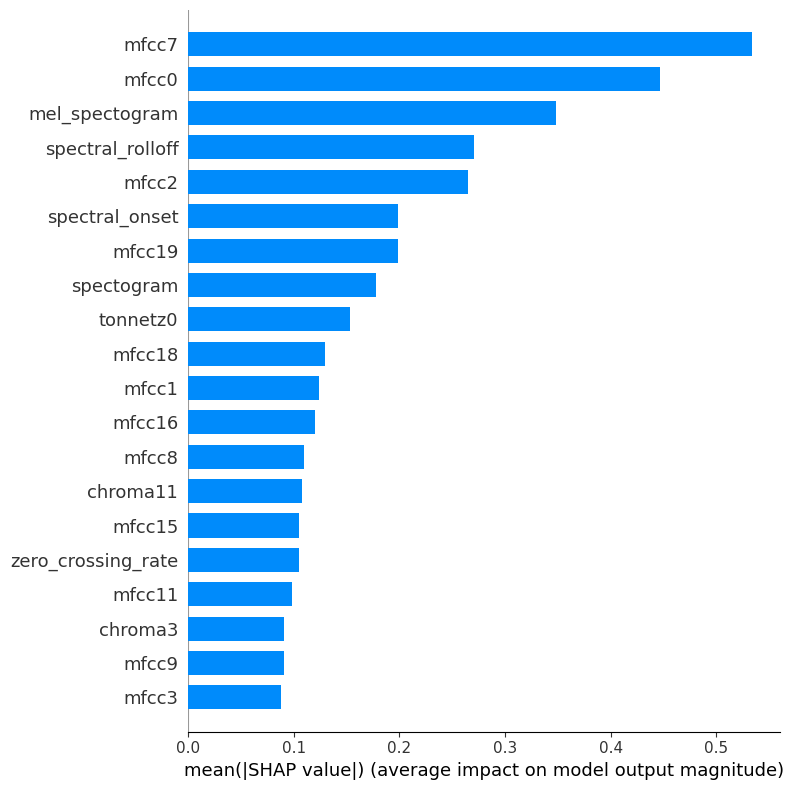

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


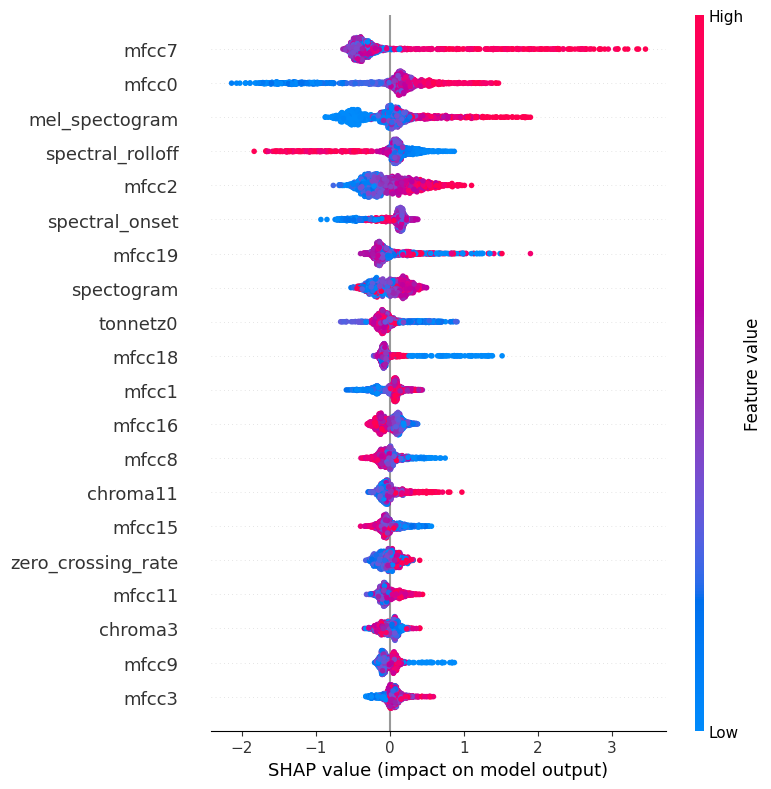

{'accuracy_mean': 74.92063492063492,
 'std': 0.014478418096496977,
 'predictions': array([1., 0., 0., ..., 1., 1., 1.]),
 'y_validate': array([0., 0., 0., ..., 2., 2., 2.]),
 'predictions_cat': array(['organ', 'accordion', 'accordion', ..., 'organ', 'organ', 'organ'],
       dtype=object),
 'y_validate_cat': array(['accordion', 'accordion', 'accordion', ..., 'piano', 'piano',
        'piano'], dtype=object)}

In [31]:
model = HistGradientBoostingClassifier(
    loss= 'log_loss',
    max_bins=191,
    max_depth=6,
    min_samples_leaf=16,
    random_state=42
)

results_aerofone_02 = tm.cross_validate_balancead(k=5, model=model, y_pred = "instrumento", dataframe=df_inst_aerofone_02, shap=True)
results_aerofone_02

- Matrix de confusão

In [32]:
results_aerofone_02

{'accuracy_mean': 74.92063492063492,
 'std': 0.014478418096496977,
 'predictions': array([1., 0., 0., ..., 1., 1., 1.]),
 'y_validate': array([0., 0., 0., ..., 2., 2., 2.]),
 'predictions_cat': array(['organ', 'accordion', 'accordion', ..., 'organ', 'organ', 'organ'],
       dtype=object),
 'y_validate_cat': array(['accordion', 'accordion', 'accordion', ..., 'piano', 'piano',
        'piano'], dtype=object)}

<Axes: title={'center': 'Matriz confusão modelo 2 aerofone'}>

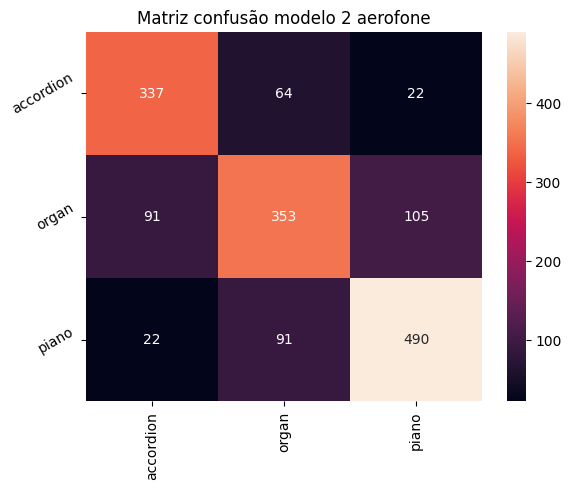

In [33]:
ac.matriz_confusion(
    results_aerofone_02['y_validate'],
    results_aerofone_02['predictions'],
    labels=np.unique(results_aerofone_02["predictions_cat"]),
    title='Matriz confusão modelo 2 aerofone',
    rename_labels=True
)

## Sopro

### Model 1

- Detected outilers

In [34]:
outlier_model_1_sopro = ac.detected_outilers_knn(metric="manhattan", algorithm="ball_tree", neighbors=7, dataframe=df_inst_sopro)

- Removed outilers

In [35]:
df_inst_sopro_01 = ac.show_inlers(dataframe=df_inst_sopro, pred=outlier_model_1_sopro["predictions"])
df_inst_sopro_01

,tonnetz0,tonnetz1,chroma1,chroma2,chroma3,chroma4,chroma5,chroma6,chroma7,mfcc0,...,spectral_band3,spectral_band4,spectral_centroid,spectral_onset,spectral_rolloff,spectogram,mel_spectogram,zero_crossing_rate,zero_crossing,instrumento
1875,0.060383,0.017910,0.319152,0.367783,0.465361,0.399524,0.357706,0.343498,0.282757,8.203455,...,2788.013960,3239.194180,2328.546611,1.093156,5092.952266,-52.844872,-68.585281,0.105613,23362,clarinet
1877,-0.102407,-0.053821,0.007352,0.016456,0.251515,0.982690,0.649991,0.123668,0.015163,-170.240860,...,2897.624046,3532.073752,1571.665681,0.959548,3635.089465,-61.261280,-78.551147,0.036253,8015,clarinet
1879,0.137429,-0.165245,0.004996,0.004829,0.009536,0.313501,1.000000,0.247865,0.029246,-200.479965,...,2826.243637,3529.484253,1302.617113,0.927032,2510.017073,-61.047974,-77.810928,0.029619,6548,clarinet
1880,0.236781,-0.104811,0.360671,0.143619,0.062925,0.141207,0.458111,0.159797,0.037194,-225.307404,...,1788.755359,2379.025103,1104.750913,1.166350,1975.259208,-66.297119,-78.115021,0.066677,14813,clarinet
1881,0.251144,0.276060,0.757470,0.276578,0.013081,0.137285,0.914434,0.177750,0.035843,-196.740616,...,1827.789583,2551.677641,930.040460,0.972946,1324.891525,-62.295158,-79.964806,0.063943,14130,clarinet
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7161,0.031326,0.036042,0.281165,0.467478,0.383710,0.385898,0.358991,0.379168,0.286116,-221.750122,...,1515.887247,2040.836138,896.653459,1.242603,1782.859289,-42.632786,-42.830780,0.041767,9231,trumpet
7162,0.024069,-0.064162,0.038717,0.051984,0.156484,0.528343,0.865360,0.228249,0.063890,-213.012329,...,1888.383070,2528.740114,1280.731144,1.535133,1930.644010,-52.891537,-79.643761,0.078466,17360,trumpet
7163,0.046916,0.068088,0.517141,0.282860,0.547268,0.444383,0.516097,0.406917,0.322084,-35.486549,...,3132.678849,3643.088516,2309.708871,1.049440,5199.019529,-37.911655,-57.435429,0.095421,21114,trumpet
7164,0.109233,0.002179,0.271734,0.290186,0.454663,0.332584,0.266866,0.341721,0.481044,-134.787796,...,2965.252571,3440.696663,2370.998419,1.259253,5153.205266,-53.025776,-79.120621,0.126226,27933,trumpet


- Train model


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 1448 - Acuracia do modelo XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eta=0.2, eval_metric=None,
              feature_types=None, gamma=0, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.10315464633026669, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=20, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', ...) do Fold 0: 0.7379310344827587


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


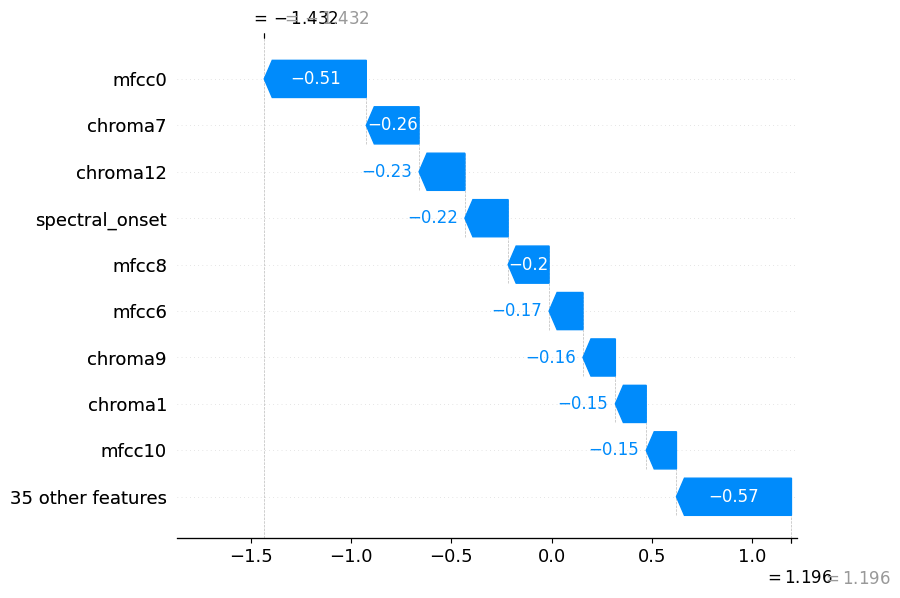

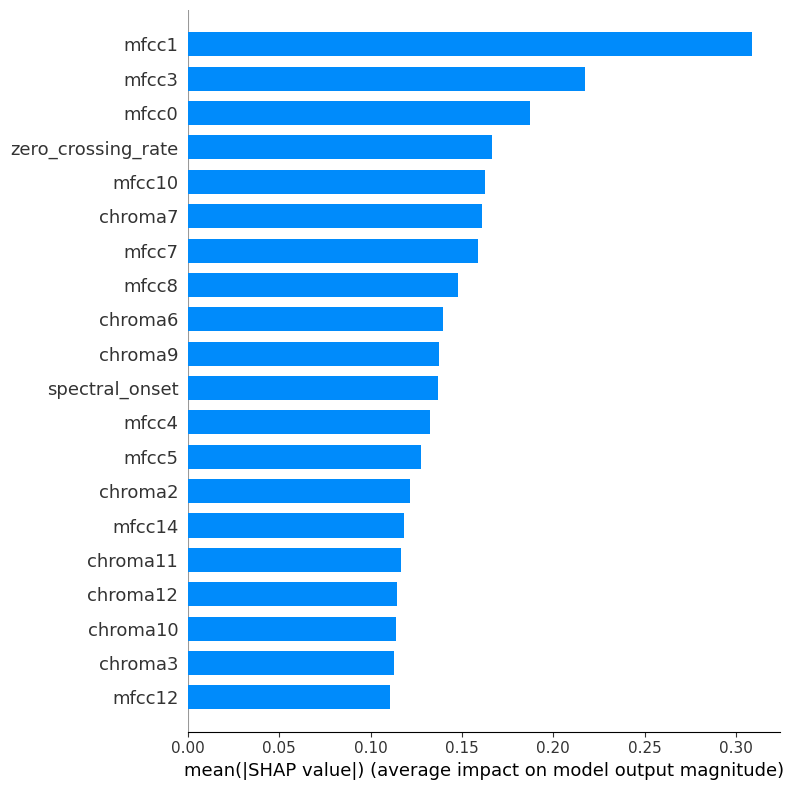

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


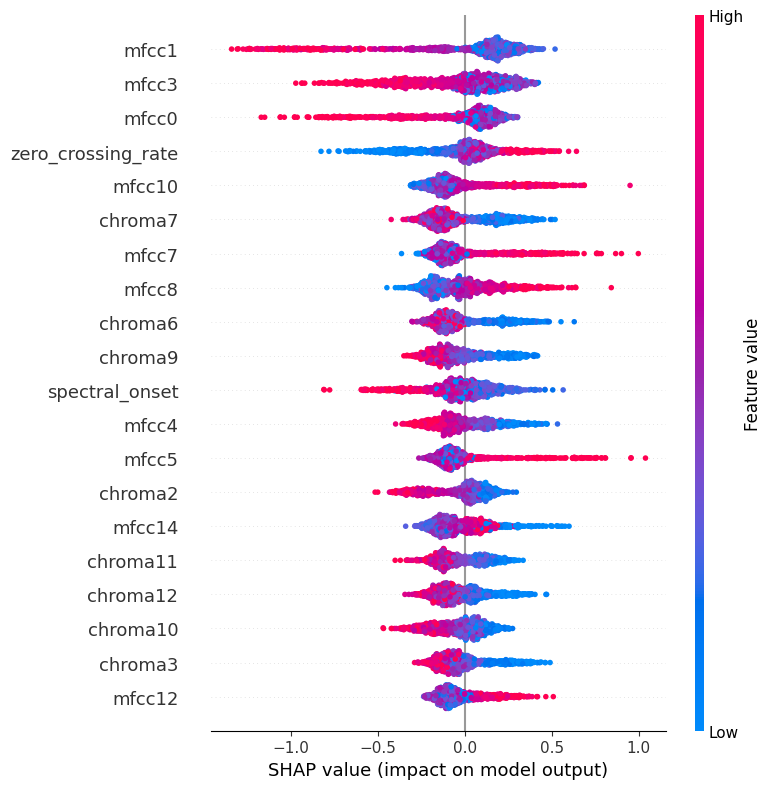

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 1448 - Acuracia do modelo XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eta=0.2, eval_metric=None,
              feature_types=None, gamma=0, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.10315464633026669, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=20, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', ...) do Fold 1: 0.7206896551724138


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


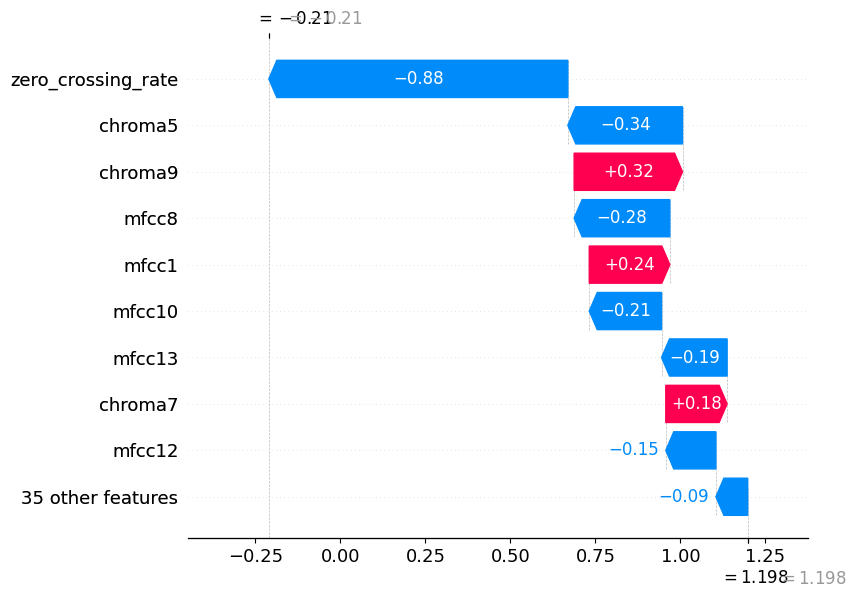

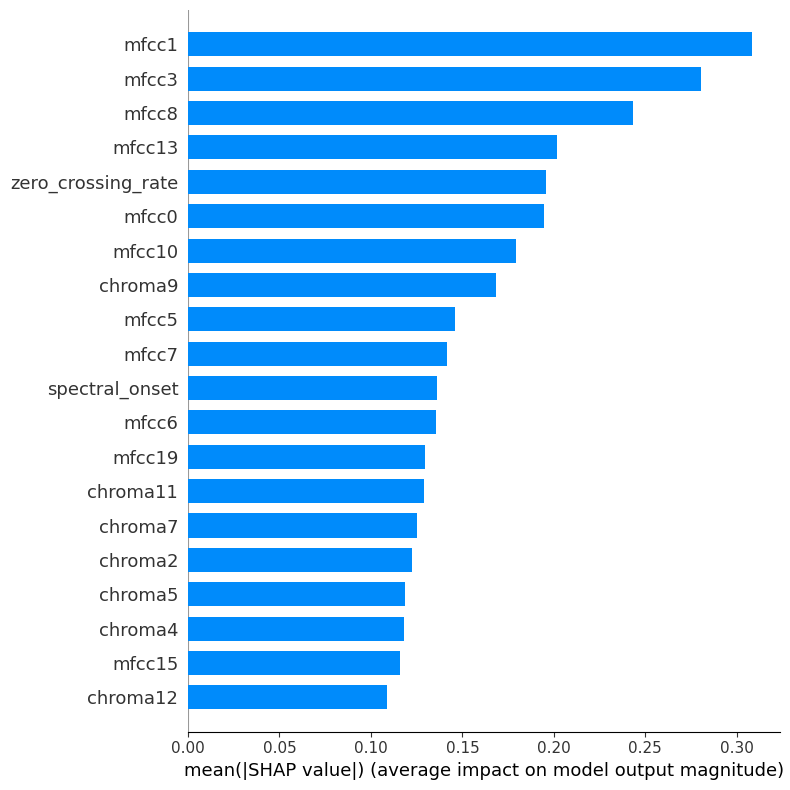

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


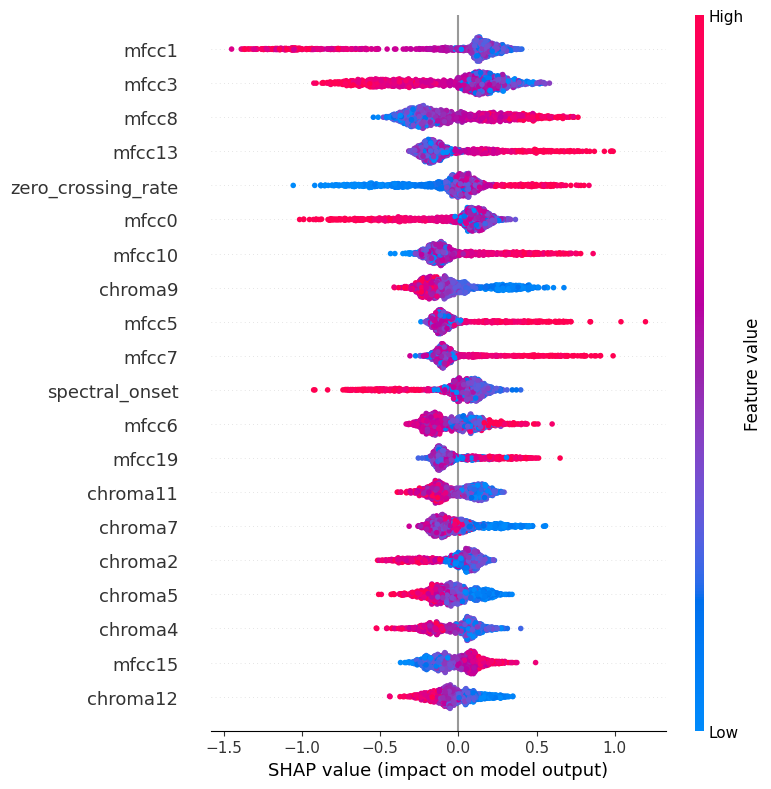

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 1448 - Acuracia do modelo XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eta=0.2, eval_metric=None,
              feature_types=None, gamma=0, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.10315464633026669, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=20, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', ...) do Fold 2: 0.7310344827586207


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


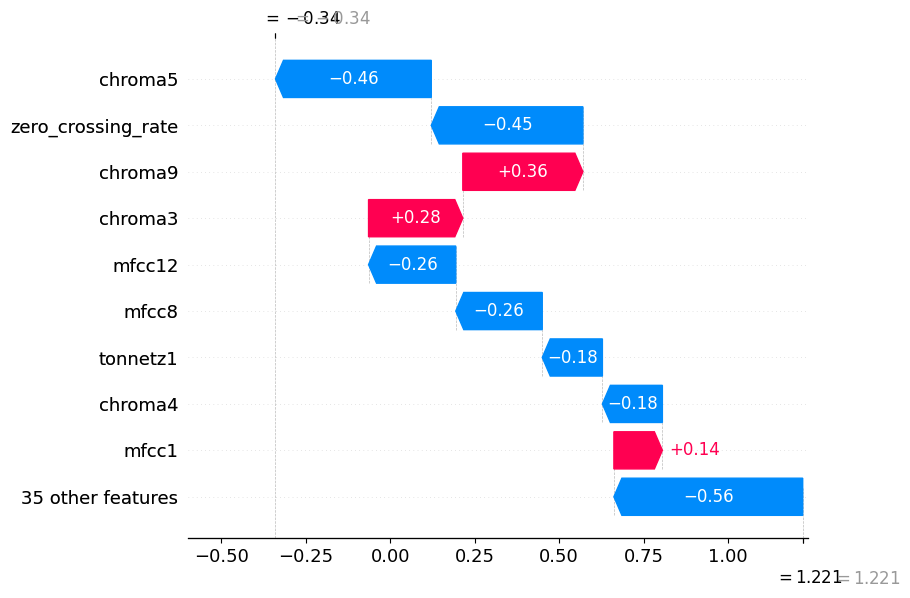

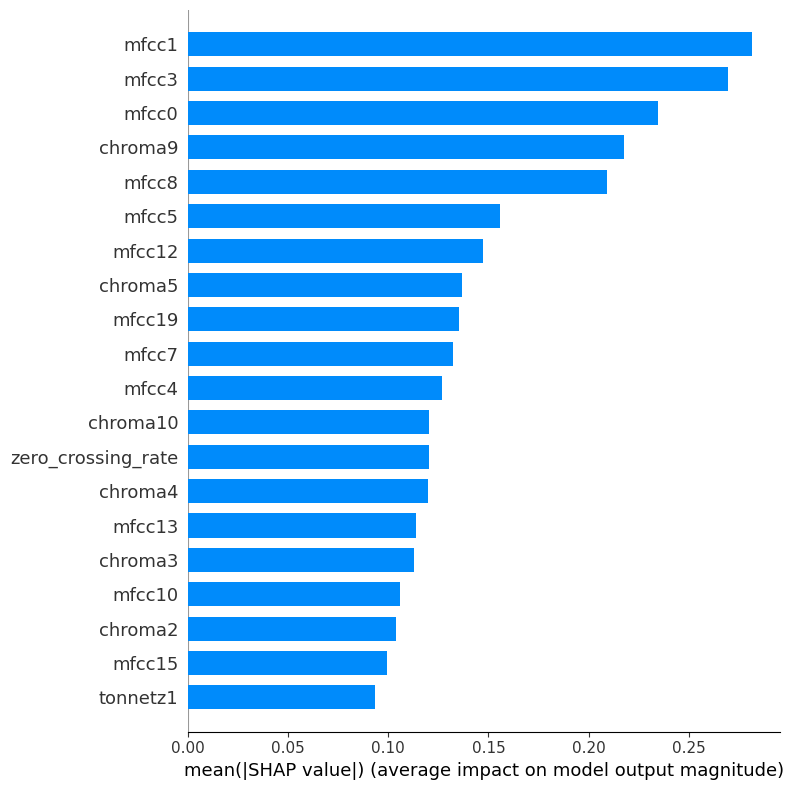

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


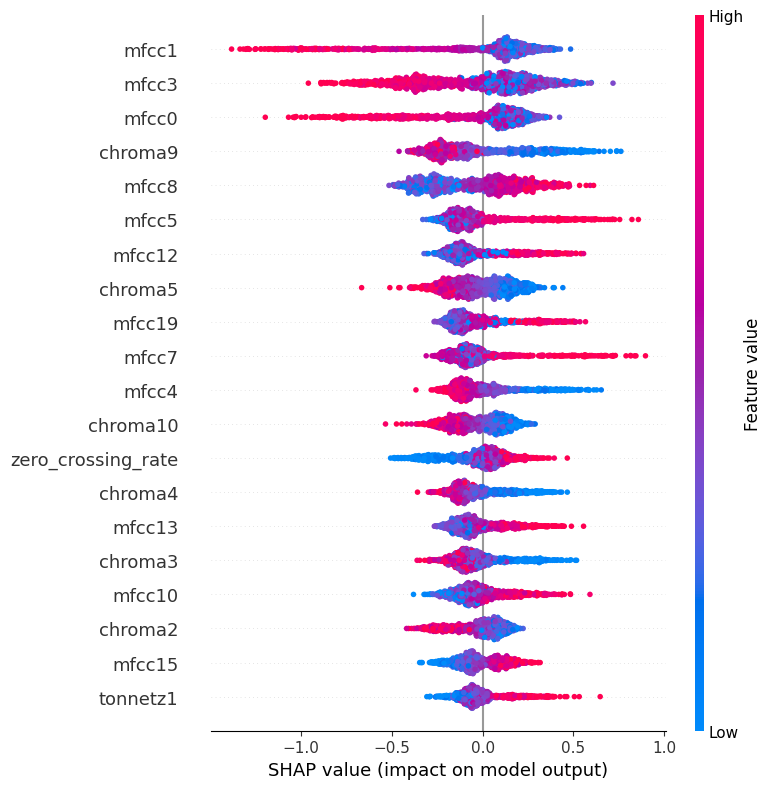

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 1448 - Acuracia do modelo XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eta=0.2, eval_metric=None,
              feature_types=None, gamma=0, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.10315464633026669, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=20, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', ...) do Fold 3: 0.6851211072664359


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


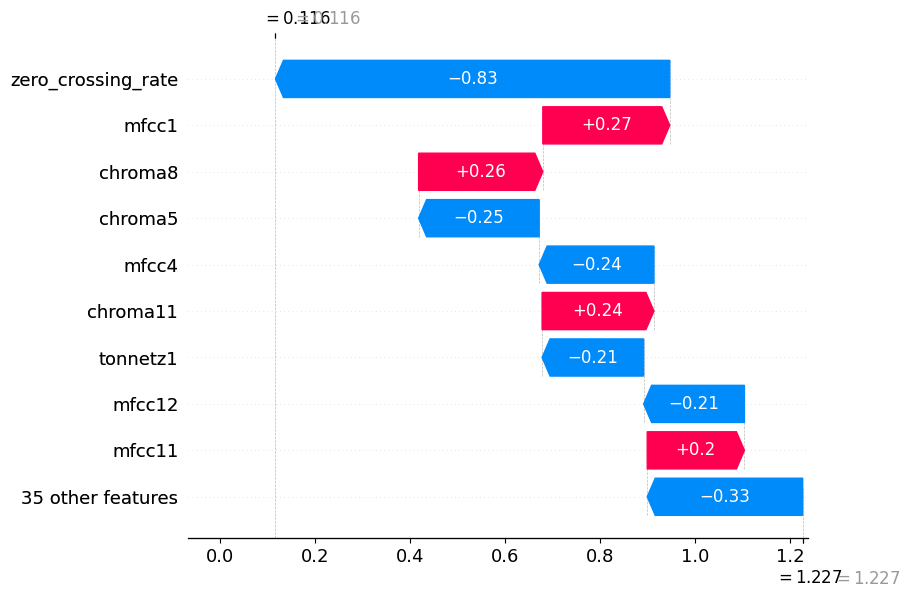

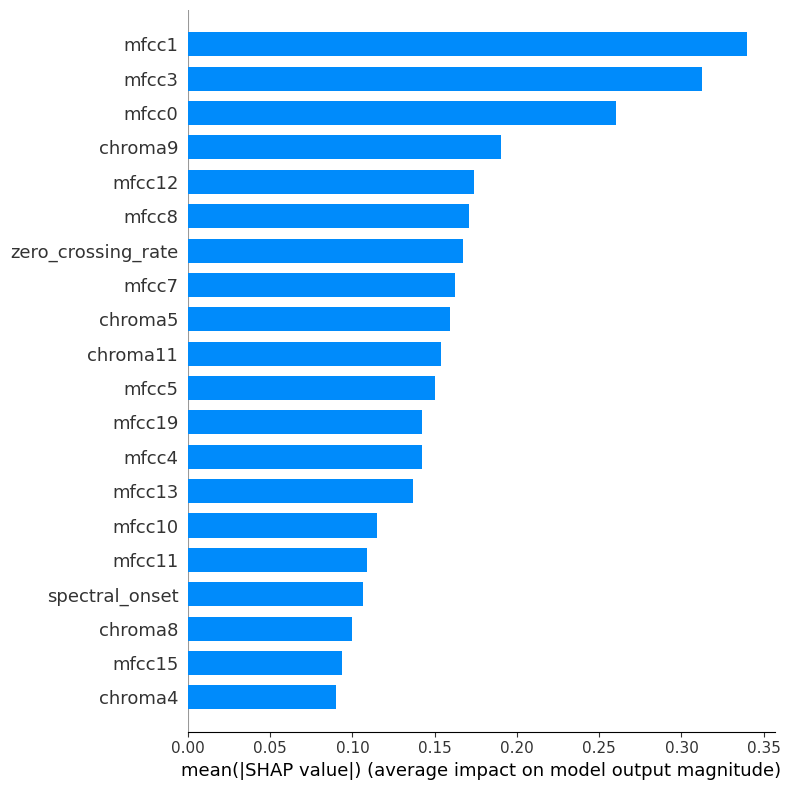

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


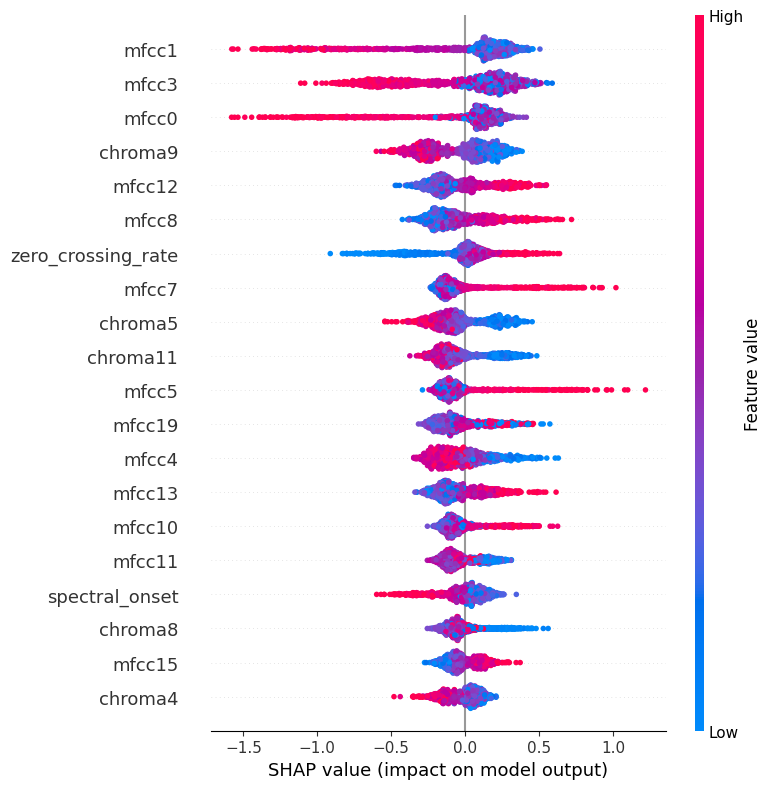

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 1448 - Acuracia do modelo XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eta=0.2, eval_metric=None,
              feature_types=None, gamma=0, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.10315464633026669, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=20, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', ...) do Fold 4: 0.7577854671280276


ntree_limit is deprecated, use `iteration_range` or model slicing instead.


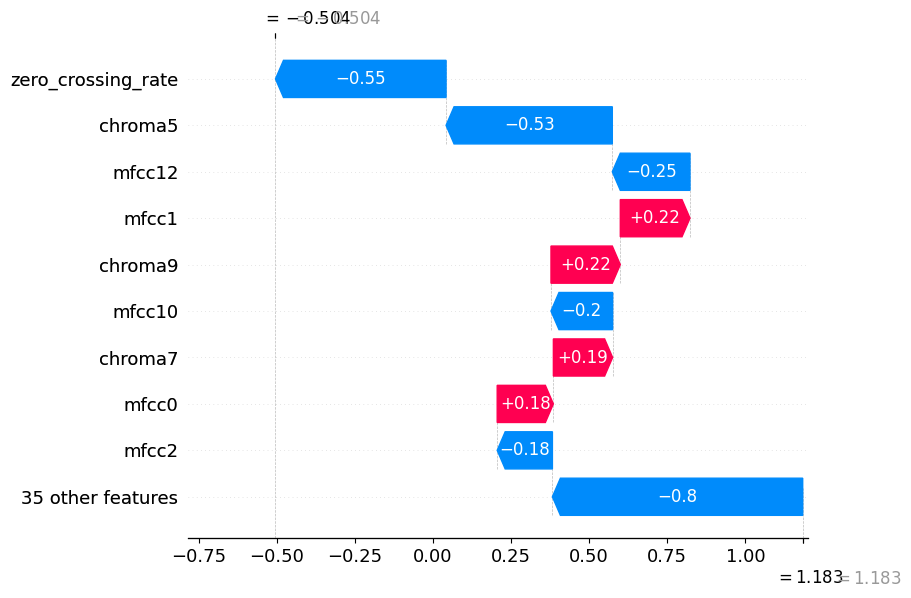

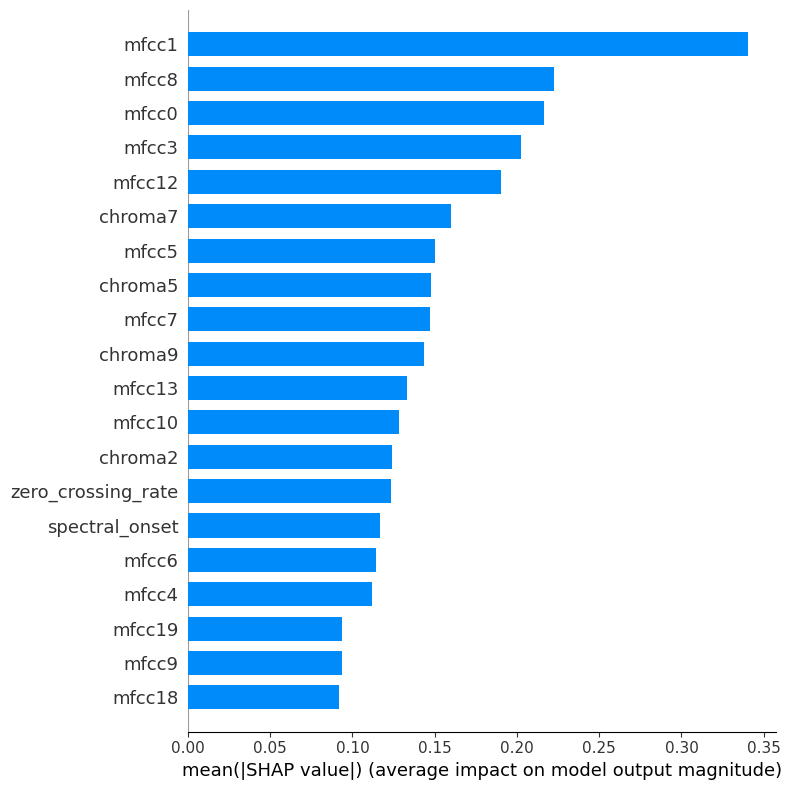

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


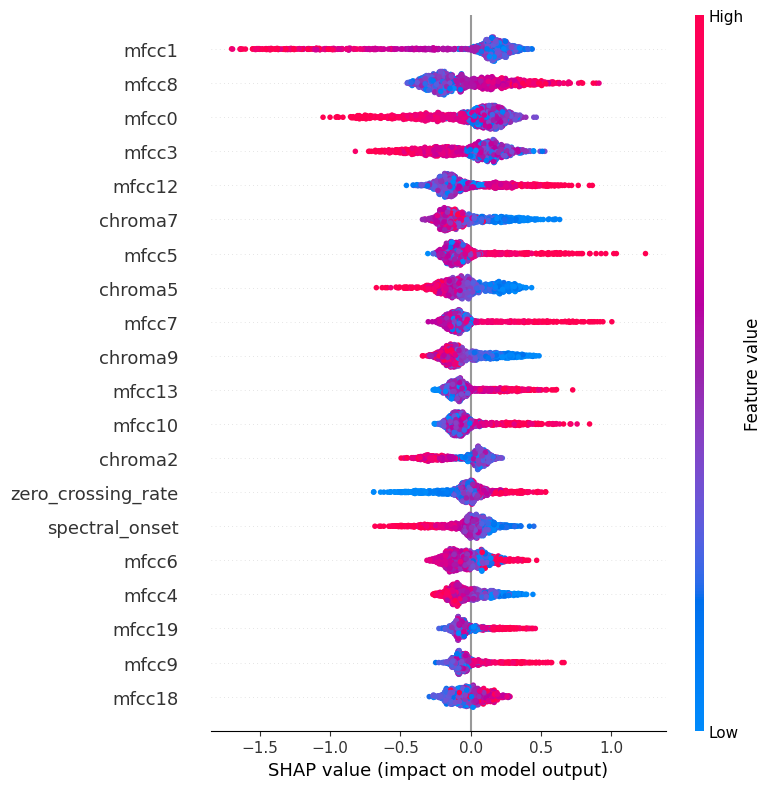

{'accuracy_mean': 72.65123493616514,
 'std': 0.02398325517935685,
 'predictions': array([2., 1., 1., ..., 2., 2., 2.]),
 'y_validate': array([0., 0., 0., ..., 4., 4., 4.]),
 'predictions_cat': array(['saxophone', 'flute', 'flute', ..., 'saxophone', 'saxophone',
        'saxophone'], dtype=object),
 'y_validate_cat': array(['clarinet', 'clarinet', 'clarinet', ..., 'trumpet', 'trumpet',
        'trumpet'], dtype=object)}

In [36]:
model = XGBClassifier(
    eta=0.2,
    gamma=0,
    learning_rate = 0.10315464633026669,
    max_depth=20,
    subsample=0.5,
)

results_1_sopro = tm.cross_validate_balancead(k=5, model=model, y_pred='instrumento', dataframe=df_inst_sopro_01, shap=True)
results_1_sopro

- Matriz de confusão

<Axes: title={'center': 'Matriz confusão modelo 1 sopro'}>

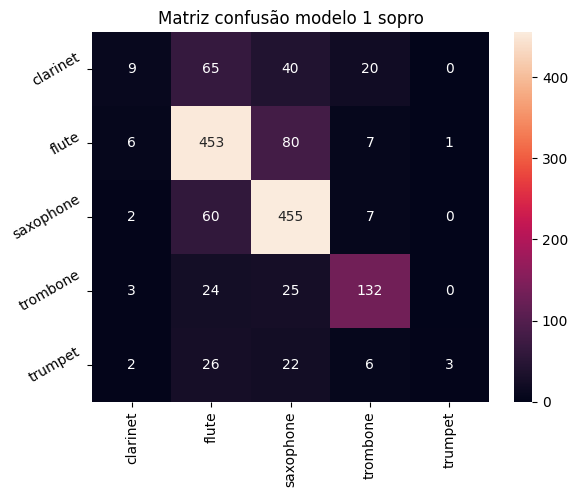

In [37]:
ac.matriz_confusion(
    results_1_sopro['y_validate'],
    results_1_sopro['predictions'],
    labels=np.unique(results_1_sopro["predictions_cat"]),
    title='Matriz confusão modelo 1 sopro',
    rename_labels=True
)

### Model 2

- Detected outilers

In [38]:
outlier_model_2_sopro = ac.detected_outilers_knn(metric="euclidean", algorithm="kd_tree", neighbors=5, dataframe=df_inst_sopro)

algorithm parameter is deprecated and will be removed in version 0.7.6. By default, ball_tree will be used.


- Removed outilers

In [39]:
df_inst_sopro_02 = ac.show_outilers(dataframe=df_inst_sopro, pred=outlier_model_2_sopro["predictions"])
df_inst_sopro_02

,tonnetz0,tonnetz1,chroma1,chroma2,chroma3,chroma4,chroma5,chroma6,chroma7,mfcc0,...,spectral_band3,spectral_band4,spectral_centroid,spectral_onset,spectral_rolloff,spectogram,mel_spectogram,zero_crossing_rate,zero_crossing,instrumento
1876,-0.044667,0.260524,0.692127,0.238955,0.029413,0.424056,0.732275,0.106237,0.264656,-178.568253,...,1765.250201,2269.854161,1872.058375,0.862944,2738.513835,-70.011116,-80.000000,0.139929,30932,clarinet
1878,0.089747,0.253008,0.299878,0.225017,0.544357,0.164941,0.079692,0.119684,0.194826,-211.757339,...,1956.152087,2431.808142,1999.856294,1.274141,3282.789275,-58.643265,-71.021973,0.176906,39102,clarinet
1886,0.002779,0.015584,0.311722,0.319367,0.339069,0.368589,0.345589,0.443560,0.344975,-85.485229,...,2623.199193,2937.446277,3154.871456,1.945904,5838.245903,-44.260166,-62.325306,0.232276,51374,clarinet
1888,0.108679,0.066236,0.484411,0.352953,0.433525,0.316416,0.265250,0.316138,0.292531,-121.484428,...,3112.680668,3654.260611,1992.119222,1.766695,4726.313261,-42.178364,-41.680836,0.041709,9216,clarinet
1897,0.040330,0.013987,0.226904,0.302980,0.674932,0.560282,0.423103,0.323710,0.402272,-124.647331,...,1638.700568,2093.215040,1949.869060,1.131823,3117.917883,-63.385639,-78.626289,0.151718,33537,clarinet
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7151,-0.215709,0.074658,0.095596,0.119745,0.361354,0.896803,0.408373,0.369947,0.177898,-387.084808,...,3098.851239,3460.288056,3394.058894,1.074963,6651.736344,-53.667458,-76.665230,0.194558,43089,trumpet
7153,0.095131,0.165130,0.409808,0.178644,0.131329,0.086917,0.195207,0.238547,0.105908,-196.057907,...,1256.726885,1670.854795,1466.013189,1.140587,2337.326779,-75.481300,-79.999992,0.101459,22454,trumpet
7156,-0.148693,0.003055,0.543909,0.820975,0.261659,0.262984,0.201507,0.296120,0.160154,-182.133682,...,2232.044850,2812.377753,2612.295812,0.958099,4009.572352,-64.094101,-80.000000,0.170468,37702,trumpet
7159,-0.040215,0.031151,0.587902,0.642199,0.661011,0.675489,0.697853,0.718583,0.482416,-276.234711,...,1031.442586,1626.501203,285.508118,0.854189,403.660127,-16.440603,-14.334520,0.014532,3213,trumpet


- Train model


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
ntree_limit is deprecated, use `iteration_range` or model slicing instead.


Tamanho base: 161 - Acuracia do modelo XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eta=0.017982161175003848,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.19534790296680066,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', ...) do Fold 0: 0.7272727272727273


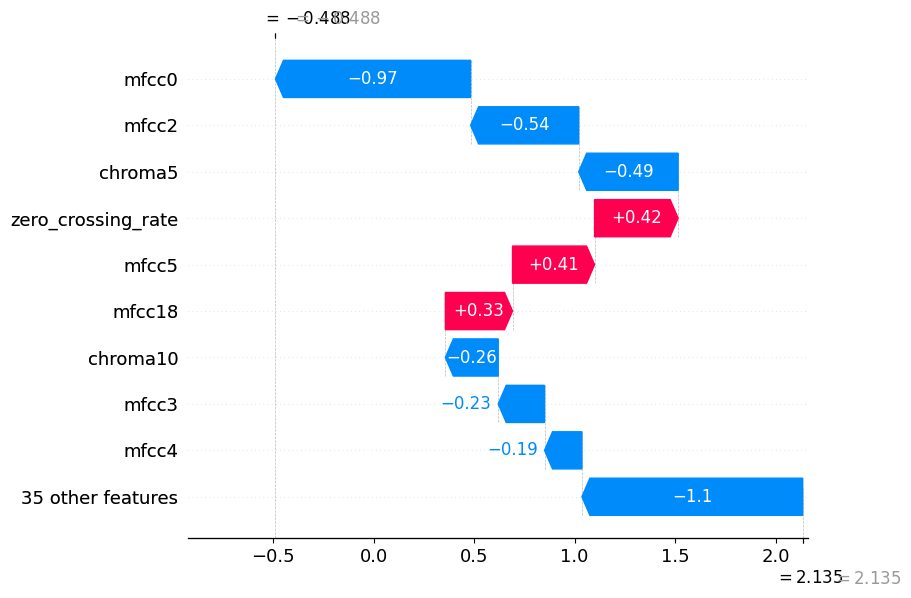

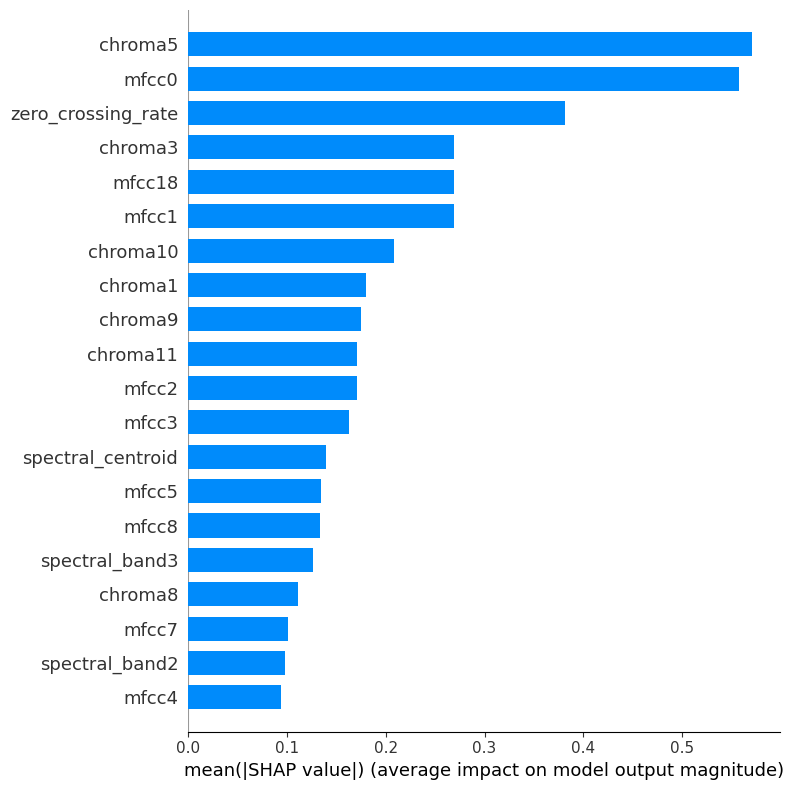

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


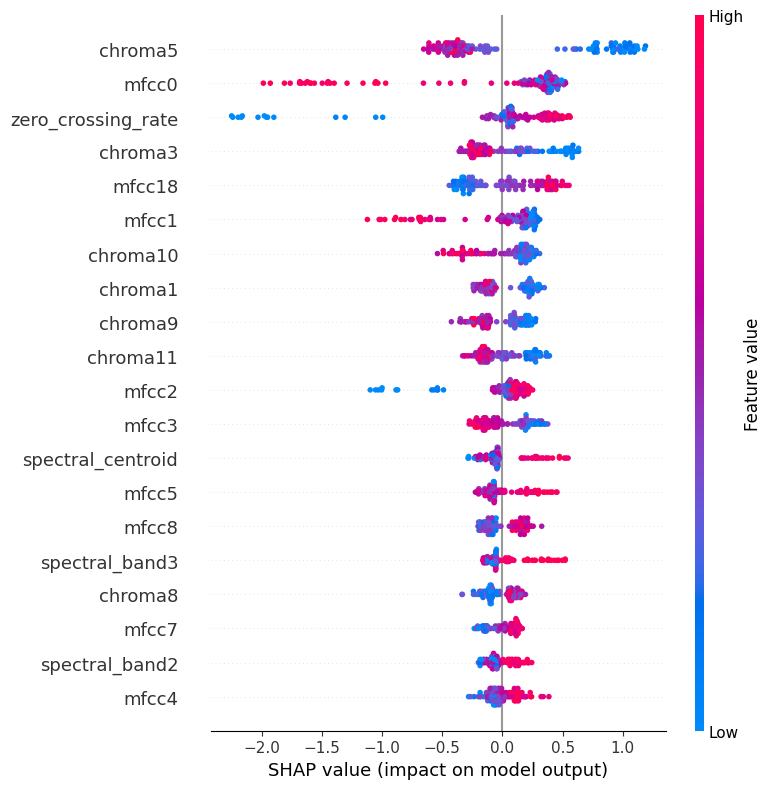

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
ntree_limit is deprecated, use `iteration_range` or model slicing instead.


Tamanho base: 161 - Acuracia do modelo XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eta=0.017982161175003848,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.19534790296680066,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', ...) do Fold 1: 0.5625


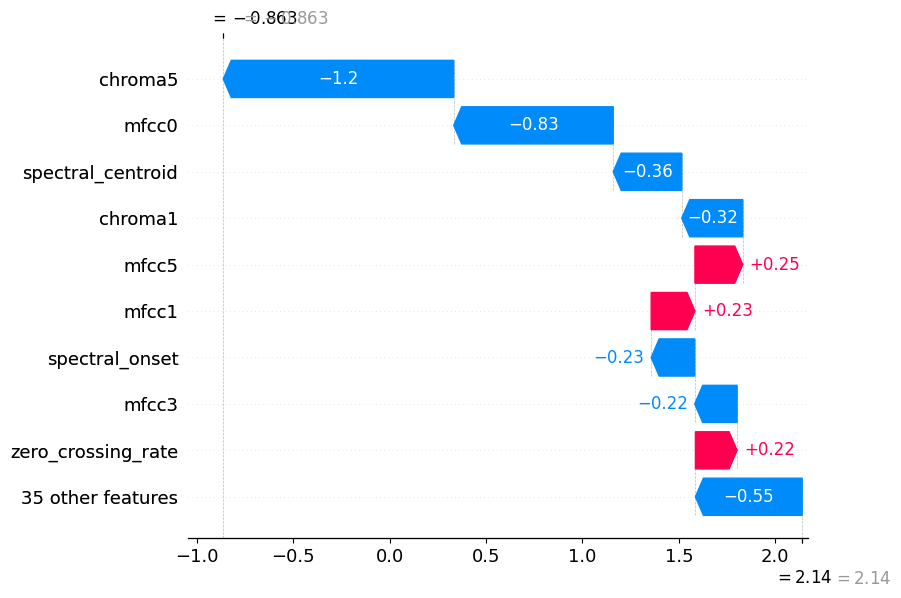

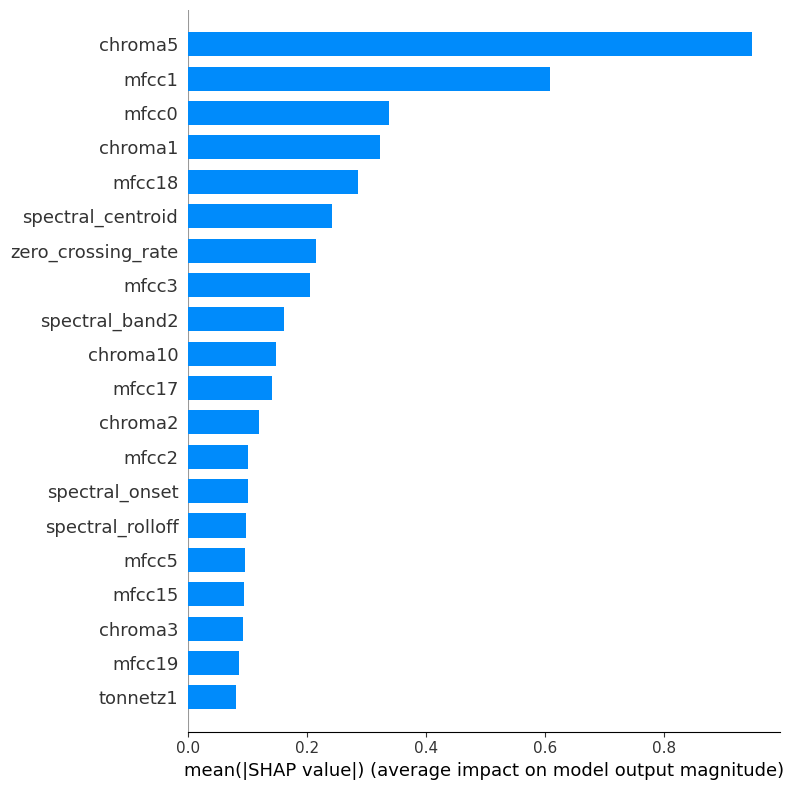

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


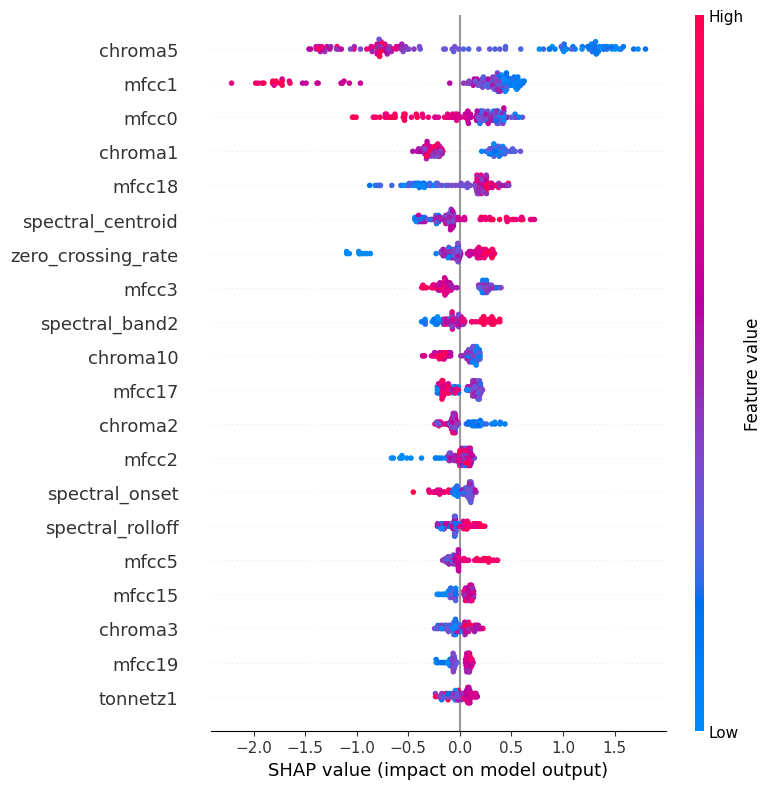

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
ntree_limit is deprecated, use `iteration_range` or model slicing instead.


Tamanho base: 161 - Acuracia do modelo XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eta=0.017982161175003848,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.19534790296680066,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', ...) do Fold 2: 0.625


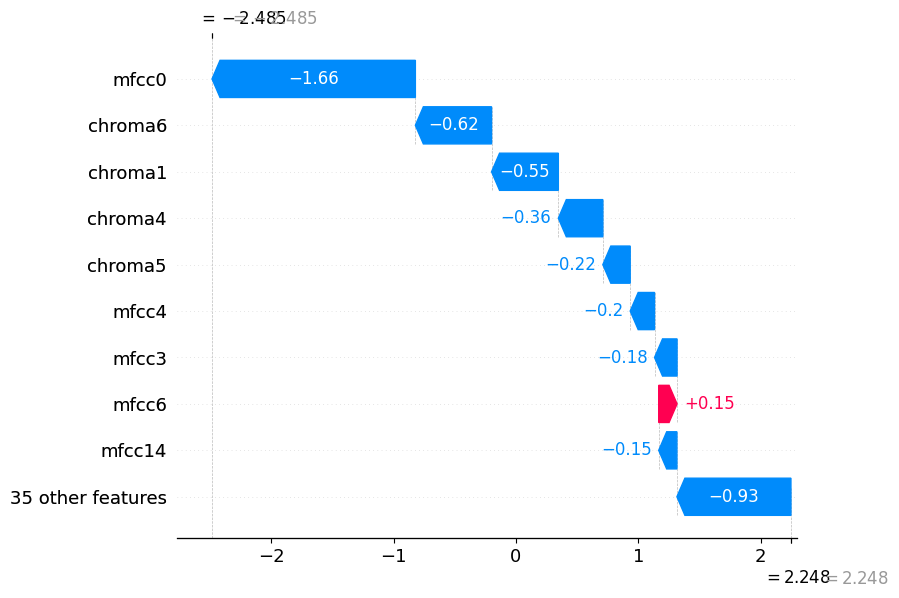

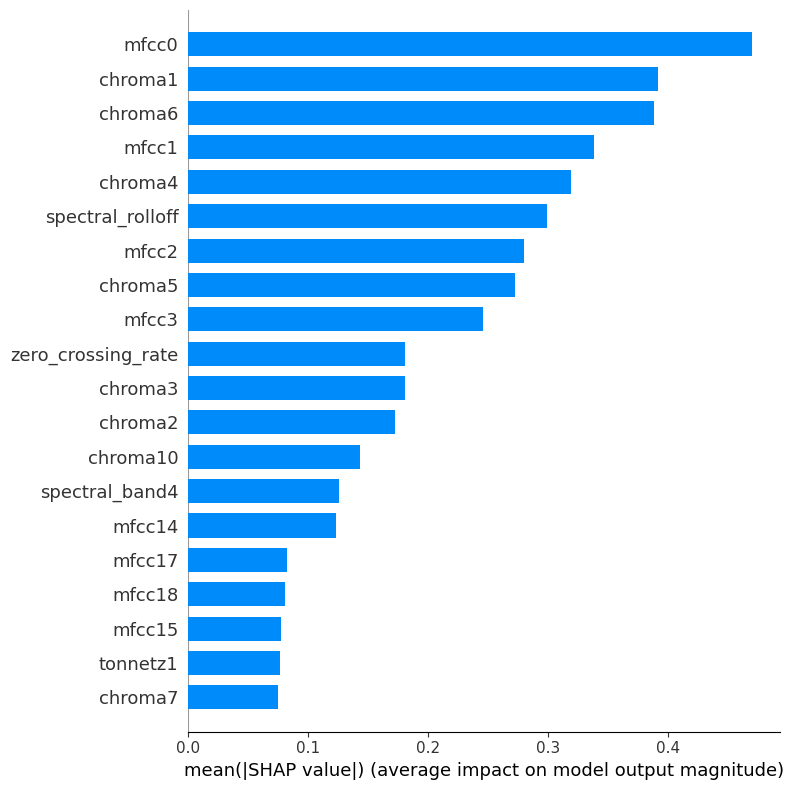

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


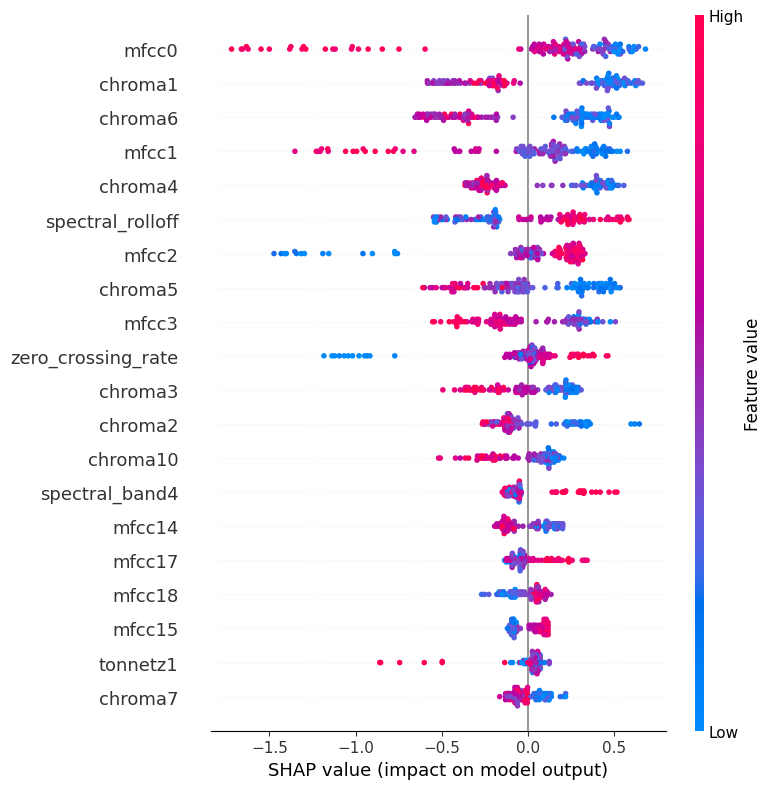

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
ntree_limit is deprecated, use `iteration_range` or model slicing instead.


Tamanho base: 161 - Acuracia do modelo XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eta=0.017982161175003848,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.19534790296680066,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', ...) do Fold 3: 0.6875


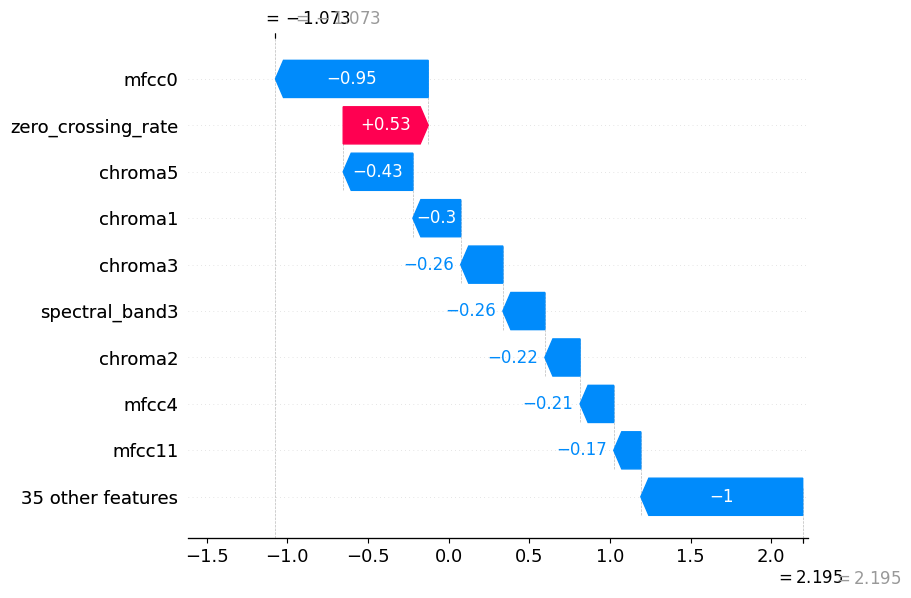

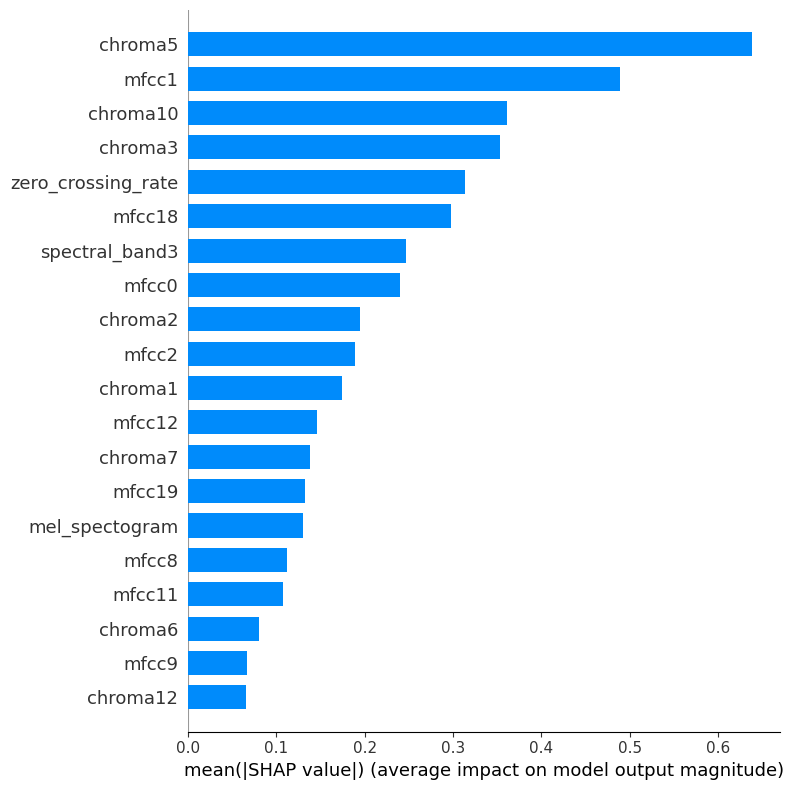

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


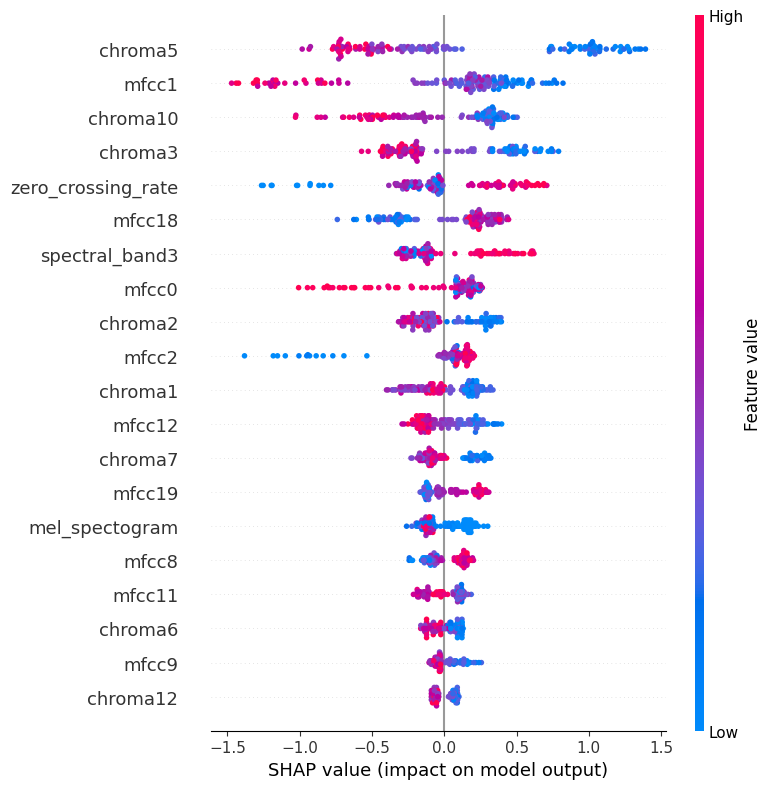

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
ntree_limit is deprecated, use `iteration_range` or model slicing instead.


Tamanho base: 161 - Acuracia do modelo XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eta=0.017982161175003848,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.19534790296680066,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', ...) do Fold 4: 0.71875


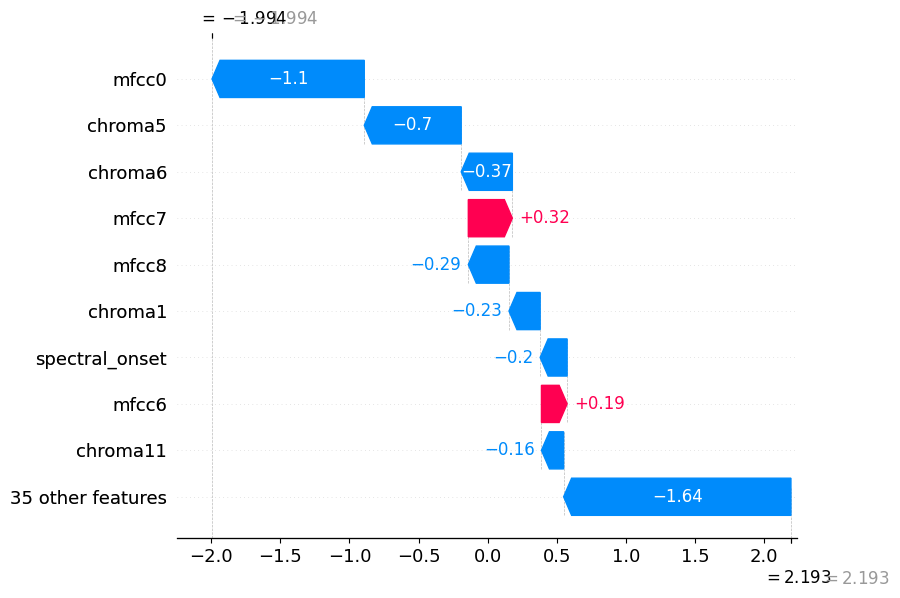

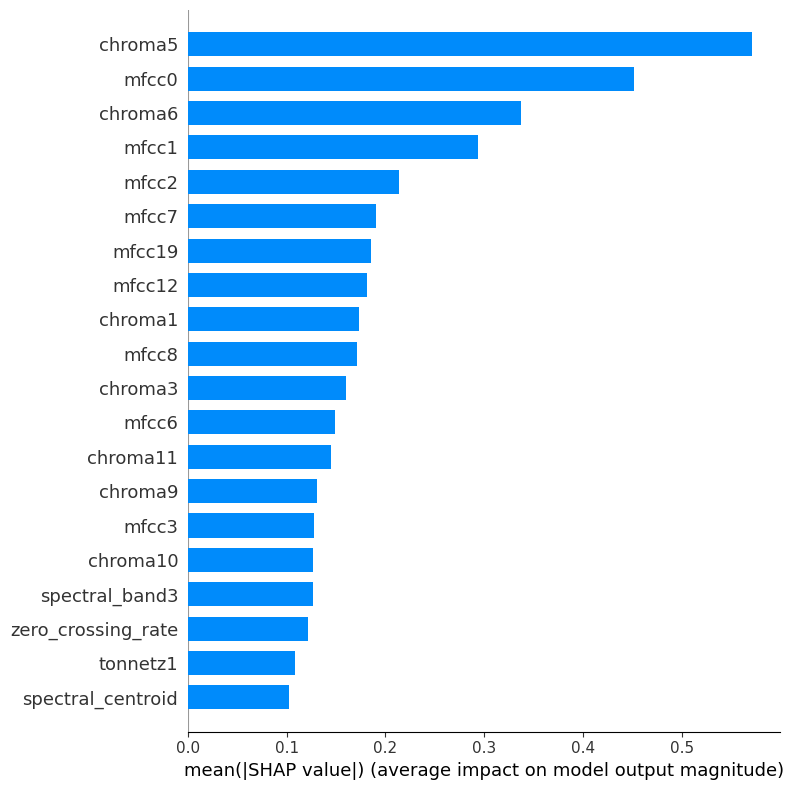

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


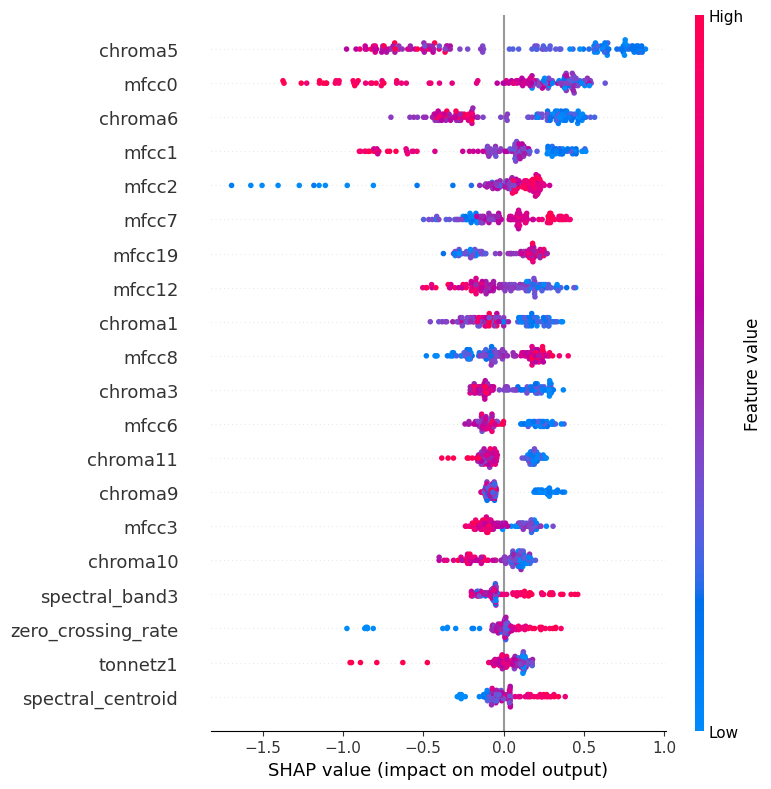

{'accuracy_mean': 66.42045454545456,
 'std': 0.06225157238546517,
 'predictions': array([1., 1., 0., 2., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 0., 1., 1., 1., 0., 1., 2., 3., 3., 1., 3., 1.,
        1., 1., 1., 3., 3., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 1.,
        3., 1., 1., 2., 1., 1., 1., 1., 2., 2., 1., 2., 1., 2., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 2.,
        1., 0., 1., 1., 1., 2., 1., 1., 2., 2., 1., 1., 1., 0., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 2., 2., 0., 2., 2., 1., 1., 1., 1., 2., 1., 2., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 1., 1.,
        1., 2., 2., 2., 3., 1., 3., 3.]),
 'y_validate': array([0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 2., 2., 2., 2., 3., 3., 4., 4., 0.,
        0., 0., 0., 1., 1.,

In [40]:
model = XGBClassifier(
    eta=0.017982161175003848,
    gamma=0,
    learning_rate =  0.19534790296680066,
    max_depth=8,
    subsample=0.8115491481353408,
)

results_2_sopro = tm.cross_validate_balancead(k=5, model=model, dataframe=df_inst_sopro_02, y_pred="instrumento", shap=True)
results_2_sopro

- Matriz de confusão

<Axes: title={'center': 'Matriz confusão modelo 2 sopro'}>

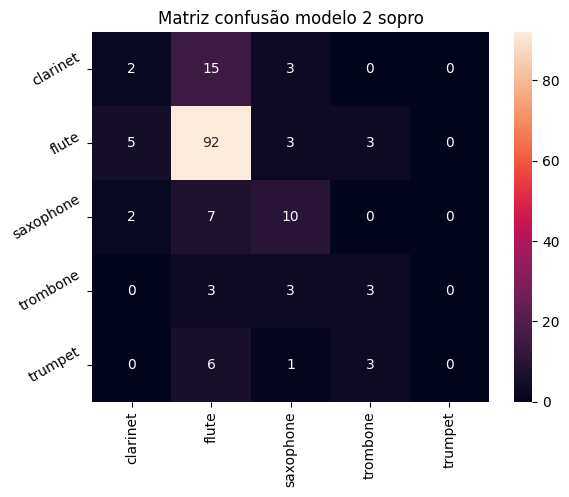

In [41]:
ac.matriz_confusion(
    results_2_sopro['y_validate'],
    results_2_sopro['predictions'],
    labels=np.unique(results_1_sopro["predictions_cat"]),
    title='Matriz confusão modelo 2 sopro',
    rename_labels=True
)


## Percusão 

### Model 1

- Detected outilers

In [42]:
outlier_model_1_percusao = ac.detected_outilers_knn(metric="manhattan", algorithm="brute", neighbors=3, dataframe=df_inst_percusao)

algorithm parameter is deprecated and will be removed in version 0.7.6. By default, ball_tree will be used.


- Removed outilers

In [43]:
df_inst_percusao_01 = ac.show_outilers(dataframe=df_inst_percusao, pred=outlier_model_1_percusao["predictions"])
df_inst_percusao_01

,tonnetz0,tonnetz1,chroma1,chroma2,chroma3,chroma4,chroma5,chroma6,chroma7,mfcc0,...,spectral_band3,spectral_band4,spectral_centroid,spectral_onset,spectral_rolloff,spectogram,mel_spectogram,zero_crossing_rate,zero_crossing,instrumento
2066,0.067263,-0.079658,0.400289,0.414243,0.519233,0.403937,0.590723,0.326989,0.475230,-97.677353,...,3191.930103,3505.349304,3813.025950,1.273033,7134.060110,-47.323631,-62.697948,0.257473,56977,cymbals
2080,-0.028268,0.020594,0.308341,0.539134,0.486185,0.370537,0.365475,0.277279,0.237507,-201.765625,...,3167.996160,3470.966019,5631.779972,1.150056,8727.017531,-66.101967,-79.368797,0.486816,107670,cymbals
2087,0.000423,0.008728,0.315313,0.329236,0.318093,0.291647,0.358462,0.355331,0.340839,-375.171051,...,3165.206108,3459.666432,4034.598255,2.311115,7370.300831,-48.193481,-79.993744,0.275738,60975,cymbals
2090,-0.027502,-0.040906,0.428343,0.575150,0.432707,0.349952,0.269307,0.282274,0.353393,-208.308487,...,3264.125234,3599.667922,4320.618296,1.748420,7560.852192,-42.228710,-69.745705,0.315267,69716,cymbals
2094,0.001026,0.038686,0.623367,0.699129,0.707563,0.655757,0.604192,0.523323,0.529614,-188.658508,...,3494.783760,3826.681620,3867.138696,1.992037,7526.653869,-51.500580,-59.241554,0.211064,46633,cymbals
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4548,-0.336018,-0.463490,0.187934,0.705260,0.531249,0.322856,0.199759,0.178082,0.259735,-298.939850,...,2686.337378,3395.363828,1251.895828,0.913958,2349.167543,-39.887836,-76.786873,0.104538,23109,mallet_percussion
4549,0.002682,-0.031066,0.318778,0.249719,0.236765,0.188140,0.255103,0.378614,0.406869,-389.299408,...,2915.431351,3314.920715,3257.742889,1.764614,5858.005490,-69.019249,-74.674164,0.244661,54124,mallet_percussion
4556,0.194896,0.002140,0.478326,0.307317,0.561531,0.196112,0.343925,0.146070,0.219555,-155.779510,...,1830.607452,2382.839412,1619.491653,0.983737,2493.180206,-45.290844,-61.667641,0.131271,29017,mallet_percussion
4577,0.348110,0.159918,0.278293,0.092337,0.303201,0.065521,0.185706,0.234855,0.103411,-222.538467,...,2308.127902,2891.545646,2264.087534,1.359796,3551.354782,-21.233885,-59.256969,0.166638,36868,mallet_percussion


- Train model


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
The loss 'categorical_crossentropy' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 156 - Acuracia do modelo HistGradientBoostingClassifier(loss='categorical_crossentropy', max_bins=165,
                               max_depth=14) do Fold 0: 0.75


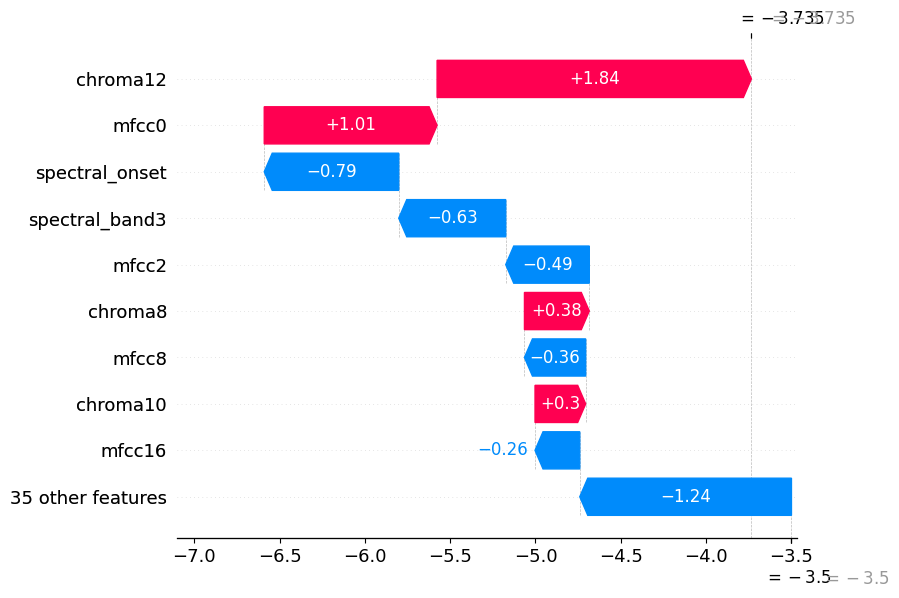

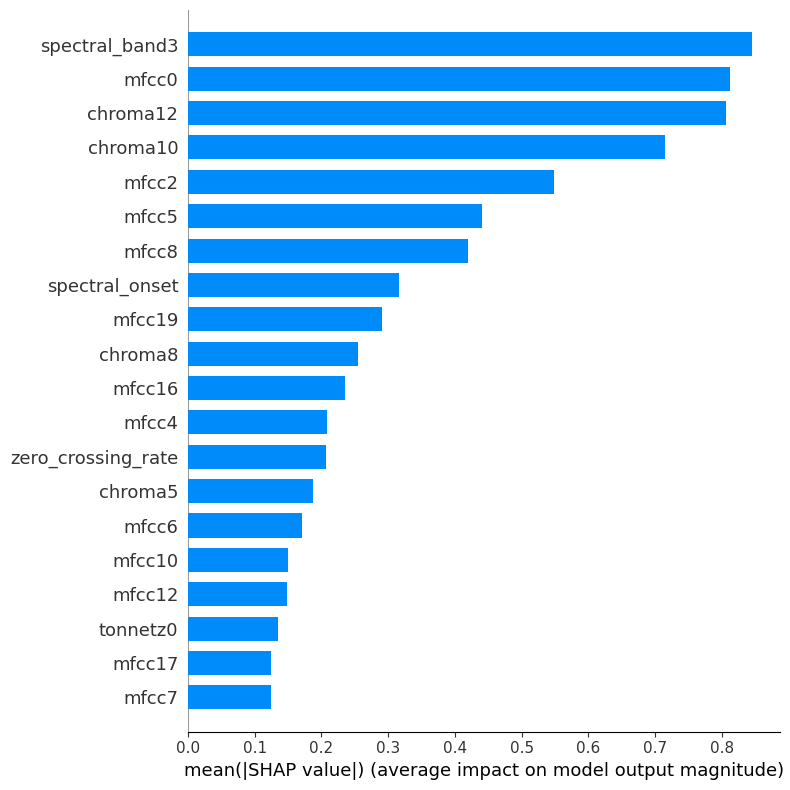

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


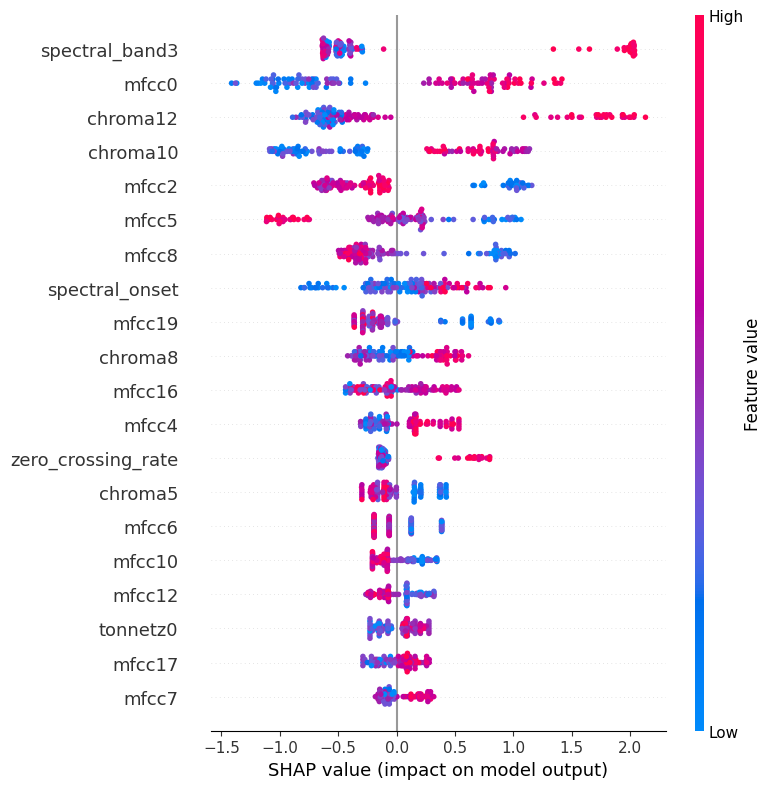

The loss 'categorical_crossentropy' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 156 - Acuracia do modelo HistGradientBoostingClassifier(loss='categorical_crossentropy', max_bins=165,
                               max_depth=14) do Fold 1: 0.7419354838709677


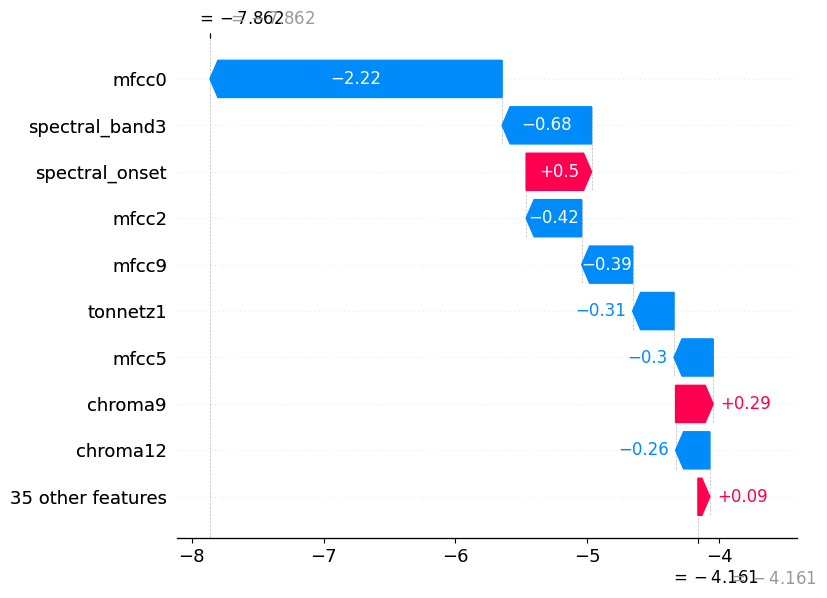

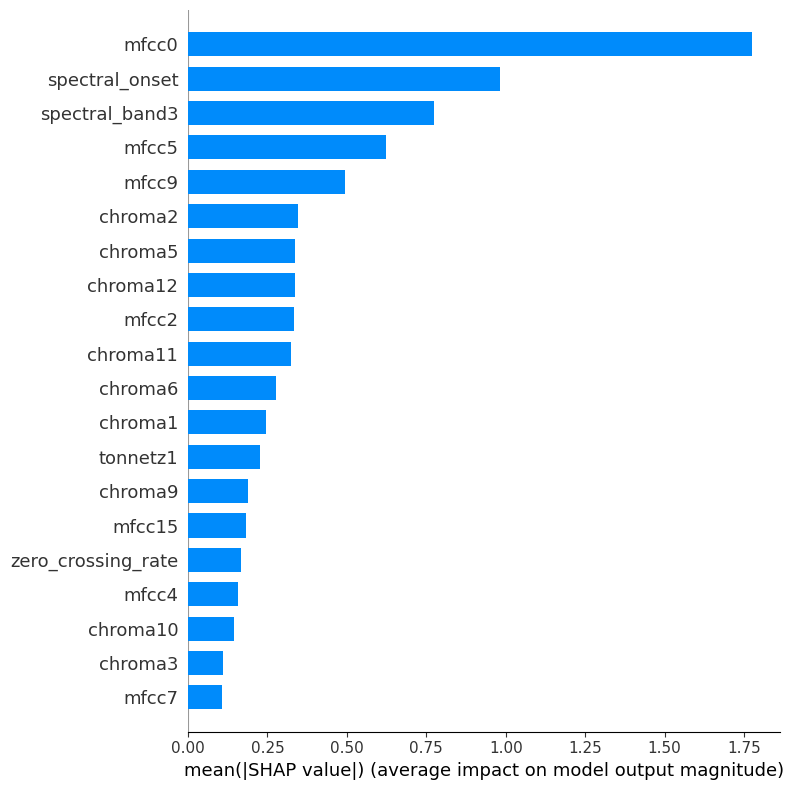

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


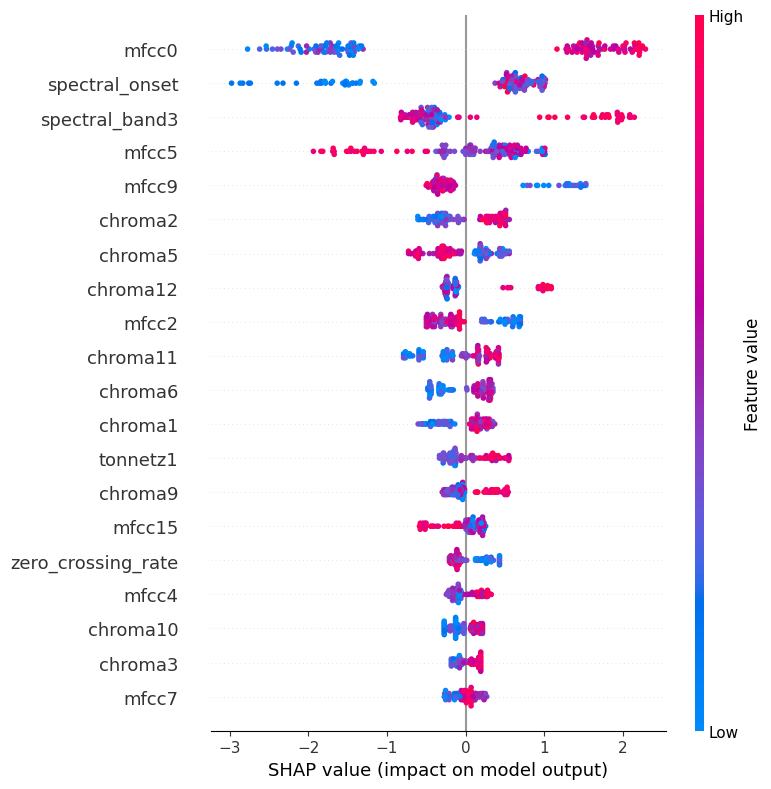

The loss 'categorical_crossentropy' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 156 - Acuracia do modelo HistGradientBoostingClassifier(loss='categorical_crossentropy', max_bins=165,
                               max_depth=14) do Fold 2: 0.7096774193548387


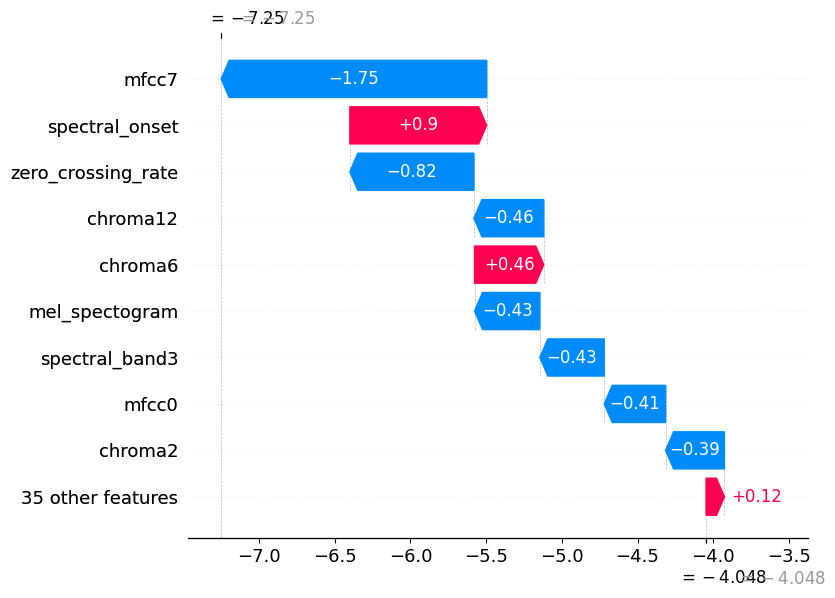

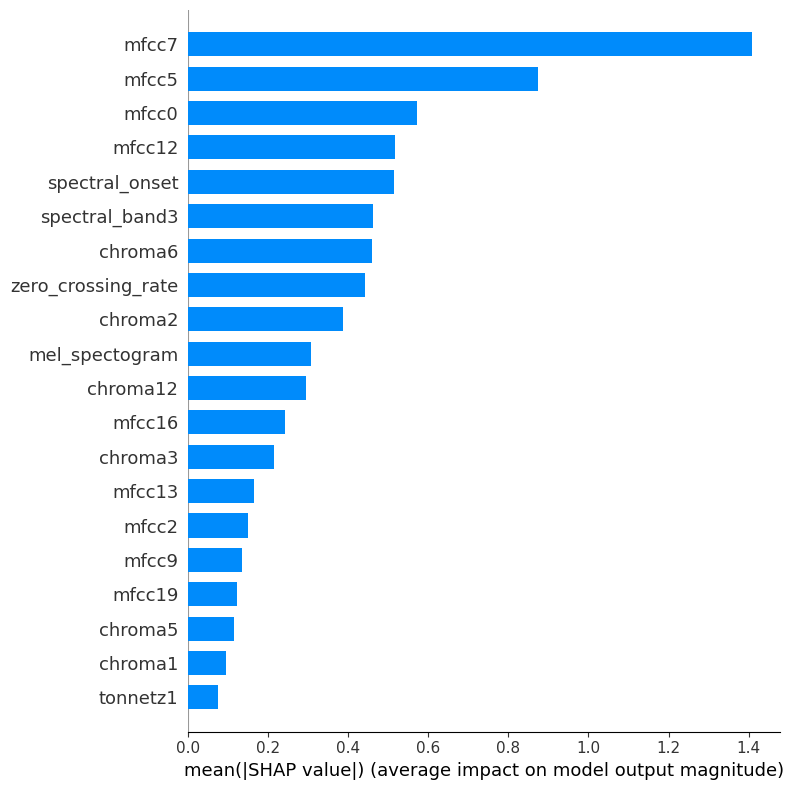

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


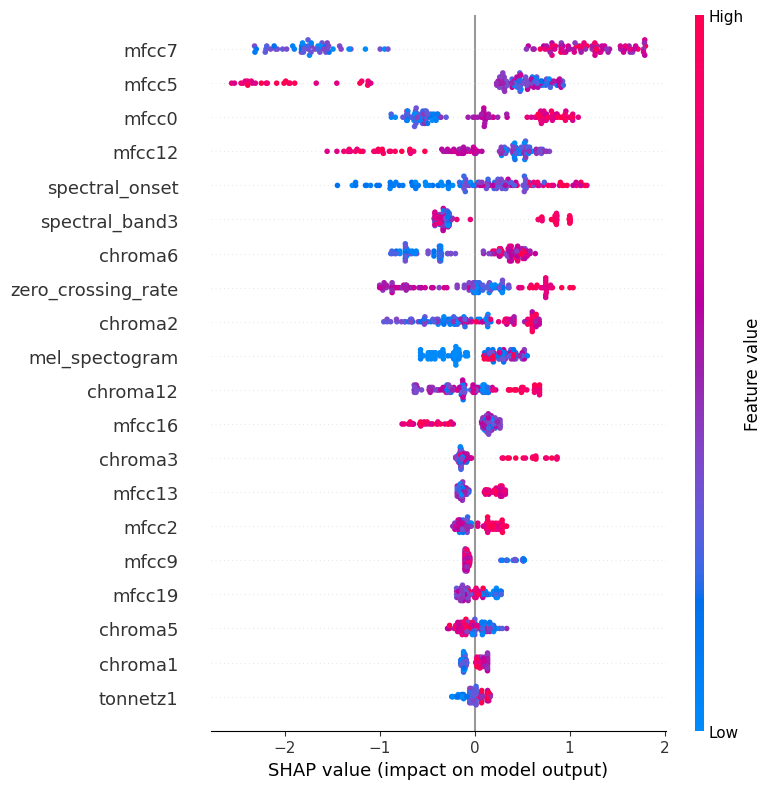

The loss 'categorical_crossentropy' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 156 - Acuracia do modelo HistGradientBoostingClassifier(loss='categorical_crossentropy', max_bins=165,
                               max_depth=14) do Fold 3: 0.7096774193548387


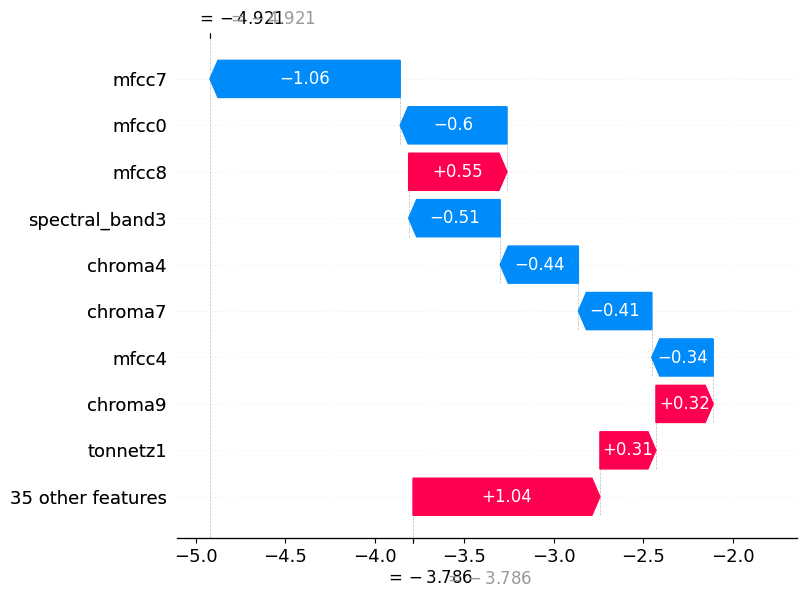

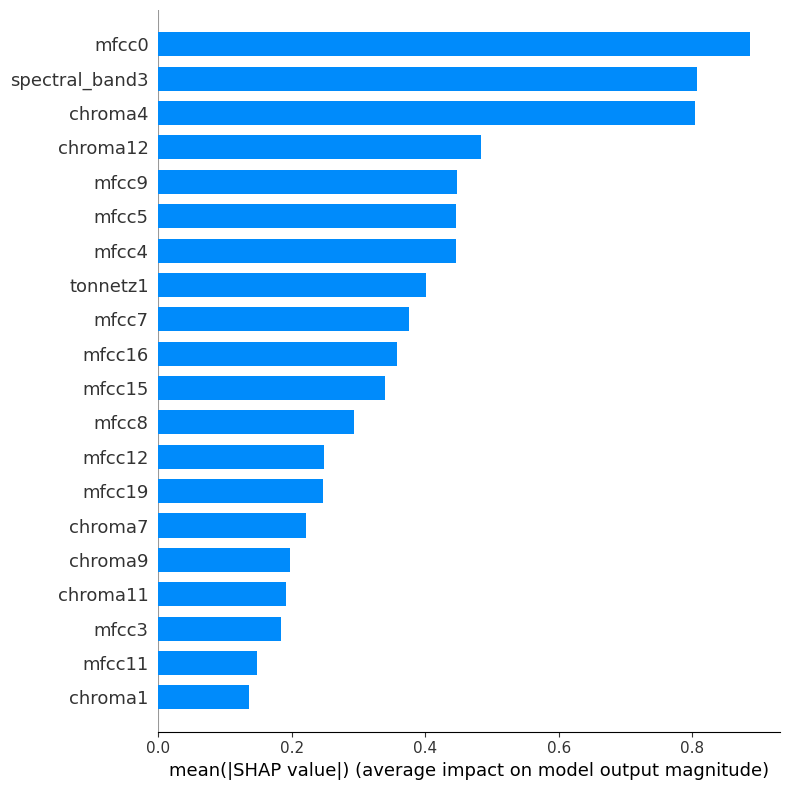

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


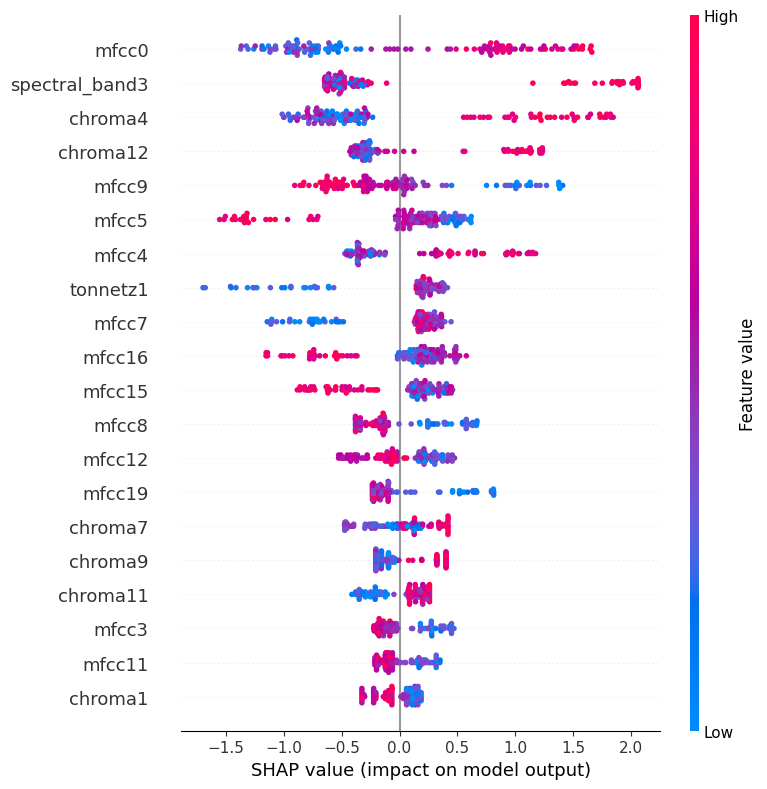

The loss 'categorical_crossentropy' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 156 - Acuracia do modelo HistGradientBoostingClassifier(loss='categorical_crossentropy', max_bins=165,
                               max_depth=14) do Fold 4: 0.7096774193548387


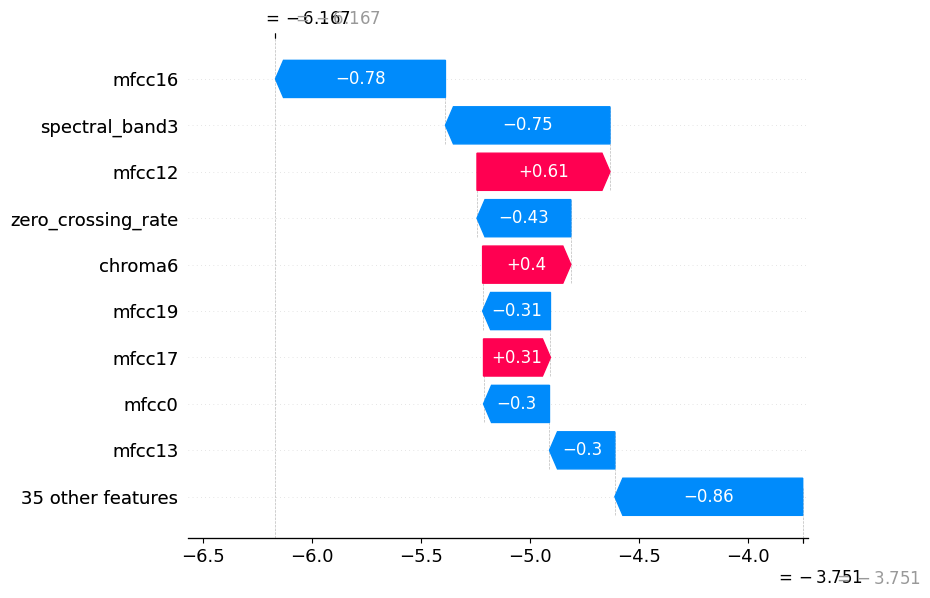

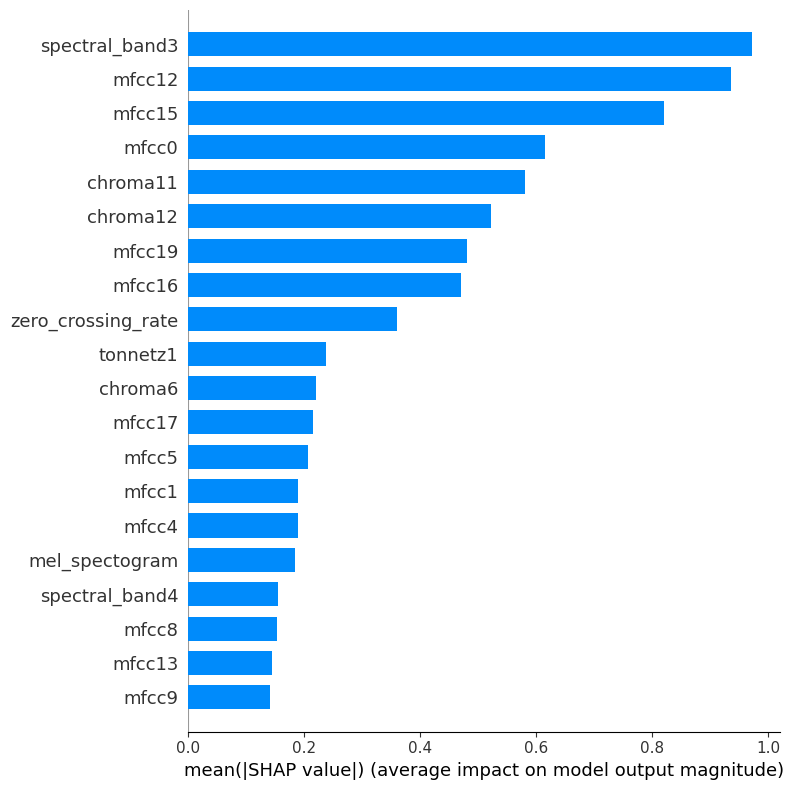

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


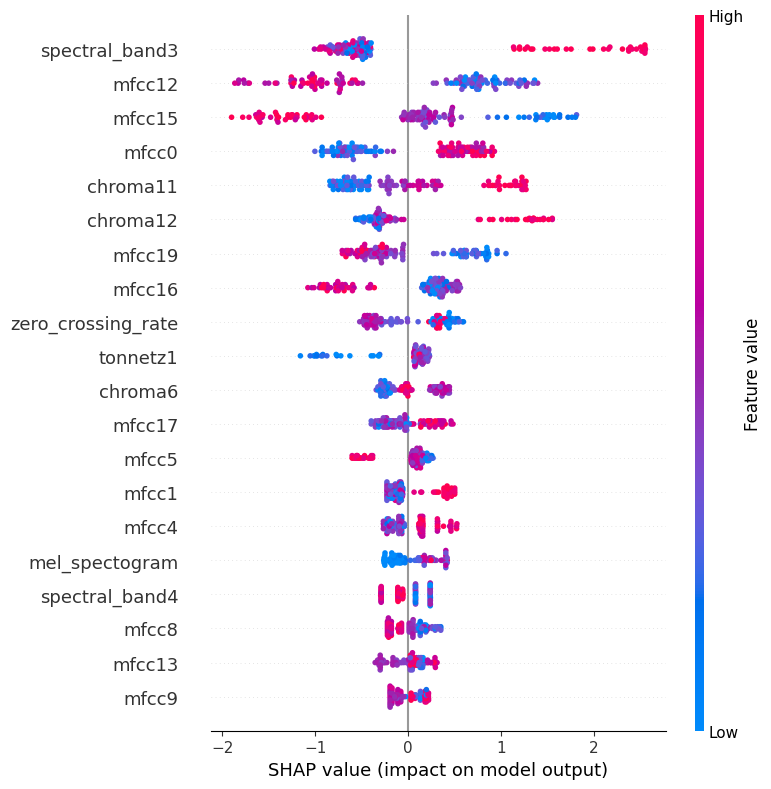

{'accuracy_mean': 72.41935483870968,
 'std': 0.017960530202677474,
 'predictions': array([0., 0., 0., 0., 0., 0., 2., 1., 0., 2., 2., 1., 1., 2., 2., 2., 2.,
        2., 2., 2., 2., 0., 2., 2., 2., 2., 0., 2., 2., 2., 0., 0., 2., 2.,
        0., 0., 0., 2., 0., 2., 1., 1., 2., 0., 1., 2., 2., 2., 2., 0., 2.,
        2., 2., 2., 2., 2., 2., 2., 2., 2., 0., 2., 2., 0., 0., 0., 2., 1.,
        0., 1., 0., 2., 2., 0., 0., 1., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
        2., 2., 2., 0., 0., 2., 2., 2., 2., 1., 1., 2., 0., 0., 2., 2., 0.,
        0., 1., 2., 2., 1., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
        1., 2., 2., 2., 2., 2., 0., 0., 2., 0., 2., 2., 0., 0., 0., 0., 0.,
        0., 2., 2., 2., 2., 2., 2., 1., 2., 2., 2., 2., 2., 1., 2., 2., 2.,
        2., 2., 2.]),
 'y_validate': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 2., 2., 2., 2.,
        2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 0., 0.,
        0., 0., 0., 0., 0., 0., 1., 1., 1., 1.

In [44]:
model = HistGradientBoostingClassifier(
    loss= 'categorical_crossentropy',
    max_bins=165,
    max_depth=14,
    min_samples_leaf=20
)

results_1_percusao = tm.cross_validate_balancead(k=5, model=model, dataframe=df_inst_percusao_01, y_pred="instrumento", shap=True)
results_1_percusao

- Matrix de confusão

<Axes: title={'center': 'Matriz confusão modelo 1 percusao'}>

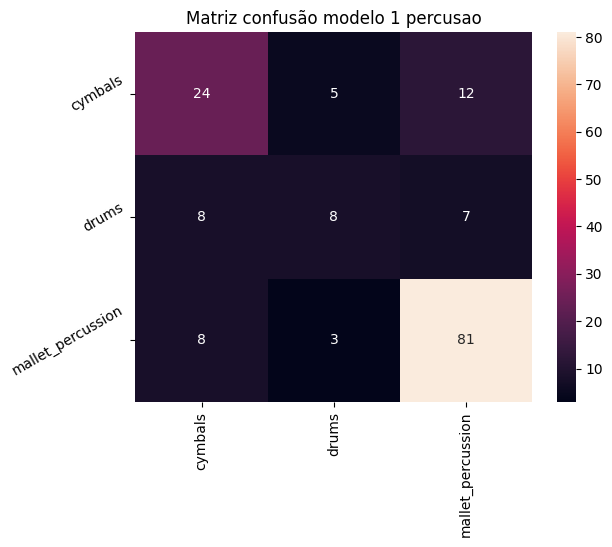

In [45]:
ac.matriz_confusion(
    results_1_percusao['y_validate'],
    results_1_percusao['predictions'],
    labels=np.unique(results_1_percusao["predictions_cat"]),
    title='Matriz confusão modelo 1 percusao',
    rename_labels=True
)

### Model 2

- Detected Outilers 

In [46]:
outlier_model_2_percusao = ac.detected_outilers_knn(metric="minkowski", algorithm="ball_tree", neighbors=9, dataframe=df_inst_percusao)

- Removed outilers

In [47]:
df_inst_percusao_02 = ac.show_outilers(dataframe=df_inst_percusao, pred=outlier_model_2_percusao["predictions"])
df_inst_percusao_02

,tonnetz0,tonnetz1,chroma1,chroma2,chroma3,chroma4,chroma5,chroma6,chroma7,mfcc0,...,spectral_band3,spectral_band4,spectral_centroid,spectral_onset,spectral_rolloff,spectogram,mel_spectogram,zero_crossing_rate,zero_crossing,instrumento
2066,0.067263,-0.079658,0.400289,0.414243,0.519233,0.403937,0.590723,0.326989,0.475230,-97.677353,...,3191.930103,3505.349304,3813.025950,1.273033,7134.060110,-47.323631,-62.697948,0.257473,56977,cymbals
2080,-0.028268,0.020594,0.308341,0.539134,0.486185,0.370537,0.365475,0.277279,0.237507,-201.765625,...,3167.996160,3470.966019,5631.779972,1.150056,8727.017531,-66.101967,-79.368797,0.486816,107670,cymbals
2084,0.090227,0.001803,0.181475,0.215828,0.223079,0.230837,0.477740,0.319292,0.496053,-56.463753,...,2583.002727,2945.350082,2887.785890,1.069310,5327.569254,-51.677456,-71.216888,0.188245,41621,cymbals
2087,0.000423,0.008728,0.315313,0.329236,0.318093,0.291647,0.358462,0.355331,0.340839,-375.171051,...,3165.206108,3459.666432,4034.598255,2.311115,7370.300831,-48.193481,-79.993744,0.275738,60975,cymbals
2090,-0.027502,-0.040906,0.428343,0.575150,0.432707,0.349952,0.269307,0.282274,0.353393,-208.308487,...,3264.125234,3599.667922,4320.618296,1.748420,7560.852192,-42.228710,-69.745705,0.315267,69716,cymbals
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4549,0.002682,-0.031066,0.318778,0.249719,0.236765,0.188140,0.255103,0.378614,0.406869,-389.299408,...,2915.431351,3314.920715,3257.742889,1.764614,5858.005490,-69.019249,-74.674164,0.244661,54124,mallet_percussion
4556,0.194896,0.002140,0.478326,0.307317,0.561531,0.196112,0.343925,0.146070,0.219555,-155.779510,...,1830.607452,2382.839412,1619.491653,0.983737,2493.180206,-45.290844,-61.667641,0.131271,29017,mallet_percussion
4573,0.424326,-0.240209,0.127338,0.211656,0.438093,0.604280,0.843284,0.976121,0.586622,-423.657928,...,747.397330,1068.042998,283.995303,0.419410,510.951435,-62.118206,-73.764893,0.012129,2688,mallet_percussion
4577,0.348110,0.159918,0.278293,0.092337,0.303201,0.065521,0.185706,0.234855,0.103411,-222.538467,...,2308.127902,2891.545646,2264.087534,1.359796,3551.354782,-21.233885,-59.256969,0.166638,36868,mallet_percussion


- Train Model


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
The loss 'categorical_crossentropy' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 156 - Acuracia do modelo HistGradientBoostingClassifier(loss='categorical_crossentropy', max_bins=177,
                               max_depth=12, min_samples_leaf=19) do Fold 0: 0.75


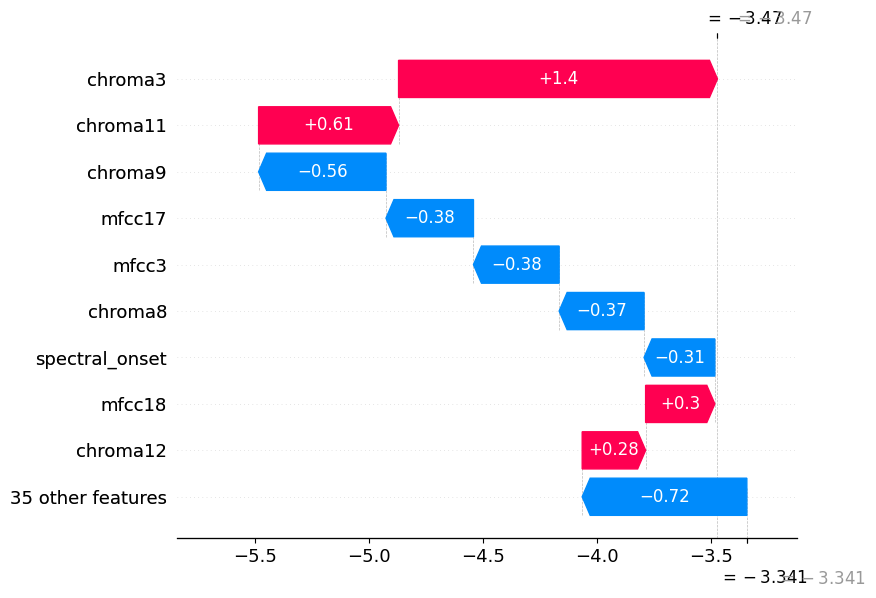

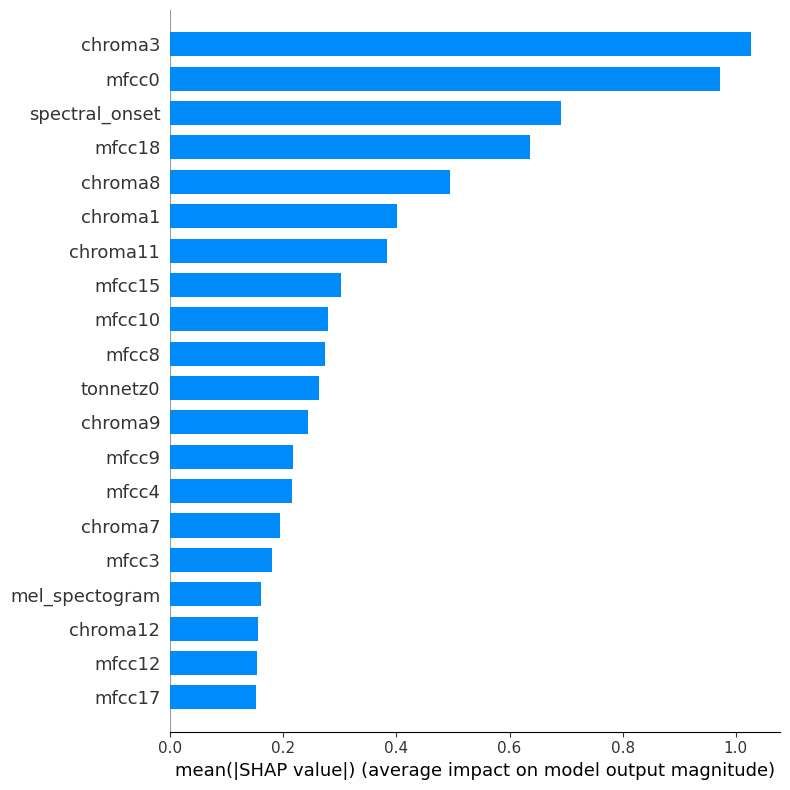

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


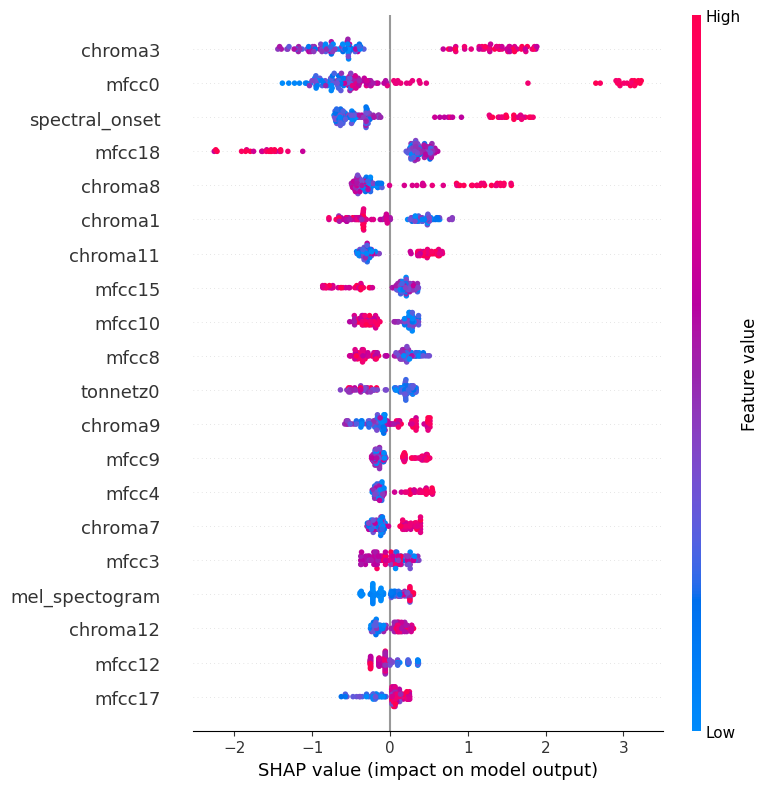

The loss 'categorical_crossentropy' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 156 - Acuracia do modelo HistGradientBoostingClassifier(loss='categorical_crossentropy', max_bins=177,
                               max_depth=12, min_samples_leaf=19) do Fold 1: 0.6129032258064516


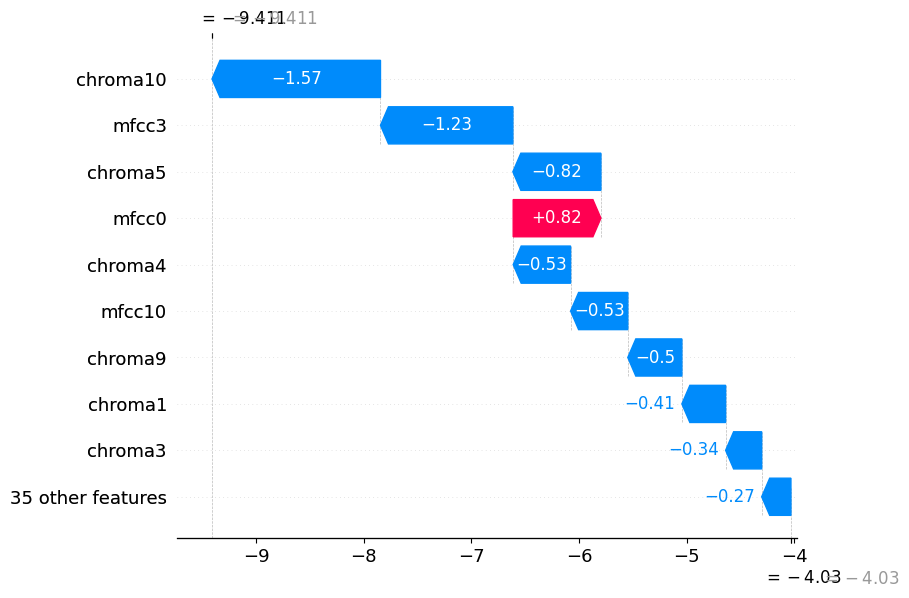

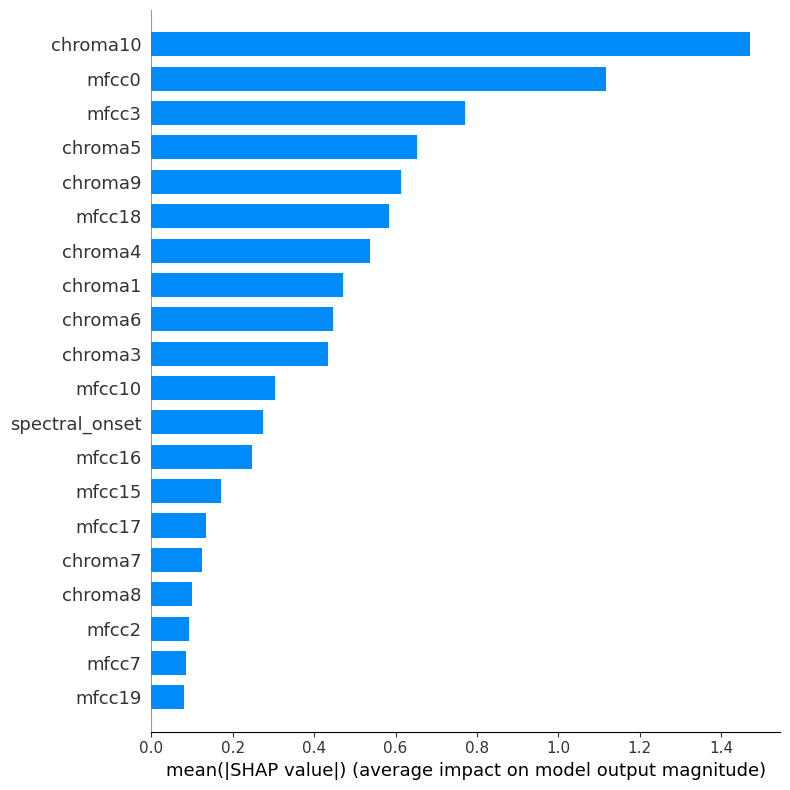

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


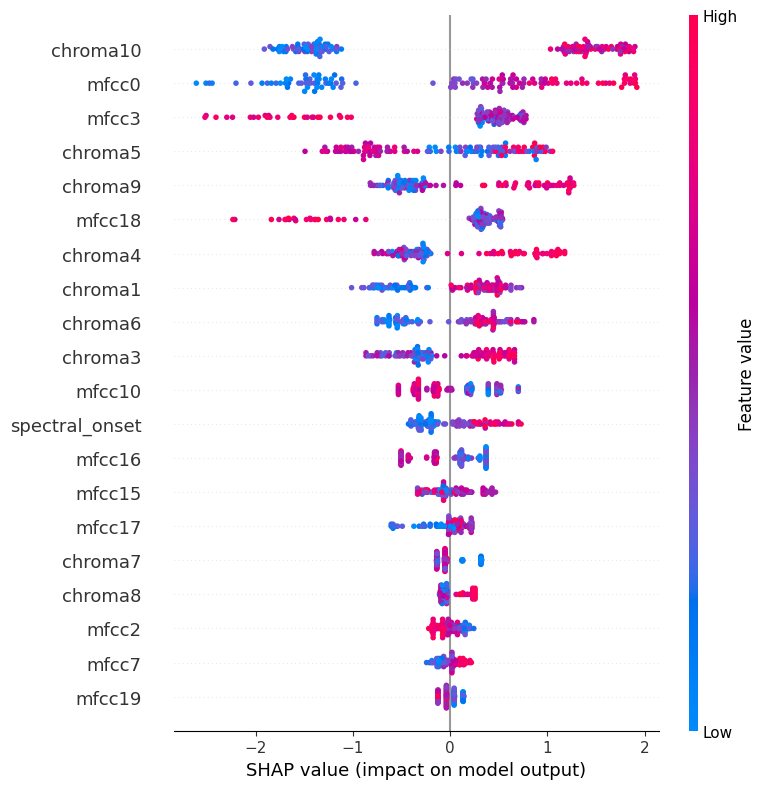

The loss 'categorical_crossentropy' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 156 - Acuracia do modelo HistGradientBoostingClassifier(loss='categorical_crossentropy', max_bins=177,
                               max_depth=12, min_samples_leaf=19) do Fold 2: 0.6451612903225806


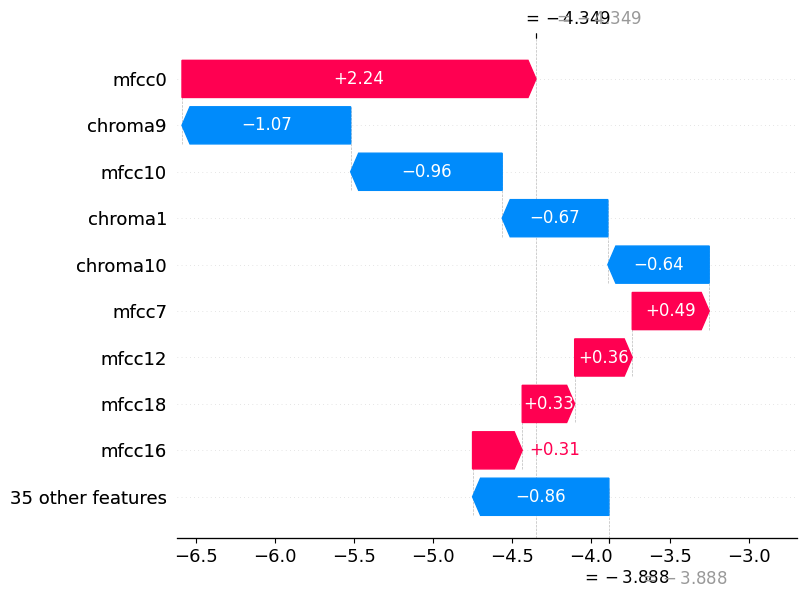

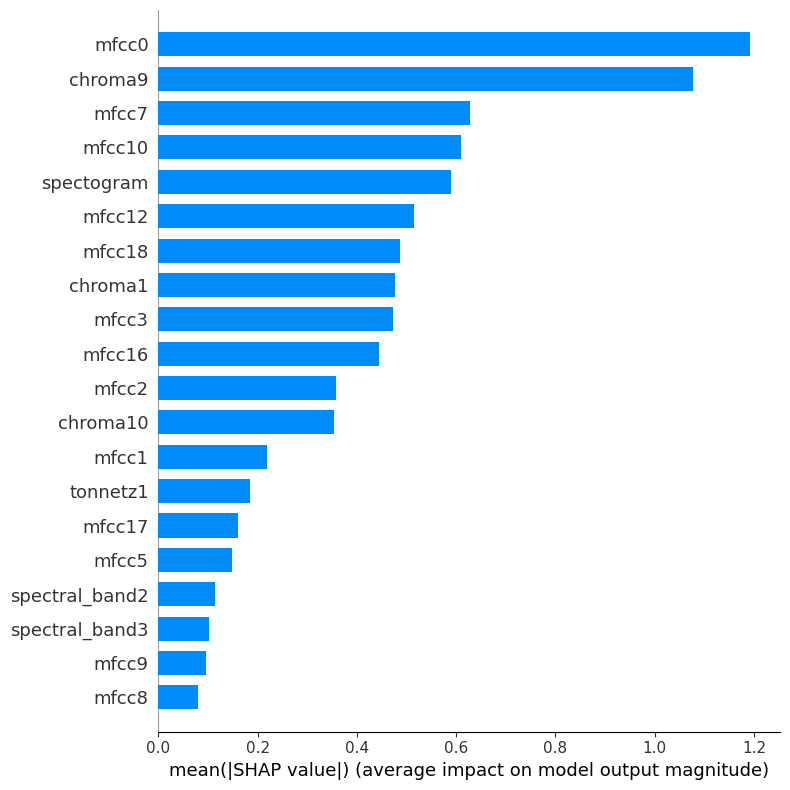

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


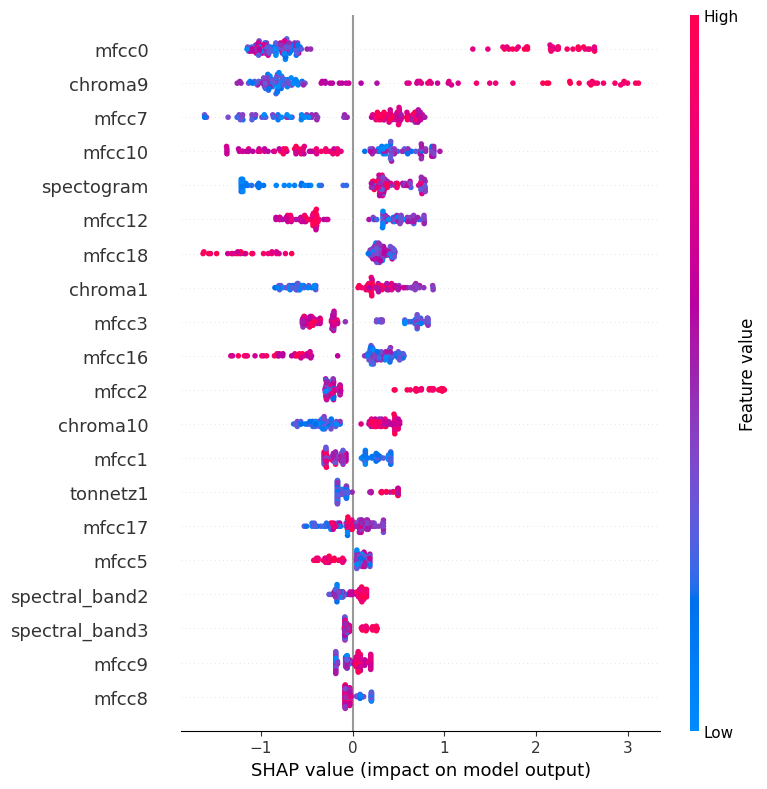

The loss 'categorical_crossentropy' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 156 - Acuracia do modelo HistGradientBoostingClassifier(loss='categorical_crossentropy', max_bins=177,
                               max_depth=12, min_samples_leaf=19) do Fold 3: 0.6774193548387096


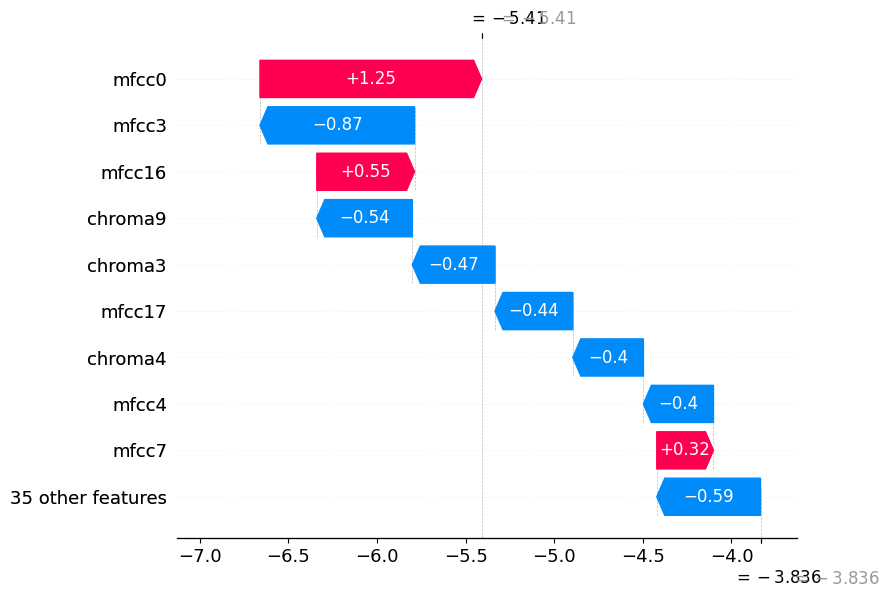

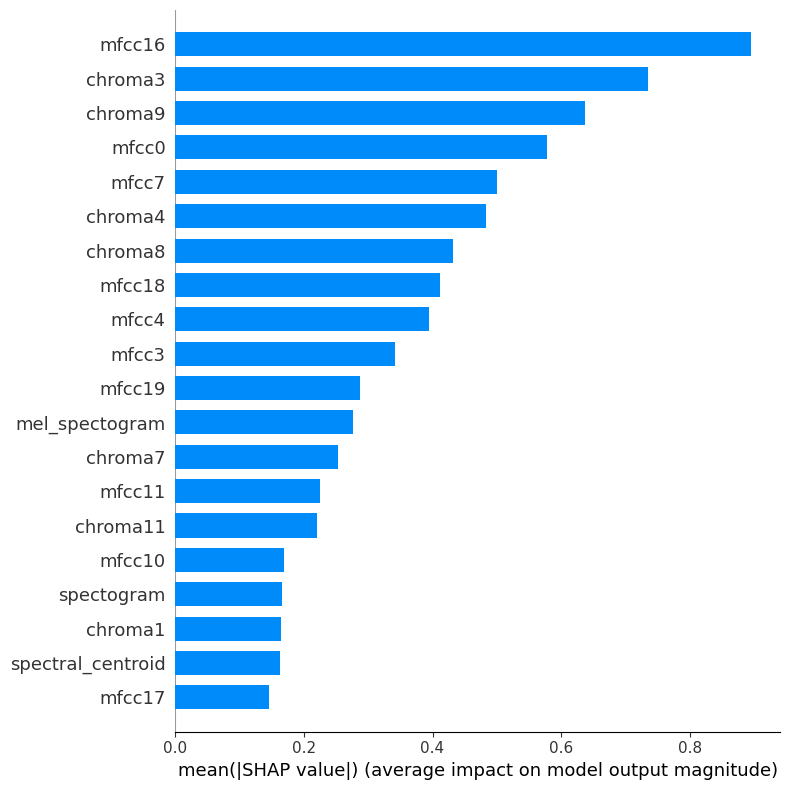

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


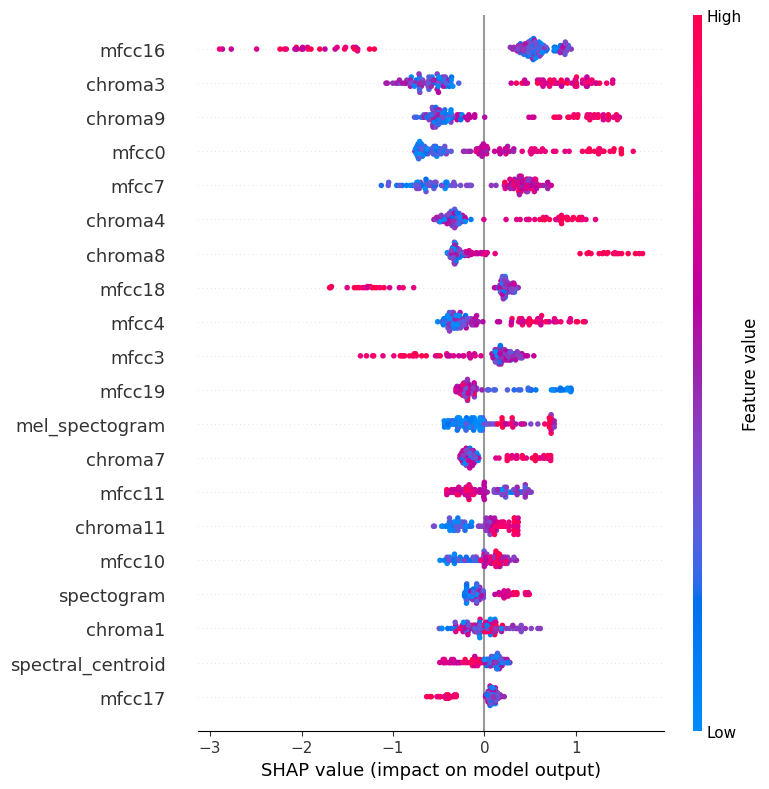

The loss 'categorical_crossentropy' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 156 - Acuracia do modelo HistGradientBoostingClassifier(loss='categorical_crossentropy', max_bins=177,
                               max_depth=12, min_samples_leaf=19) do Fold 4: 0.7741935483870968


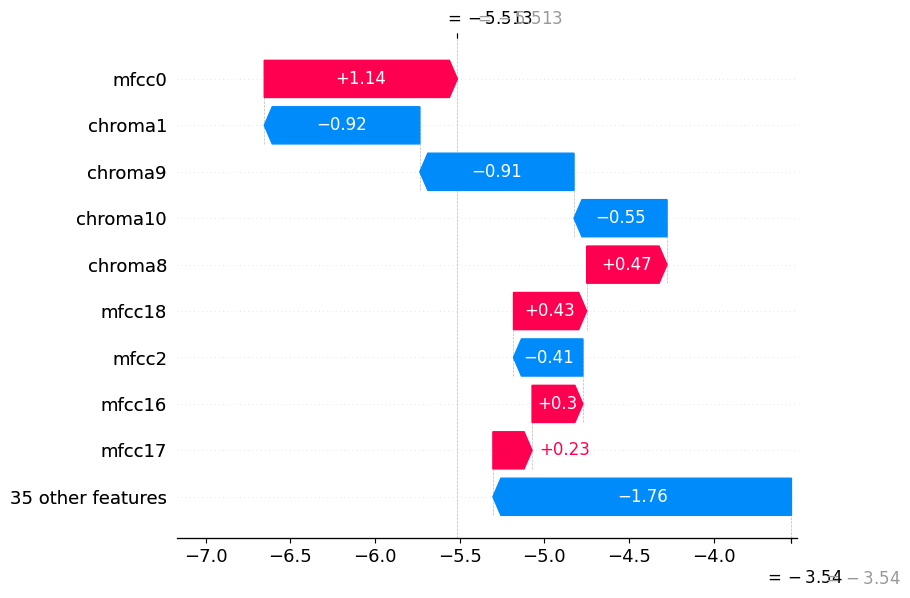

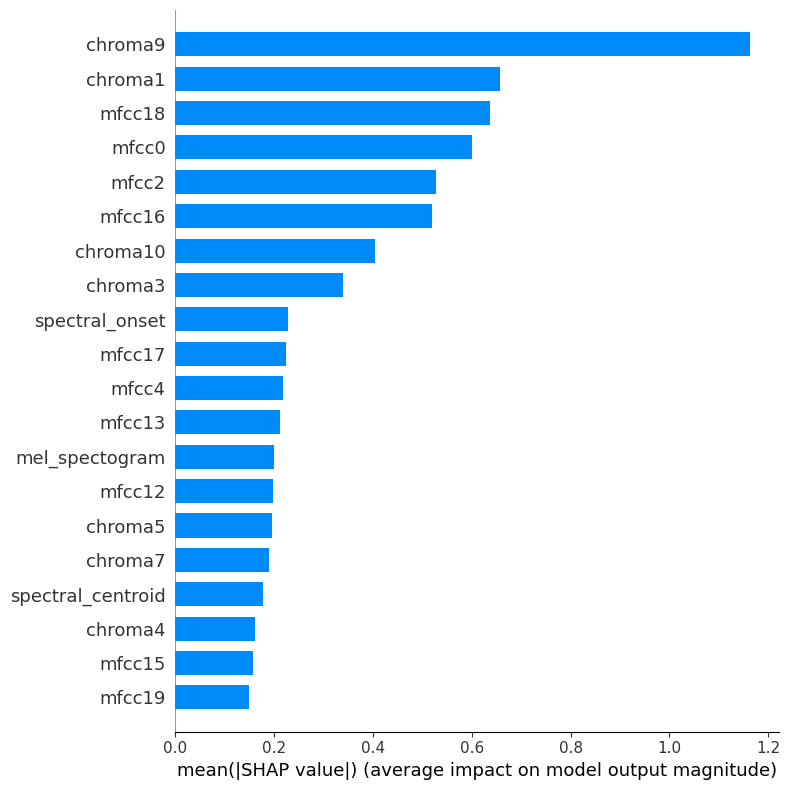

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


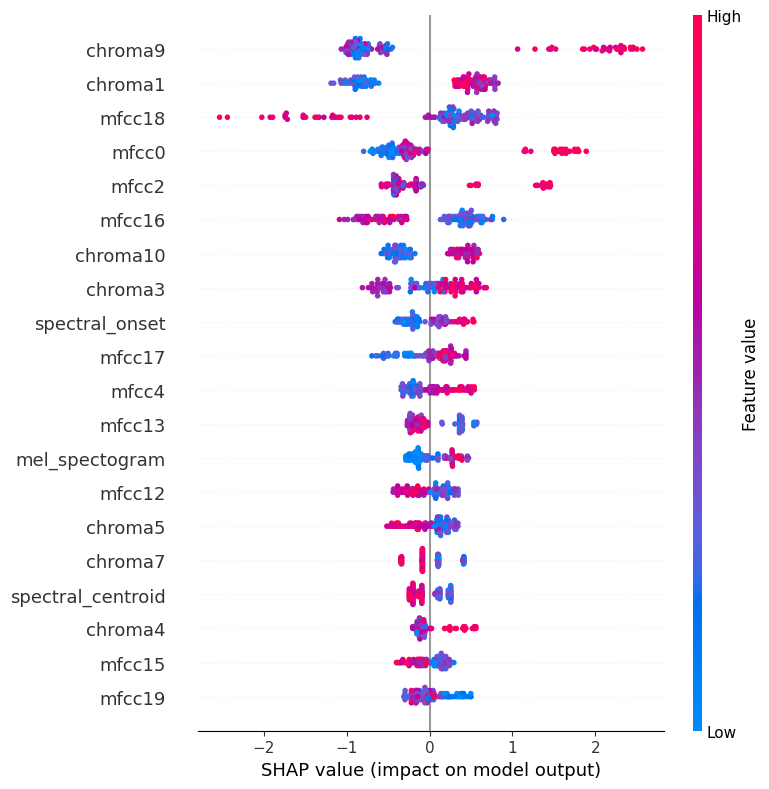

{'accuracy_mean': 69.19354838709675,
 'std': 0.06129032258064516,
 'predictions': array([0., 0., 2., 0., 0., 0., 2., 2., 2., 0., 2., 0., 1., 1., 1., 2., 2.,
        2., 2., 2., 2., 2., 0., 2., 2., 2., 2., 2., 0., 2., 2., 2., 2., 0.,
        0., 0., 0., 1., 0., 0., 2., 1., 1., 2., 0., 0., 1., 0., 1., 2., 2.,
        0., 2., 0., 2., 2., 2., 0., 2., 2., 2., 2., 2., 2., 2., 0., 2., 0.,
        0., 1., 1., 0., 2., 2., 1., 2., 0., 1., 2., 2., 2., 2., 2., 0., 2.,
        2., 2., 2., 2., 2., 2., 0., 2., 2., 1., 0., 1., 2., 0., 0., 2., 1.,
        2., 2., 0., 1., 0., 1., 1., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
        2., 2., 1., 2., 2., 2., 0., 2., 0., 0., 2., 0., 0., 0., 0., 0., 1.,
        0., 1., 1., 1., 2., 2., 2., 2., 0., 0., 2., 2., 1., 2., 2., 2., 2.,
        2., 2., 2.]),
 'y_validate': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 2., 2.,
        2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 1., 1.,

In [48]:
model = HistGradientBoostingClassifier(
    loss= 'categorical_crossentropy',
    max_bins=177,
    max_depth=12,
    min_samples_leaf=19
)

results_2_percusao = tm.cross_validate_balancead(k=5, model=model, dataframe=df_inst_percusao_02, shap=True, y_pred="instrumento")
results_2_percusao

- Matriz de confusão

<Axes: title={'center': 'Matriz confusão moodelo 2 Percusão'}>

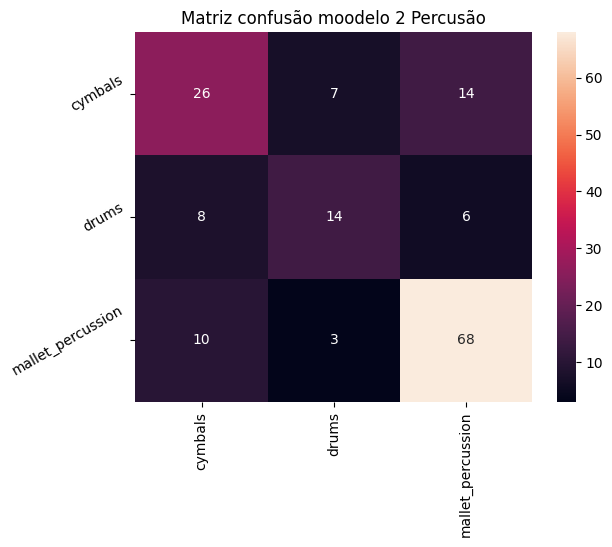

In [49]:
ac.matriz_confusion(
    results_2_percusao['y_validate'],
    results_2_percusao['predictions'], 
    labels=np.unique(results_2_percusao['predictions_cat']),
    title='Matriz confusão moodelo 2 Percusão',
    rename_labels=True
)
    

## Corda

### Model 1

- Detected outilers

In [50]:
outlier_model_1_corda = ac.detected_outilers_knn(metric="euclidean", algorithm="brute", neighbors=5, dataframe=df_inst_corda)

algorithm parameter is deprecated and will be removed in version 0.7.6. By default, ball_tree will be used.


- Removed Outilers

In [51]:
df_inst_corda_01 = ac.show_outilers(dataframe=df_inst_corda, pred=outlier_model_1_corda["predictions"])
df_inst_corda_01

,tonnetz0,tonnetz1,chroma1,chroma2,chroma3,chroma4,chroma5,chroma6,chroma7,mfcc0,...,spectral_band3,spectral_band4,spectral_centroid,spectral_onset,spectral_rolloff,spectogram,mel_spectogram,zero_crossing_rate,zero_crossing,instrumento
524,0.044009,0.049910,0.422762,0.372759,0.418751,0.342388,0.345684,0.425205,0.419690,-113.403656,...,3044.652344,3451.164410,2589.236162,1.418300,5736.500270,-55.941154,-70.428162,0.124409,27503,banjo
546,-0.019221,0.017872,0.412917,0.454047,0.530891,0.557669,0.349409,0.344261,0.382070,-202.772339,...,3121.737400,3570.616525,3004.965818,1.600475,5830.002334,-78.944046,-80.000000,0.175861,38878,banjo
548,0.104703,-0.251793,0.163021,0.812954,0.344378,0.115020,0.292584,0.153532,0.169621,-140.371948,...,1813.107640,2368.569054,1704.019101,1.065461,2712.683983,-69.137093,-79.591011,0.129967,28745,banjo
555,-0.035994,0.023556,0.502060,0.572897,0.544631,0.463271,0.181727,0.342575,0.116119,-176.971466,...,2058.067108,2538.017416,2065.352164,1.527929,3548.731828,-65.745941,-79.547966,0.154887,34292,banjo
570,0.128059,0.082795,0.264848,0.264230,0.504677,0.353699,0.363608,0.434325,0.461813,-43.627769,...,3373.943533,3736.268165,3178.869223,1.445494,6845.210425,-47.192692,-59.145737,0.158472,35001,banjo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7999,0.188614,-0.123051,0.435805,0.078954,0.048469,0.095815,0.166382,0.088318,0.250419,-390.158630,...,1643.217840,2069.443752,1772.864514,1.268380,2945.977004,-76.595161,-80.000000,0.126178,27872,violin
8016,0.066705,-0.239727,0.177657,0.249958,0.202065,0.227559,0.358576,0.191313,0.535777,-163.197540,...,2648.310002,3258.026601,2049.088272,1.239214,3472.241494,-45.379463,-80.000000,0.128462,28414,violin
8017,0.096697,-0.279816,0.159033,0.078111,0.079078,0.180735,0.292732,0.125269,0.363708,-115.140617,...,2756.730917,3348.078759,2277.244488,1.186836,3779.127109,-50.537724,-80.000000,0.143759,31806,violin
8020,0.015595,-0.058762,0.120028,0.238263,0.234643,0.267743,0.228591,0.260930,0.267262,-324.705627,...,2995.859927,3383.563150,3573.542978,1.354204,6552.813508,-43.596504,-73.498703,0.230540,50962,violin


- Train Model


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
The loss 'auto' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 274 - Acuracia do modelo HistGradientBoostingClassifier(loss='auto', max_bins=250, max_depth=13) do Fold 0: 0.4


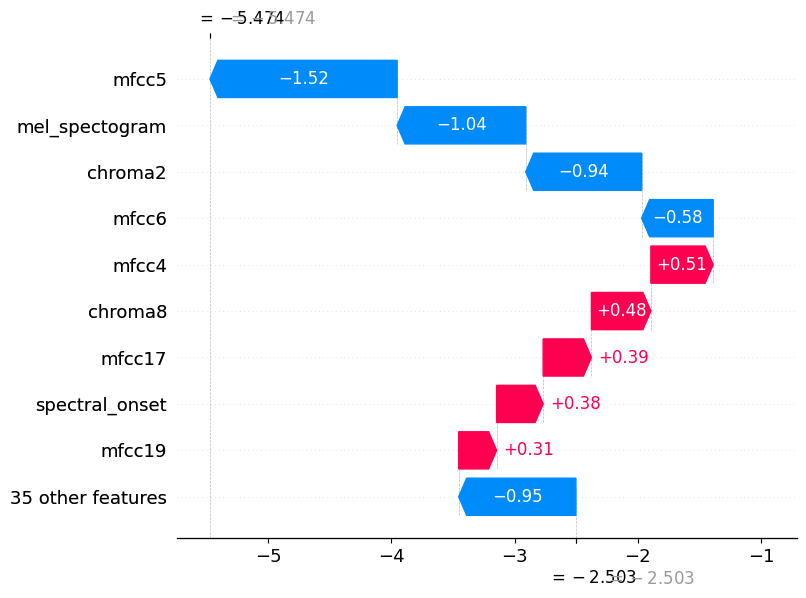

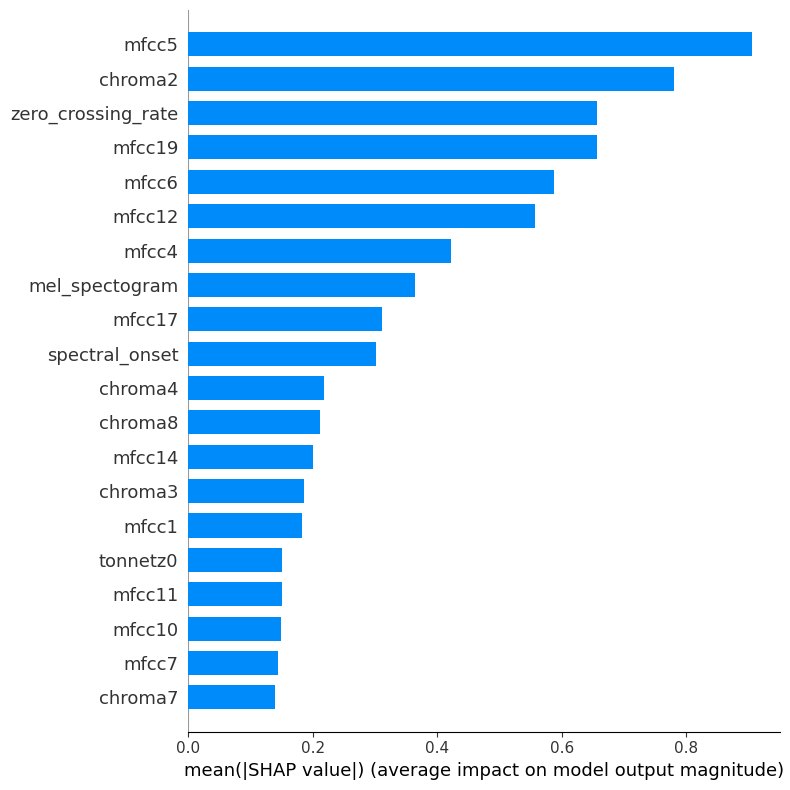

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


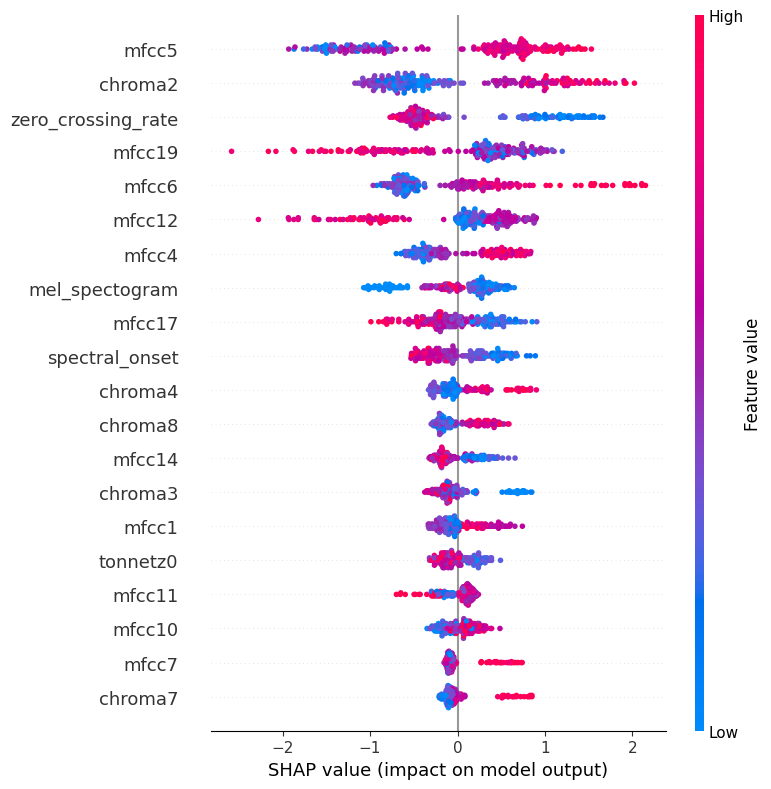

The loss 'auto' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 274 - Acuracia do modelo HistGradientBoostingClassifier(loss='auto', max_bins=250, max_depth=13) do Fold 1: 0.4


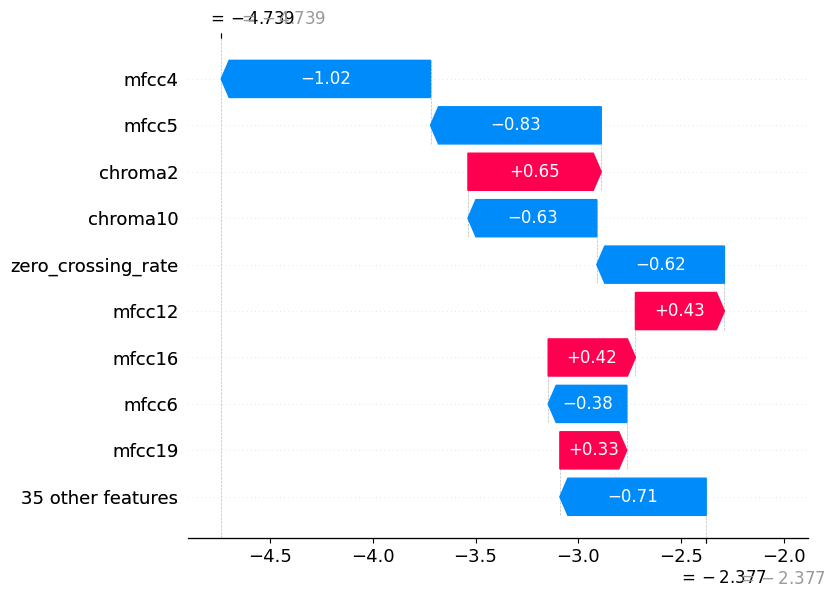

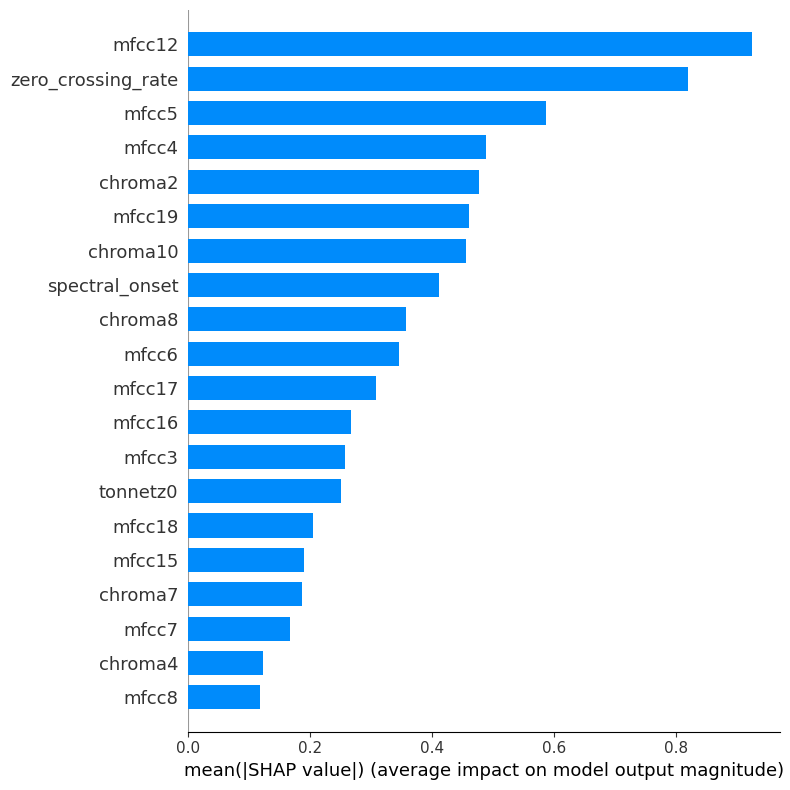

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


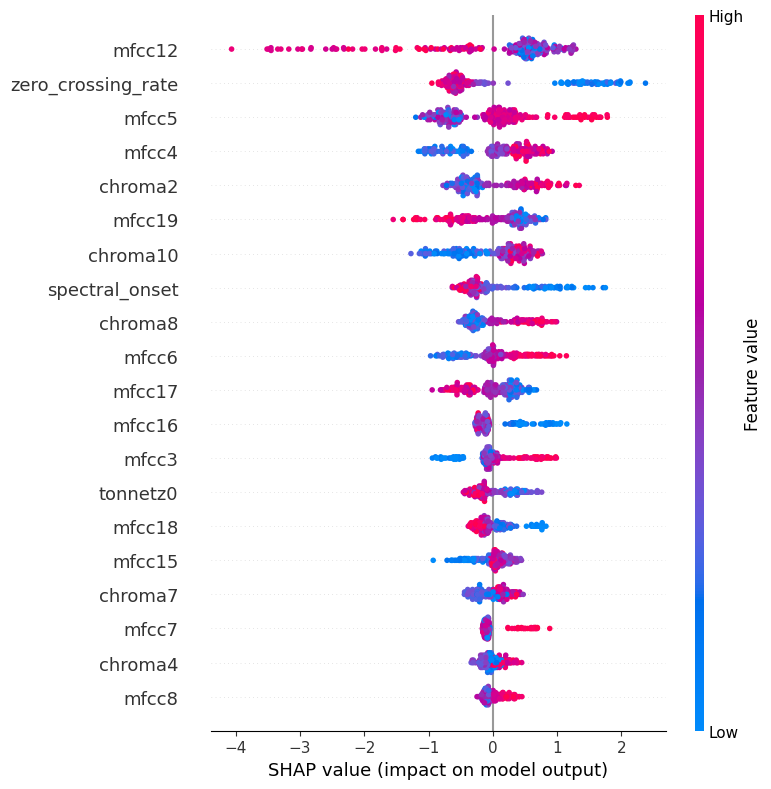

The loss 'auto' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 274 - Acuracia do modelo HistGradientBoostingClassifier(loss='auto', max_bins=250, max_depth=13) do Fold 2: 0.4


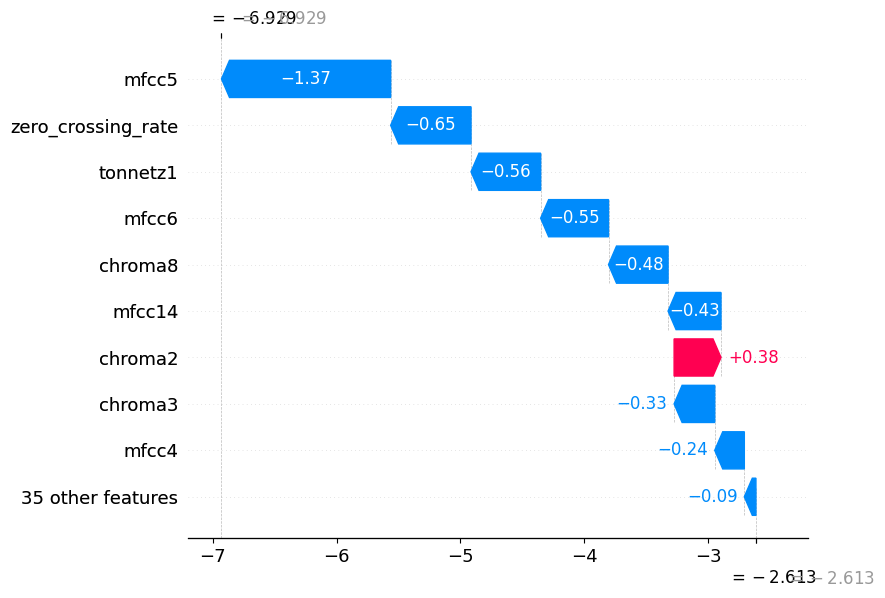

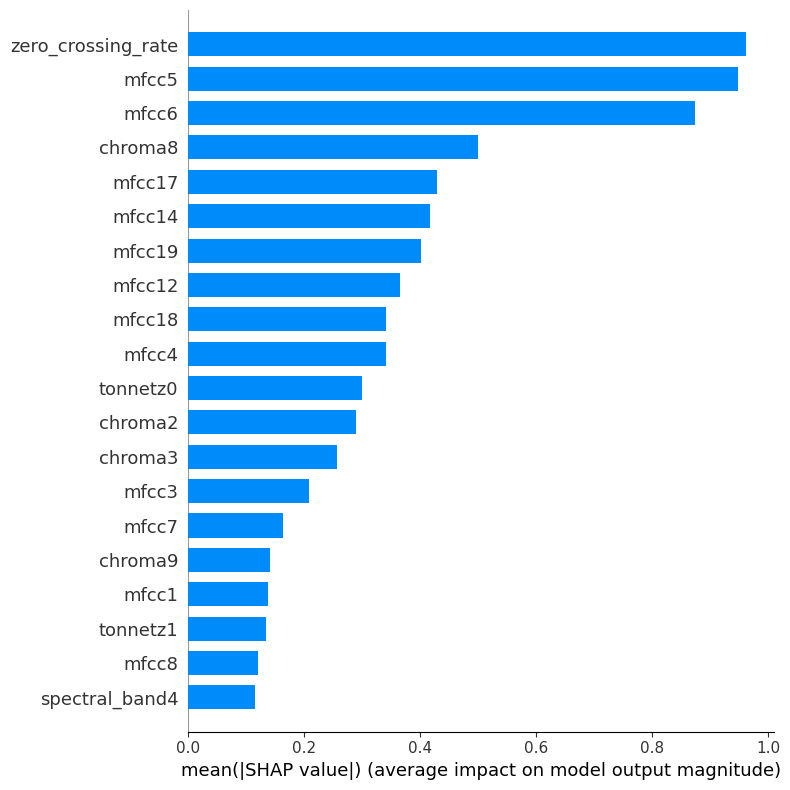

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


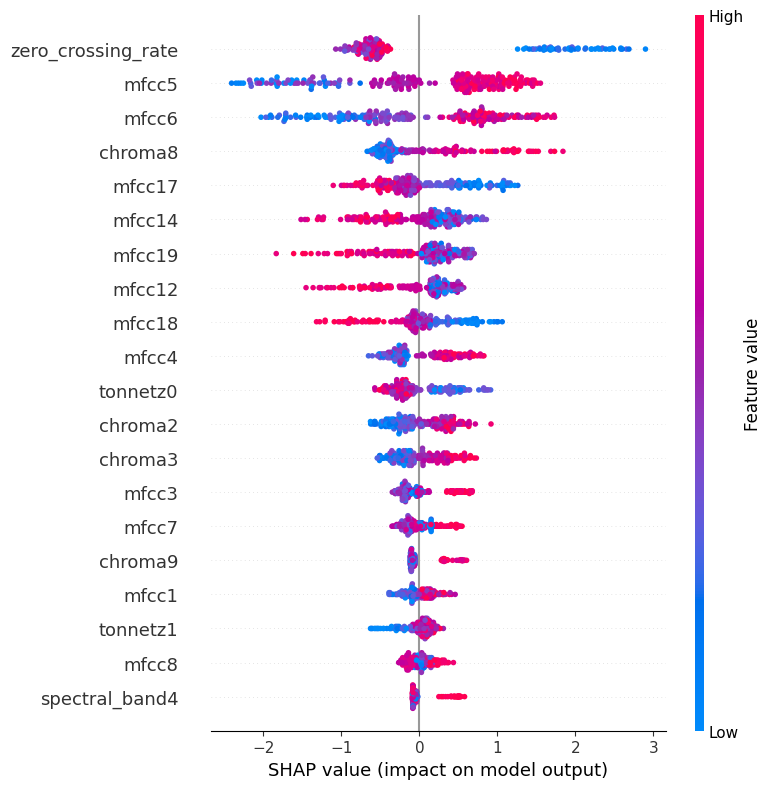

The loss 'auto' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 274 - Acuracia do modelo HistGradientBoostingClassifier(loss='auto', max_bins=250, max_depth=13) do Fold 3: 0.6


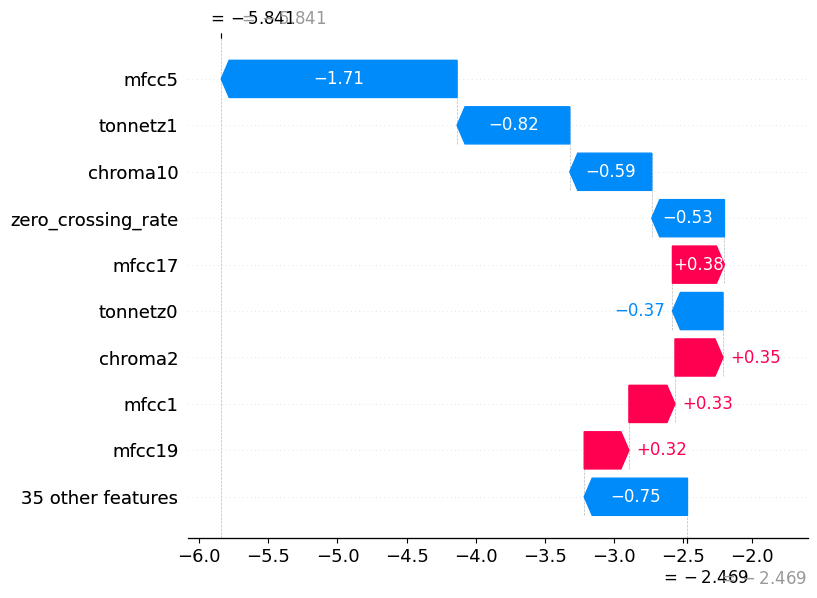

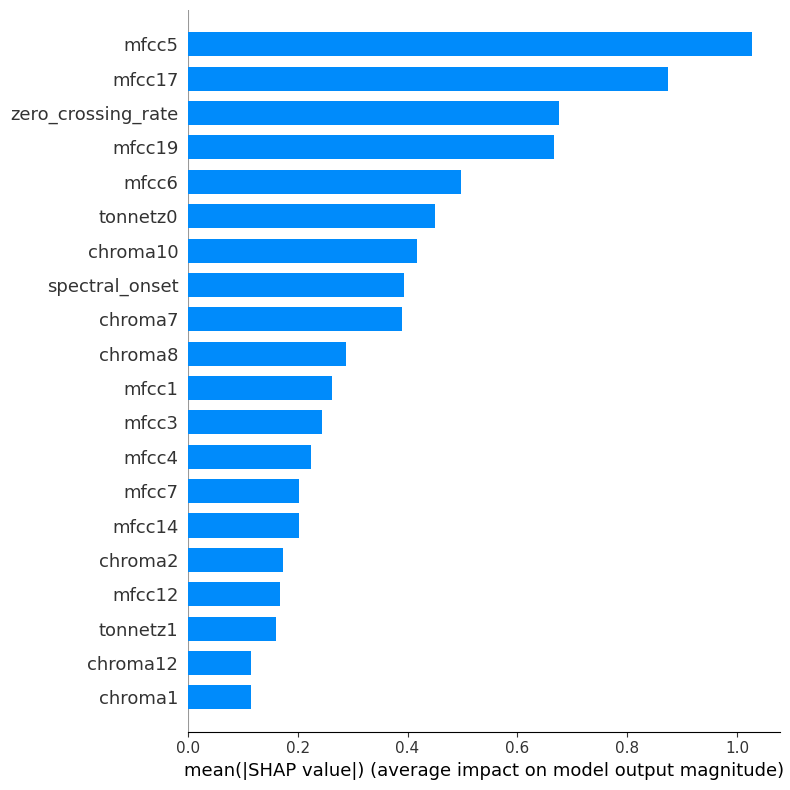

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


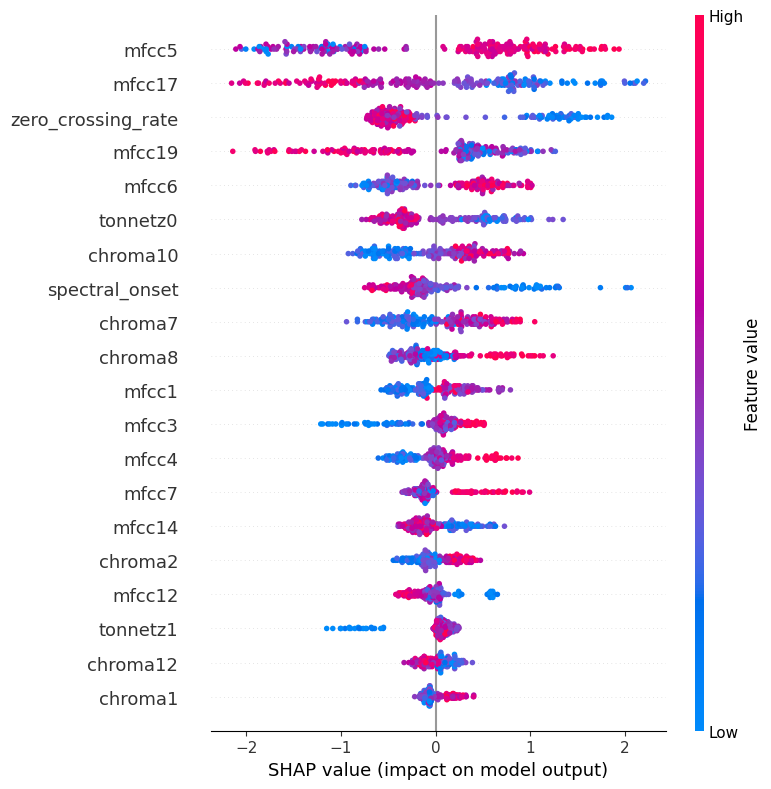

The loss 'auto' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 274 - Acuracia do modelo HistGradientBoostingClassifier(loss='auto', max_bins=250, max_depth=13) do Fold 4: 0.5


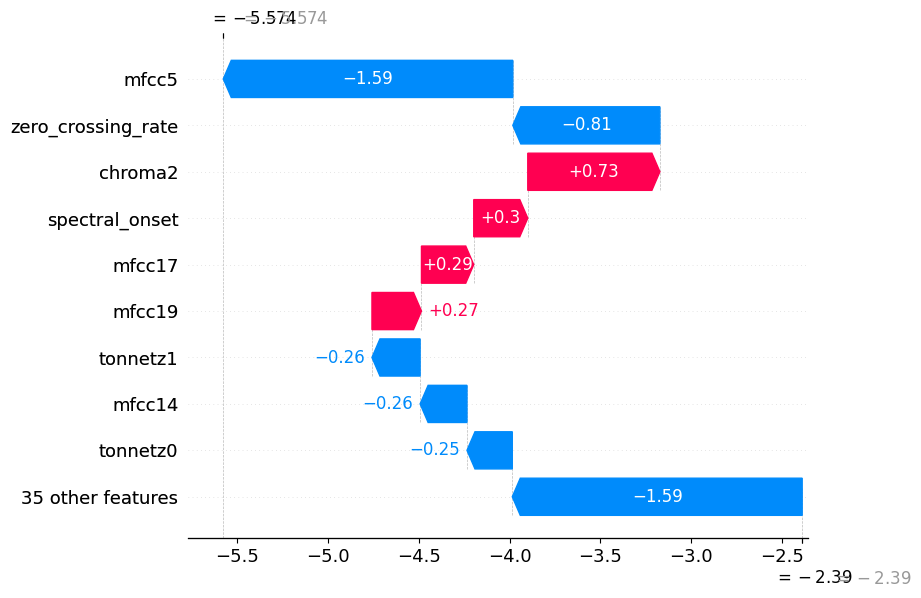

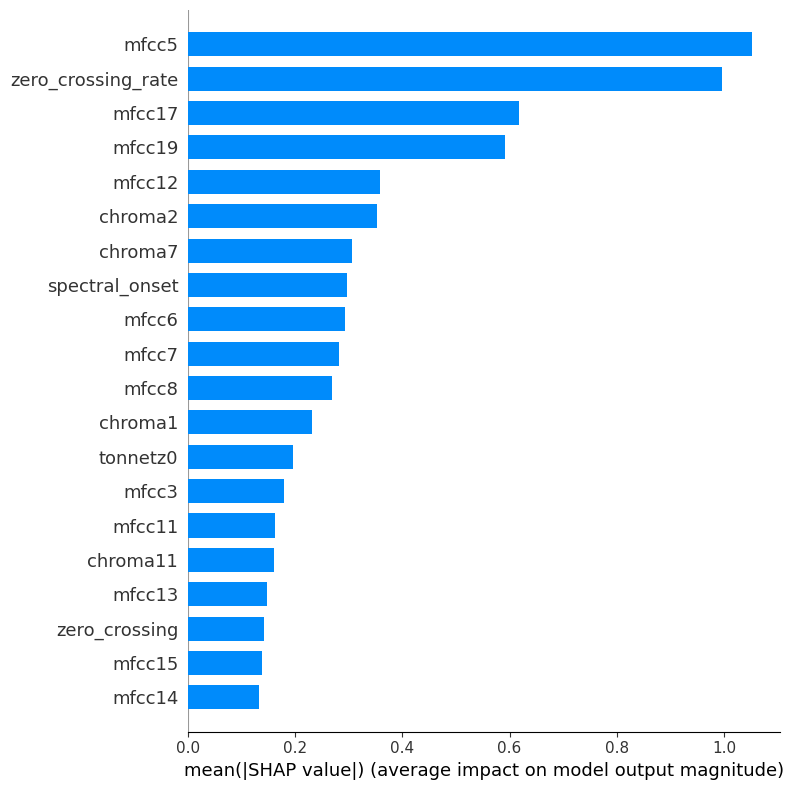

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


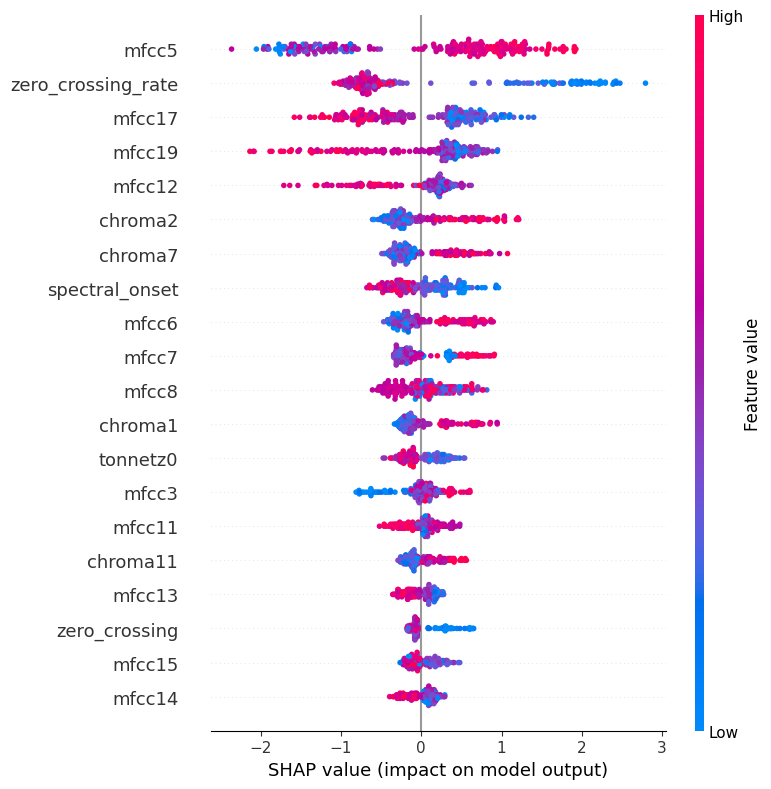

In [52]:
model = HistGradientBoostingClassifier(
    loss = "auto",
    max_bins =250,
    max_depth  = 13,
    min_samples_leaf = 20,
)

results_1_corda = tm.cross_validate_balancead(k=5, model=model,dataframe=df_inst_corda_01, y_pred="instrumento", shap=True)

- Matriz de Confusão

<Axes: title={'center': 'Matriz confusão moodelo 1 corda'}>

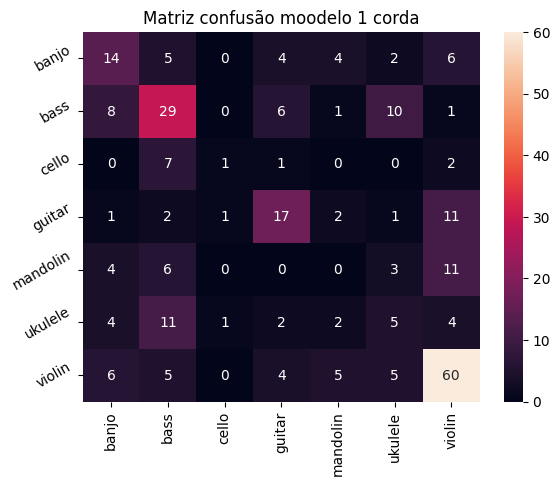

In [53]:
ac.matriz_confusion(
    results_1_corda['y_validate'],
    results_1_corda['predictions'], 
    labels=np.unique(results_1_corda['predictions_cat']),
    title='Matriz confusão moodelo 1 corda',
    rename_labels=True
)
    

### Model 2

- Detected Outilers

In [54]:
outlier_model_2_corda = ac.detected_outilers_knn(metric="euclidean", algorithm="kd_tree", neighbors=5, dataframe=df_inst_corda)

algorithm parameter is deprecated and will be removed in version 0.7.6. By default, ball_tree will be used.


- Removed Outilers 

In [55]:
df_inst_corda_02 = ac.show_outilers(dataframe=df_inst_corda, pred=outlier_model_2_corda["predictions"])
df_inst_corda_02

,tonnetz0,tonnetz1,chroma1,chroma2,chroma3,chroma4,chroma5,chroma6,chroma7,mfcc0,...,spectral_band3,spectral_band4,spectral_centroid,spectral_onset,spectral_rolloff,spectogram,mel_spectogram,zero_crossing_rate,zero_crossing,instrumento
524,0.044009,0.049910,0.422762,0.372759,0.418751,0.342388,0.345684,0.425205,0.419690,-113.403656,...,3044.652344,3451.164410,2589.236162,1.418300,5736.500270,-55.941154,-70.428162,0.124409,27503,banjo
546,-0.019221,0.017872,0.412917,0.454047,0.530891,0.557669,0.349409,0.344261,0.382070,-202.772339,...,3121.737400,3570.616525,3004.965818,1.600475,5830.002334,-78.944046,-80.000000,0.175861,38878,banjo
548,0.104703,-0.251793,0.163021,0.812954,0.344378,0.115020,0.292584,0.153532,0.169621,-140.371948,...,1813.107640,2368.569054,1704.019101,1.065461,2712.683983,-69.137093,-79.591011,0.129967,28745,banjo
555,-0.035994,0.023556,0.502060,0.572897,0.544631,0.463271,0.181727,0.342575,0.116119,-176.971466,...,2058.067108,2538.017416,2065.352164,1.527929,3548.731828,-65.745941,-79.547966,0.154887,34292,banjo
570,0.128059,0.082795,0.264848,0.264230,0.504677,0.353699,0.363608,0.434325,0.461813,-43.627769,...,3373.943533,3736.268165,3178.869223,1.445494,6845.210425,-47.192692,-59.145737,0.158472,35001,banjo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7999,0.188614,-0.123051,0.435805,0.078954,0.048469,0.095815,0.166382,0.088318,0.250419,-390.158630,...,1643.217840,2069.443752,1772.864514,1.268380,2945.977004,-76.595161,-80.000000,0.126178,27872,violin
8016,0.066705,-0.239727,0.177657,0.249958,0.202065,0.227559,0.358576,0.191313,0.535777,-163.197540,...,2648.310002,3258.026601,2049.088272,1.239214,3472.241494,-45.379463,-80.000000,0.128462,28414,violin
8017,0.096697,-0.279816,0.159033,0.078111,0.079078,0.180735,0.292732,0.125269,0.363708,-115.140617,...,2756.730917,3348.078759,2277.244488,1.186836,3779.127109,-50.537724,-80.000000,0.143759,31806,violin
8020,0.015595,-0.058762,0.120028,0.238263,0.234643,0.267743,0.228591,0.260930,0.267262,-324.705627,...,2995.859927,3383.563150,3573.542978,1.354204,6552.813508,-43.596504,-73.498703,0.230540,50962,violin


- Train Model


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
The loss 'categorical_crossentropy' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 274 - Acuracia do modelo HistGradientBoostingClassifier(loss='categorical_crossentropy', max_bins=109,
                               max_depth=20) do Fold 0: 0.41818181818181815


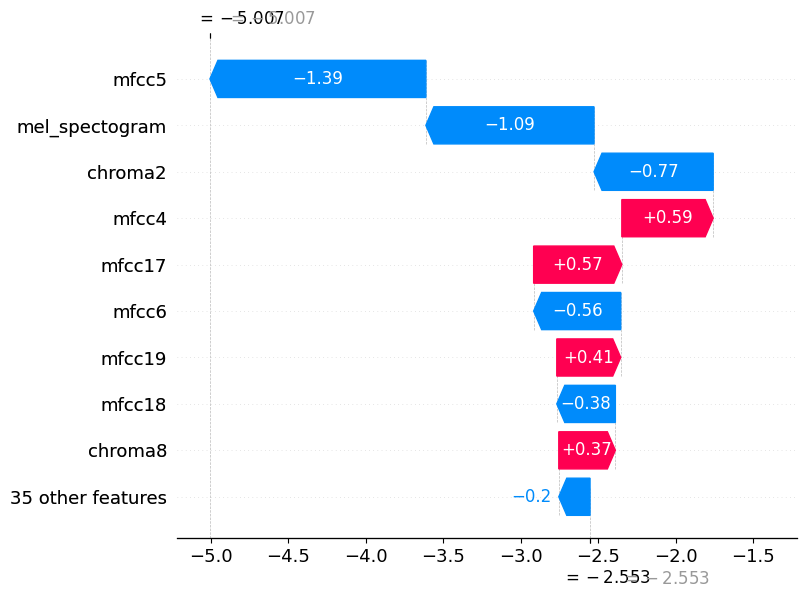

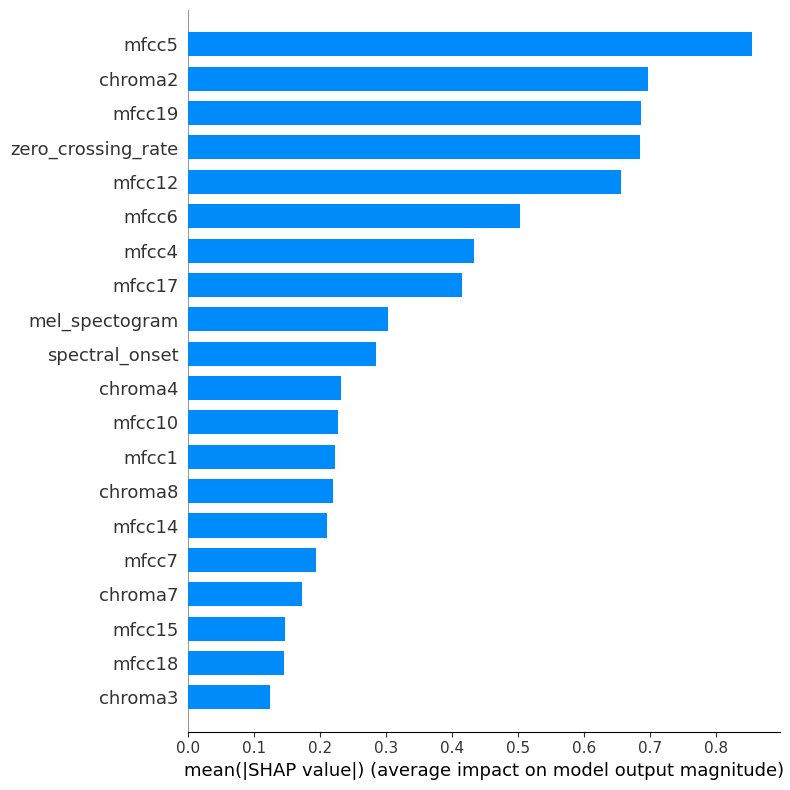

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


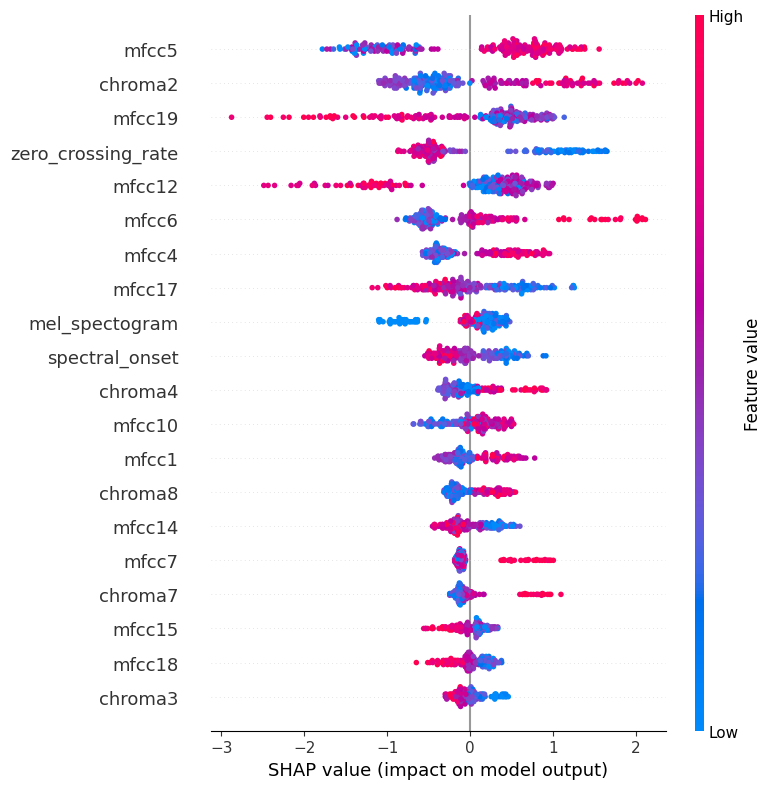

The loss 'categorical_crossentropy' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 274 - Acuracia do modelo HistGradientBoostingClassifier(loss='categorical_crossentropy', max_bins=109,
                               max_depth=20) do Fold 1: 0.45454545454545453


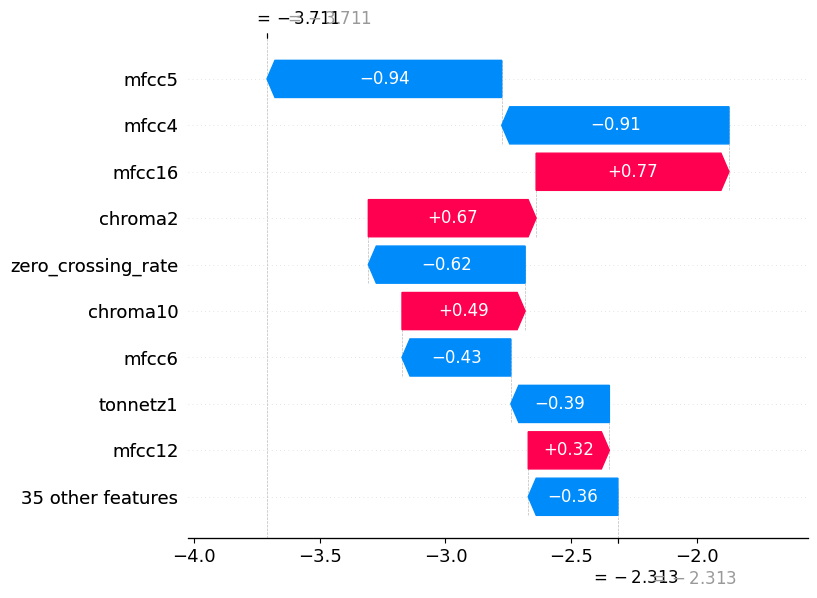

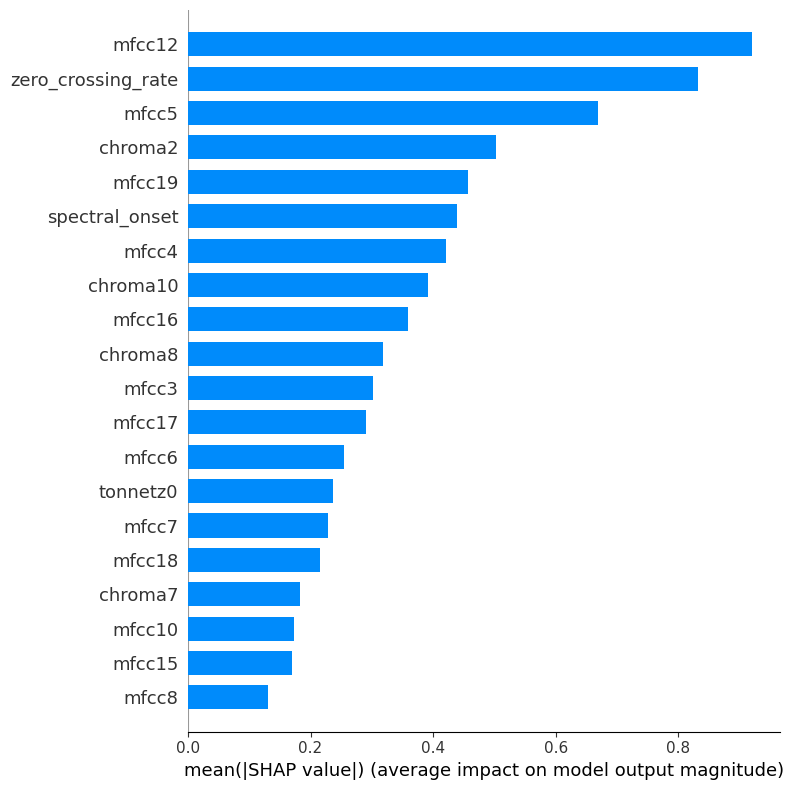

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


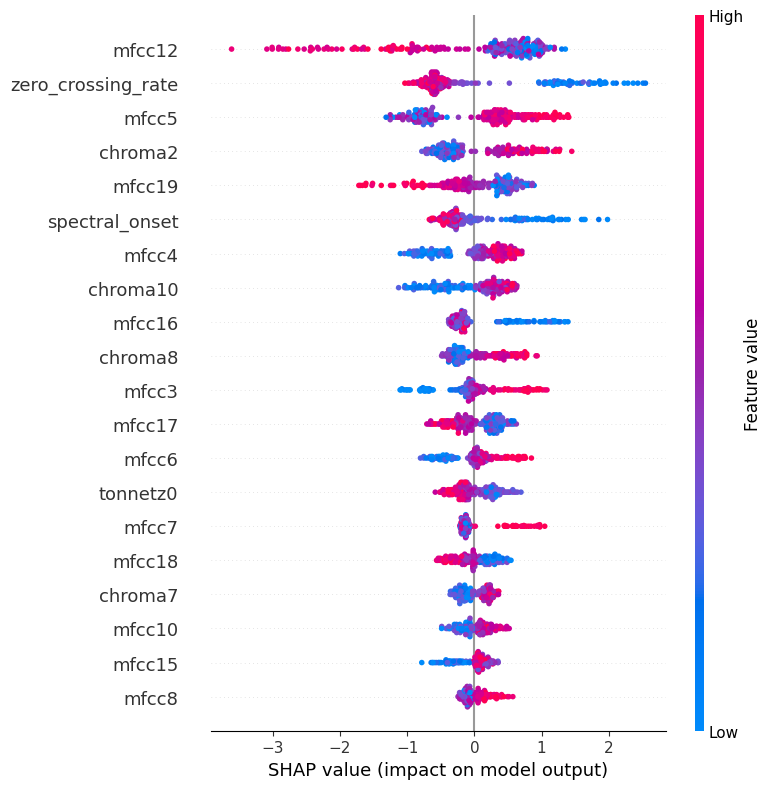

The loss 'categorical_crossentropy' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 274 - Acuracia do modelo HistGradientBoostingClassifier(loss='categorical_crossentropy', max_bins=109,
                               max_depth=20) do Fold 2: 0.43636363636363634


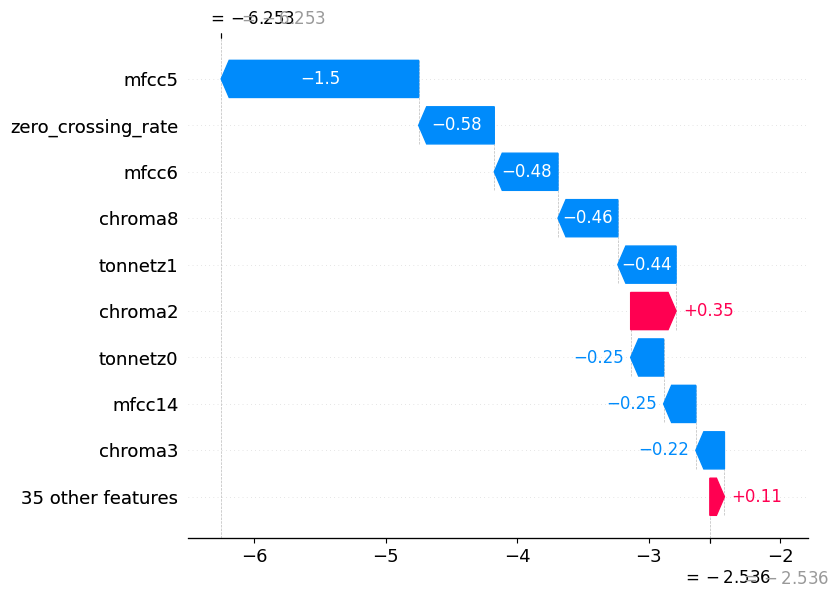

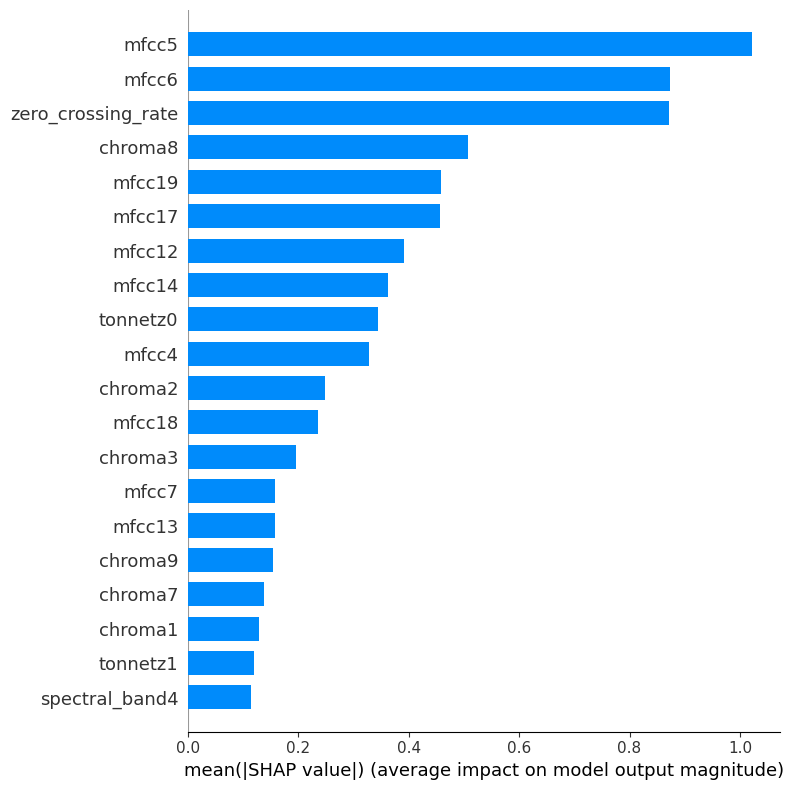

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


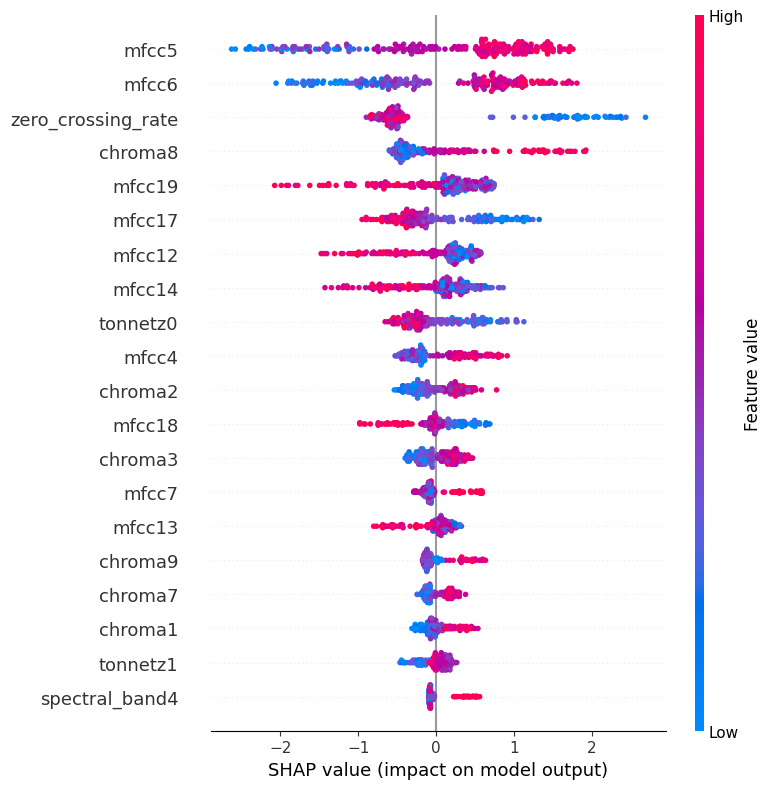

The loss 'categorical_crossentropy' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 274 - Acuracia do modelo HistGradientBoostingClassifier(loss='categorical_crossentropy', max_bins=109,
                               max_depth=20) do Fold 3: 0.6


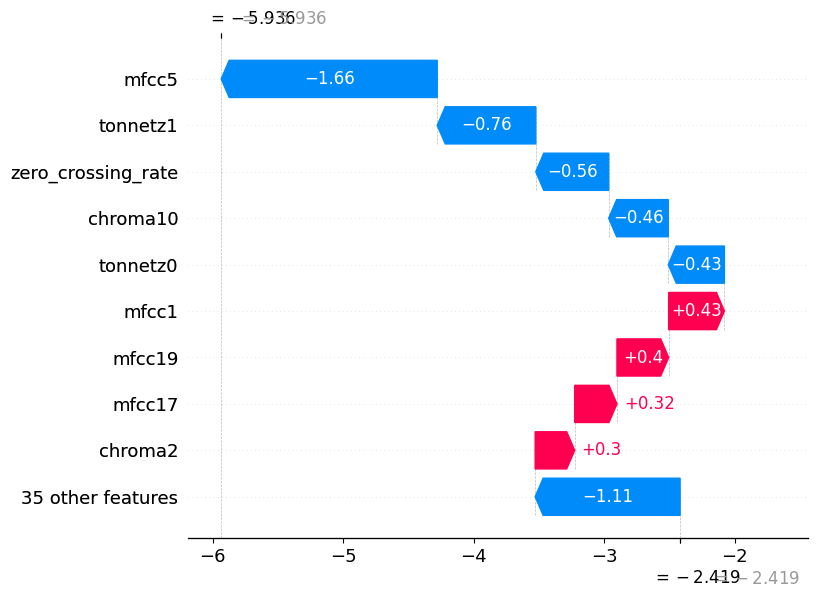

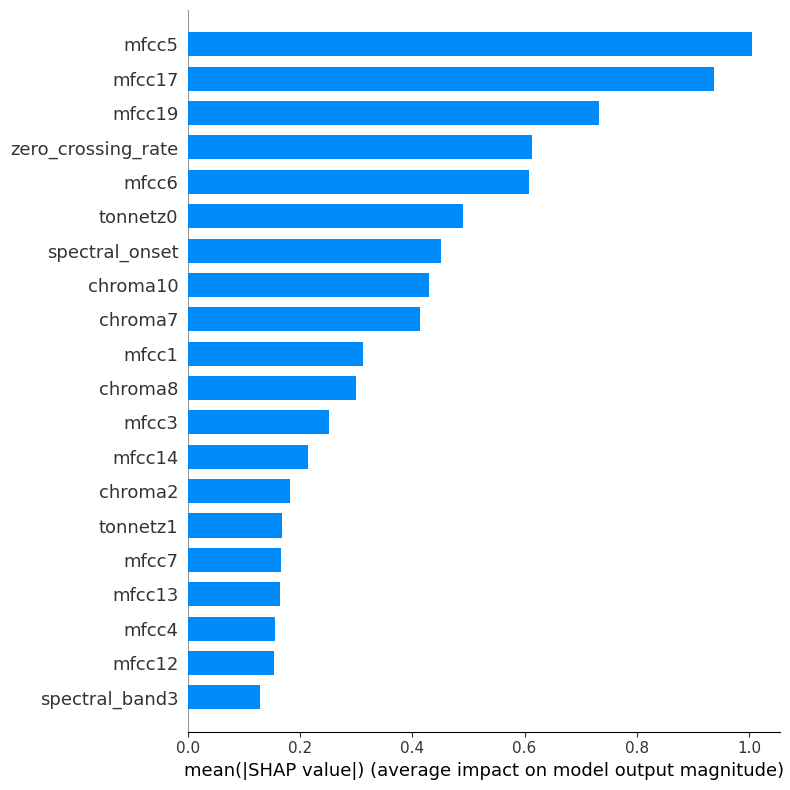

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


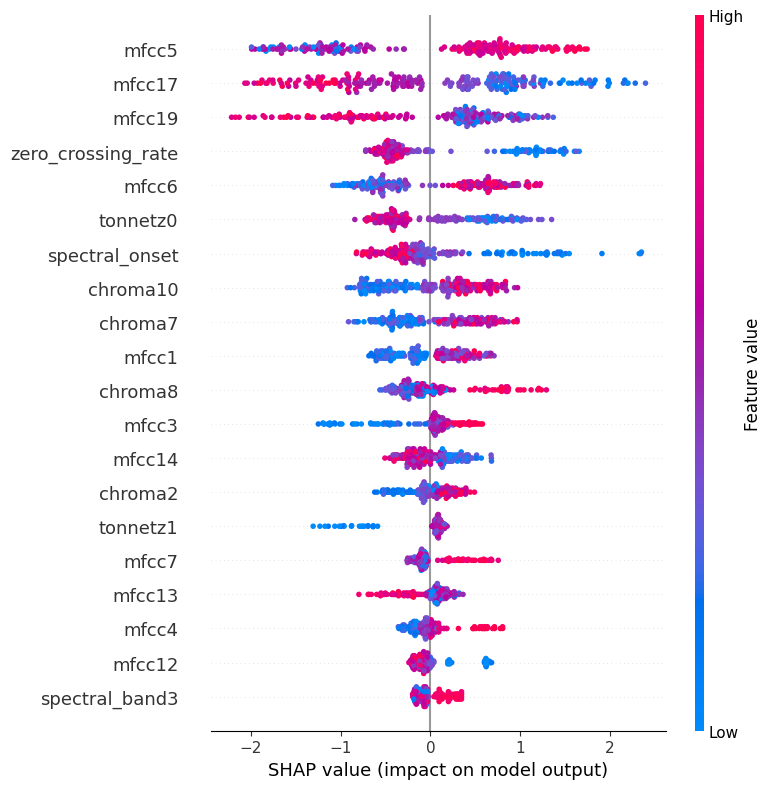

The loss 'categorical_crossentropy' was deprecated in v1.1 and will be removed in version 1.3. Use 'log_loss' which is equivalent.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Tamanho base: 274 - Acuracia do modelo HistGradientBoostingClassifier(loss='categorical_crossentropy', max_bins=109,
                               max_depth=20) do Fold 4: 0.5


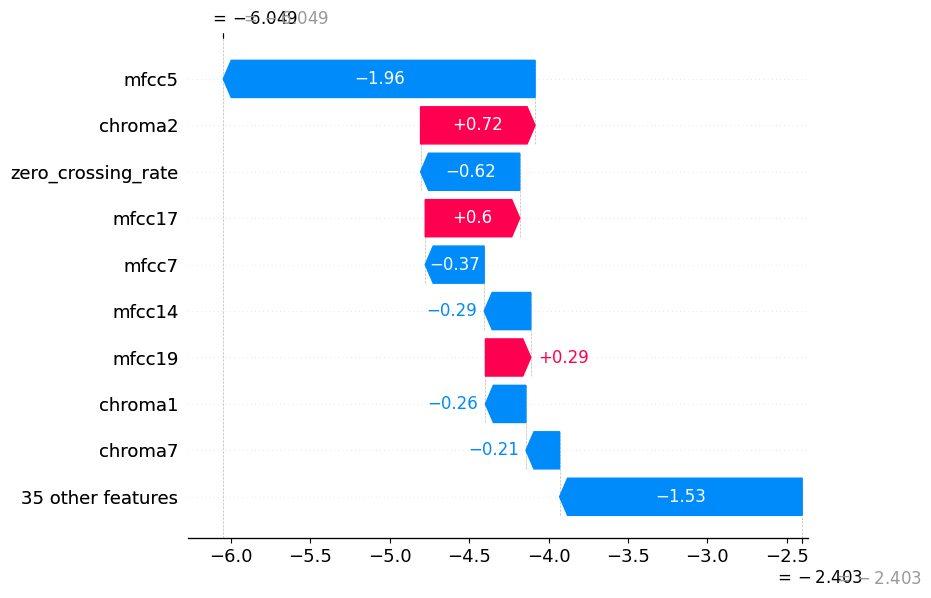

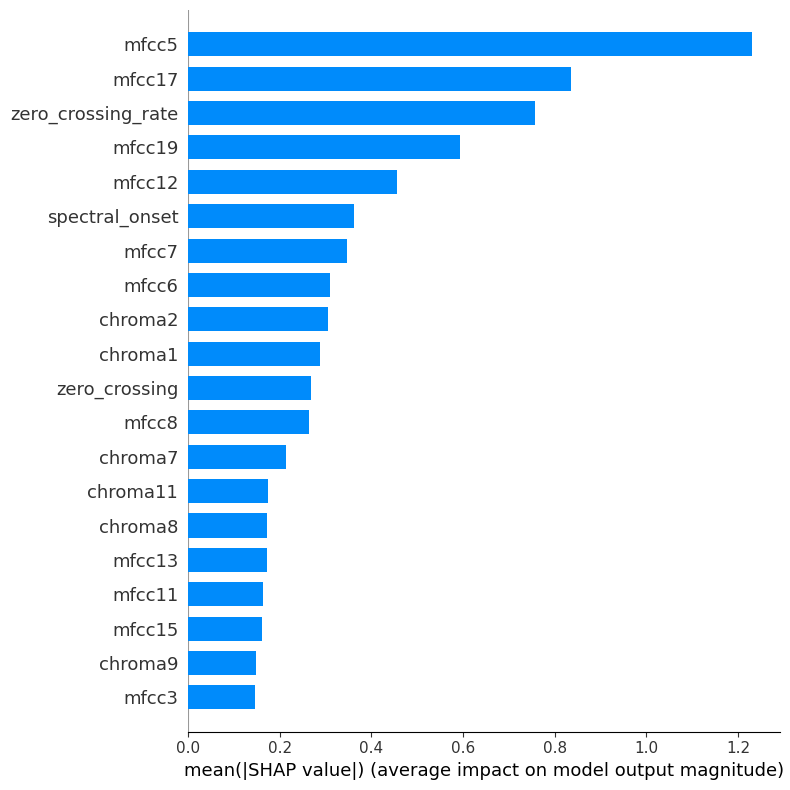

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


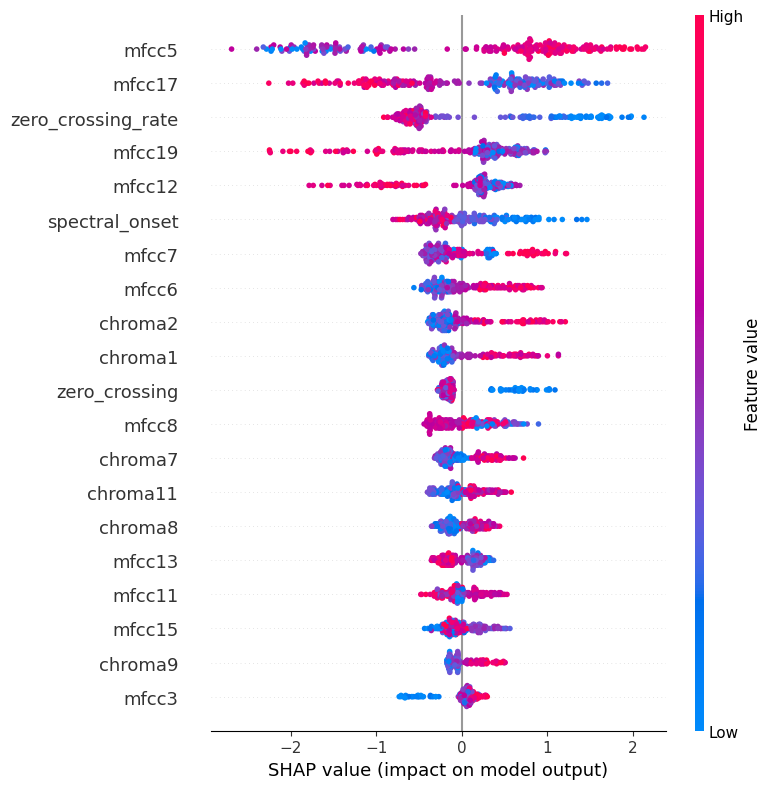

In [56]:
model = HistGradientBoostingClassifier(
    loss = "categorical_crossentropy",
    max_bins =109,
    max_depth  = 20,
    min_samples_leaf = 20,
)

results_2_corda = tm.cross_validate_balancead(k=5, model=model,dataframe=df_inst_corda_02, y_pred="instrumento", shap=True)

- Matrix de confusão

<Axes: title={'center': 'Matriz confusão moodelo 2 corda'}>

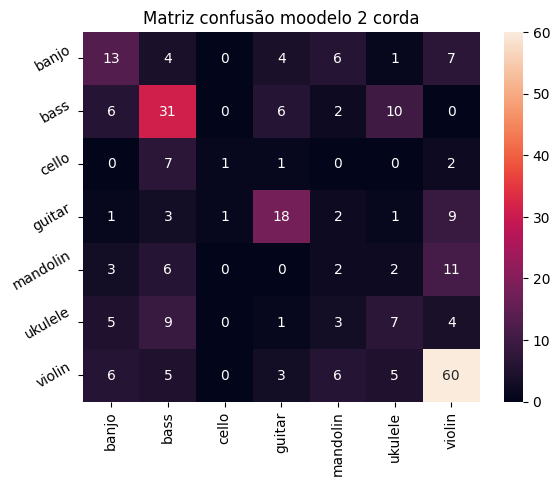

In [57]:
ac.matriz_confusion(
    results_2_corda['y_validate'],
    results_2_corda['predictions'], 
    labels=np.unique(results_2_corda['predictions_cat']),
    title='Matriz confusão moodelo 2 corda',
    rename_labels=True
)
    

# Resultados finais

- Atualizando os resultados

In [58]:
results_2_corda

{'accuracy_mean': 48.18181818181818,
 'std': 0.06504925025453934,
 'predictions': array([4., 4., 6., 3., 4., 1., 4., 1., 1., 1., 1., 0., 5., 1., 1., 5., 1.,
        0., 6., 1., 3., 3., 1., 1., 6., 6., 4., 3., 4., 0., 1., 6., 1., 5.,
        4., 5., 3., 1., 6., 4., 6., 1., 4., 6., 6., 0., 6., 6., 6., 6., 6.,
        3., 3., 6., 6., 3., 6., 3., 1., 0., 5., 6., 3., 1., 0., 5., 1., 1.,
        5., 1., 3., 3., 1., 1., 1., 3., 3., 5., 2., 0., 3., 3., 1., 6., 5.,
        6., 0., 5., 6., 1., 5., 5., 0., 6., 4., 6., 6., 6., 6., 6., 6., 6.,
        4., 6., 5., 6., 1., 6., 6., 1., 1., 0., 4., 1., 0., 3., 4., 0., 0.,
        1., 1., 0., 5., 1., 5., 3., 5., 1., 2., 6., 3., 6., 6., 3., 3., 4.,
        3., 4., 5., 6., 1., 1., 6., 1., 4., 0., 5., 1., 6., 0., 6., 3., 6.,
        6., 5., 6., 6., 6., 6., 6., 0., 6., 1., 6., 1., 0., 0., 0., 0., 0.,
        6., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 6., 6.,
        3., 3., 6., 3., 3., 6., 6., 6., 1., 6., 1., 0., 1., 1., 1., 6., 4.,
       

# Resultados Finais - Retreino!

In [59]:
acuracia_cros_val = results_aerofone_1["accuracy_mean"], results_2_aerofone["accuracy_mean"], results_2_corda["accuracy_mean"], results_1_corda["accuracy_mean"], results_1_percusao["accuracy_mean"], results_2_percusao["accuracy_mean"], results_1_sopro["accuracy_mean"], results_2_sopro["accuracy_mean"]
std_cros_val = results_aerofone_1["std"], results_2_aerofone["std"], results_1_corda["std"], results_2_corda["std"], results_1_percusao["std"], results_2_percusao["std"], results_1_sopro["std"], results_2_sopro["std"]

results_geral["accuracy_models"] = acuracia_cros_val
results_geral["std_accuracy_models"] = std_cros_val
results_geral

NameError: name 'results_2_aerofone' is not defined